In [1]:
#import the necessary libraries and modules

import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import hvplot.xarray
import scipy

In [3]:
#Reading the netcdf file (.nc file) using xarray

ds = xr.open_dataset("cesm2cam6v2.2016-01-25.09.clm2.h0.2016-01-25-00000.nc", engine="netcdf4")

In [4]:
#Displaying the Dataset of netcdf file using xarray

ds

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, hist_interval: 2, lon: 288, lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi
Data variables: (12/56)
    mcdate          (time) int32 ...
    mcsec           (time) int32 ...
    mdcur           (time) int32 ...
    mscur           (time) int32 ...
    nstep           (time) int32 ...
    time_bounds     (time, hist_interval) object ...
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 ...
    SOILWATER_10CM  (time, lat, lon) float32 ...
    TLAI            (time, lat, lon) float32 ...
    TOTECOSYSC      (time, lat, lon) float32 ...
    TOTVEGC         (time, lat, lon) float32 ...
    TWS             (time, lat, lon) float32 ...
Attributes: (12/100)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 09/28/20 10:28:47
    source:                                    Community Land Model CLM4.0
    hostname:                                  cheyenne
    ...                                        ...
    cft_irrigated_switchgrass:                 60
    cft_tropical_corn:                         61
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          day_1

In [5]:
#Information about the dataset

ds.info()

xarray.Dataset {
dimensions:
	levgrnd = 25 ;
	levlak = 10 ;
	levdcmp = 25 ;
	time = 46 ;
	hist_interval = 2 ;
	lon = 288 ;
	lat = 192 ;
	levsoi = 20 ;

variables:
	float32 levgrnd(levgrnd) ;
		levgrnd:long_name = coordinate soil levels ;
		levgrnd:units = m ;
	float32 levlak(levlak) ;
		levlak:long_name = coordinate lake levels ;
		levlak:units = m ;
	float32 levdcmp(levdcmp) ;
		levdcmp:long_name = coordinate soil levels ;
		levdcmp:units = m ;
	object time(time) ;
		time:long_name = time ;
		time:bounds = time_bounds ;
	int32 mcdate(time) ;
		mcdate:long_name = current date (YYYYMMDD) ;
	int32 mcsec(time) ;
		mcsec:long_name = current seconds of current date ;
		mcsec:units = s ;
	int32 mdcur(time) ;
		mdcur:long_name = current day (from base day) ;
	int32 mscur(time) ;
		mscur:long_name = current seconds of current day ;
	int32 nstep(time) ;
		nstep:long_name = time step ;
	object time_bounds(time, hist_interval) ;
		time_bounds:long_name = history time interval endpoints ;
	|S16 da

In [6]:
# variables used in the dataset

ds.data_vars

Data variables:
    mcdate          (time) int32 20160125 20160126 ... 20160310 20160311
    mcsec           (time) int32 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    mdcur           (time) int32 0 1 2 3 4 5 6 7 8 ... 38 39 40 41 42 43 44 45
    mscur           (time) int32 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    nstep           (time) int32 0 48 96 144 192 ... 1968 2016 2064 2112 2160
    time_bounds     (time, hist_interval) object 2016-01-24 23:30:00 ... 2016...
    date_written    (time) |S16 b'09/28/20' b'09/28/20' ... b'09/28/20'
    time_written    (time) |S16 b'10:28:47' ... b'10:56:34{@\x97\xce{@\x97\xce'
    area            (lat, lon) float32 29.95 29.95 29.95 29.95 ... nan nan nan
    landfrac        (lat, lon) float32 1.0 1.0 1.0 1.0 1.0 ... nan nan nan nan
    landmask        (lat, lon) float64 1.0 1.0 1.0 1.0 1.0 ... nan nan nan nan
    pftmask         (lat, lon) float64 1.0 1.0 1.0 1.0 1.0 ... nan nan nan nan
    nbedrock        (lat, lon) float64 20.0

In [7]:
# Dataset dimensions

ds.dims

Frozen({'levgrnd': 25, 'levlak': 10, 'levdcmp': 25, 'time': 46, 'hist_interval': 2, 'lon': 288, 'lat': 192, 'levsoi': 20})

In [8]:
# Dataset coordinates

ds.coords

Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * levlak   (levlak) float32 0.05 0.6 2.1 4.6 8.1 12.6 18.6 25.6 34.33 44.78
  * levdcmp  (levdcmp) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0

In [9]:
# Dataset global attributes

ds.attrs

{'title': 'CLM History file information',
 'comment': 'NOTE: None of the variables are weighted by land fraction!',
 'Conventions': 'CF-1.0',
 'history': 'created on 09/28/20 10:28:47',
 'source': 'Community Land Model CLM4.0',
 'hostname': 'cheyenne',
 'username': 'ssfcst',
 'version': 'cesm2.1.2-rc.01',
 'revision_id': '$Id: histFileMod.F90 42903 2012-12-21 15:32:10Z muszala $',
 'case_title': 'UNSET',
 'case_id': 'cesm2cam6.2016-01-25.09',
 'Surface_dataset': 'surfdata_0.9x1.25_hist_78pfts_CMIP6_simyr1850_c190214.nc',
 'Initial_conditions_dataset': 'finidat_interp_dest.nc',
 'PFT_physiological_constants_dataset': 'clm5_params.c171117.nc',
 'ltype_vegetated_or_bare_soil': 1,
 'ltype_crop': 2,
 'ltype_UNUSED': 3,
 'ltype_landice_multiple_elevation_classes': 4,
 'ltype_deep_lake': 5,
 'ltype_wetland': 6,
 'ltype_urban_tbd': 7,
 'ltype_urban_hd': 8,
 'ltype_urban_md': 9,
 'ctype_vegetated_or_bare_soil': 1,
 'ctype_crop': 2,
 'ctype_crop_noncompete': '2*100+m, m=cft_lb,cft_ub',
 'ctype_l

In [10]:
#Displaying the dataset in text format

with xr.set_options(display_style="text"):
    print(ds)

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, hist_interval: 2, lon: 288, lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi
Data variables: (12/56)
    mcdate          (time) int32 20160125 20160126 ... 20160310 20160311
    mcsec           (time) int32 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    mdcur           (time) int32 0 1 2 3 4 5 6 7 8 ... 38 39 40 41 42 43 44 45
    mscur           (time) int32 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 

In [11]:
# Extract the H2OSOI (volumetric soil water) variable (data_array) 

ds["H2OSOI"]

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20, lat: 192, lon: 288)>
[50872320 values with dtype=float32]
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [12]:
# ds["H2OSOI"] is equivalent to ds.H2OSOI

ds.H2OSOI

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20, lat: 192, lon: 288)>
[50872320 values with dtype=float32]
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [13]:
# Datarray coordinates of H2OSOI

ds["H2OSOI"].coords

Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0

In [14]:
# Dataarray attributes of H2OSOI

ds["H2OSOI"].attrs

{'long_name': 'volumetric soil water (vegetated landunits only)',
 'units': 'mm3/mm3',
 'cell_methods': 'time: mean'}

In [15]:
#Assigning the H2OSOI Dataarray in a temporary variable (temp_1)

temp_1 = ds["H2OSOI"].data

In [16]:
#Displaying the shape and n-dimensions of H2OSOI

temp_1.shape, temp_1.ndim

((46, 20, 192, 288), 4)

(array([2674739., 2186502., 2910027., 3681272., 1748960.,  344789.,
         168520.,  142374.,  127385.,   69352.]),
 array([1.83378288e-05, 1.01043336e-01, 2.02068344e-01, 3.03093344e-01,
        4.04118329e-01, 5.05143344e-01, 6.06168330e-01, 7.07193315e-01,
        8.08218360e-01, 9.09243345e-01, 1.01026833e+00], dtype=float32),
 <BarContainer object of 10 artists>)

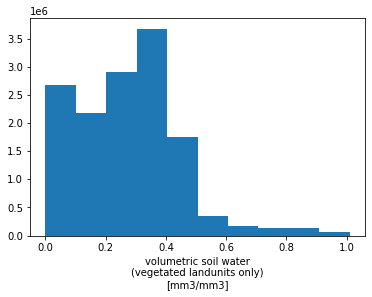

In [17]:
#Visualizing the H2OSOI variable using plot() function

ds.H2OSOI.plot()

In [18]:
#Visualizing the H2OSOI variable using holoview plot function

ds.H2OSOI.hvplot()

:NdOverlay   [Element]
   :Histogram   [H2OSOI]   (H2OSOI_count)

In [19]:
# Extract the DZSOI (soil thickness) variable (data_array)

ds["DZSOI"]

<xarray.DataArray 'DZSOI' (levgrnd: 25, lat: 192, lon: 288)>
[1382400 values with dtype=float32]
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Attributes:
    long_name:  soil thickness
    units:      m

In [20]:
# ds["DZSOI"] is equivalent to ds.DZSOI

ds.DZSOI

<xarray.DataArray 'DZSOI' (levgrnd: 25, lat: 192, lon: 288)>
[1382400 values with dtype=float32]
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Attributes:
    long_name:  soil thickness
    units:      m

In [21]:
# Datarray coordinates of DZSOI

ds["DZSOI"].coords

Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0

In [22]:
# Dataarray attributes of DZSOI

ds["DZSOI"].attrs

{'long_name': 'soil thickness', 'units': 'm'}

In [23]:
#Assigning the DZSOI Dataarray in a temporary variable (temp_2)

temp_2 = ds["DZSOI"].data

In [24]:
#Displaying the shape and n-dimension of DZSOI variable

temp_2.shape, temp_2.ndim

((25, 192, 288), 3)

(array([420260.,  21013.,      0.,  21013.,      0.,  21013.,      0.,
         21013.,      0.,  21013.]),
 array([ 0.02     ,  1.5295426,  3.039085 ,  4.5486274,  6.05817  ,
         7.567713 ,  9.077255 , 10.586798 , 12.09634  , 13.605883 ,
        15.115425 ], dtype=float32),
 <BarContainer object of 10 artists>)

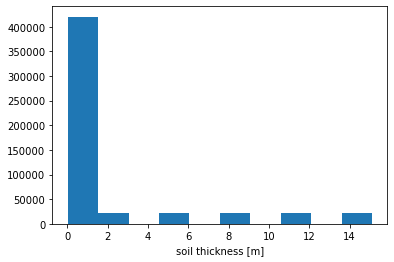

In [25]:
#Visualizing the DZSOI variable using plot() function

ds.DZSOI.plot()

In [26]:
#Visualizing the DZSOI variable using holoview plot function

ds.DZSOI.hvplot()

:NdOverlay   [Element]
   :Histogram   [DZSOI]   (DZSOI_count)

In [27]:
# Extract the ZSOI (soil depth) variable (data_array)

ds["ZSOI"]

<xarray.DataArray 'ZSOI' (levgrnd: 25, lat: 192, lon: 288)>
[1382400 values with dtype=float32]
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Attributes:
    long_name:  soil depth
    units:      m

In [28]:
# ds["ZSOI"] is equivalent to ds.ZSOI

ds.ZSOI

<xarray.DataArray 'ZSOI' (levgrnd: 25, lat: 192, lon: 288)>
[1382400 values with dtype=float32]
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Attributes:
    long_name:  soil depth
    units:      m

In [29]:
# Datarray coordinates

ds["ZSOI"].coords

Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0

In [30]:
# Dataarray attributes

ds["ZSOI"].attrs

{'long_name': 'soil depth', 'units': 'm'}

In [31]:
#Assinging the ZSOI variable to a temporary variabel (temp_3)

temp_3 = ds["ZSOI"].data

In [32]:
#Displaying the shape and n-dimension of ZSOI variable

temp_3.shape, temp_3.ndim

((25, 192, 288), 3)

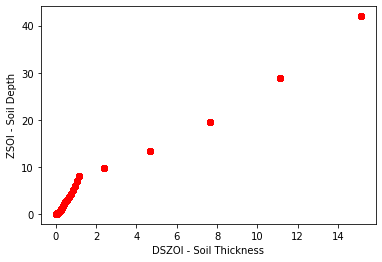

In [33]:
#Plotting the DZSOI and ZSOI variables using scatter() function

plt.scatter(ds.DZSOI,ds.ZSOI,color="red")
plt.xlabel("DSZOI - Soil Thickness")
plt.ylabel("ZSOI - Soil Depth")
plt.show()

In [34]:
#Positional selction of H2OSOI variable with original object i.e. no selection

ds.H2OSOI.isel()

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20, lat: 192, lon: 288)>
array([[[[nan, ..., nan],
         ...,
         [nan, ..., nan]],

        ...,

        [[nan, ..., nan],
         ...,
         [nan, ..., nan]]],


       ...,


       [[[nan, ..., nan],
         ...,
         [nan, ..., nan]],

        ...,

        [[nan, ..., nan],
         ...,
         [nan, ..., nan]]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [35]:
#Positional selection of H2OSOI variable with latitude position = 100 (i.e. 101th latitude value)

ds.H2OSOI.isel(lat=100)

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20, lon: 288)>
array([[[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       ...,

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lat      float32 4.241
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

(array([10365.,   293.,  1109.,  2824.,  5745., 14050., 19350.,  8181.,
         1309.,   254.]),
 array([4.3859185e-05, 5.5522487e-02, 1.1100111e-01, 1.6647974e-01,
        2.2195837e-01, 2.7743700e-01, 3.3291563e-01, 3.8839427e-01,
        4.4387287e-01, 4.9935150e-01, 5.5483013e-01], dtype=float32),
 <BarContainer object of 10 artists>)

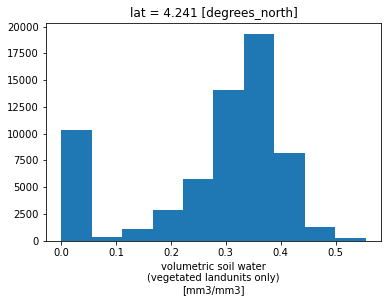

In [36]:
#Plot Diagram - H2OSOI variable with latitude position = 100 (i.e. 101th latitude value)

ds.H2OSOI.isel(lat=100).plot()

In [38]:
#ds.H2OSOI.sel(lat=34.0522, lon=241.75, method='nearest').plot()

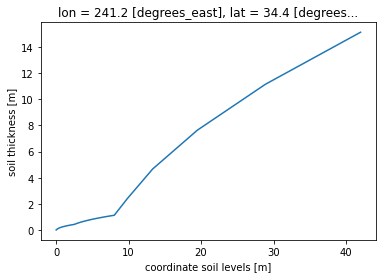

In [39]:
ds.DZSOI.sel(lat=34.0522, lon=241.75, method='nearest').plot()

In [40]:
#Positional selection of H2OSOI variable with latitude position = 100 & last two values of the co-ordinate [time]

ds.H2OSOI.isel(lat=100, time=[-2, -1])

<xarray.DataArray 'H2OSOI' (time: 2, levsoi: 20, lon: 288)>
array([[[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-03-10 00:00:00 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lat      float32 4.241
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

(array([450.,  17.,  35., 114., 227., 465., 993., 266., 183.,  10.]),
 array([4.3859185e-05, 5.3219710e-02, 1.0639556e-01, 1.5957141e-01,
        2.1274726e-01, 2.6592311e-01, 3.1909895e-01, 3.7227482e-01,
        4.2545065e-01, 4.7862652e-01, 5.3180236e-01], dtype=float32),
 <BarContainer object of 10 artists>)

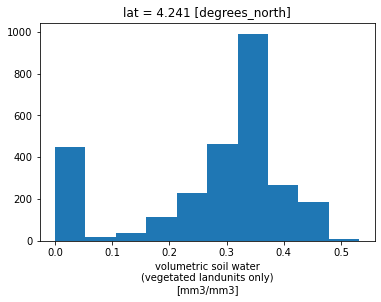

In [41]:
#Plot Diagram - H2OSOI variable with latitude position = 100 & last two values of the co-ordinate [time]

ds.H2OSOI.isel(lat=100, time=[-2, -1]).plot()

In [42]:
#Positional selection of H2OSOI variable with longitude position = 100 & values from positions (11-20) of co-ordinate [time]

ds.H2OSOI.isel(lon=100, time=slice(10, 20))

<xarray.DataArray 'H2OSOI' (time: 10, levsoi: 20, lat: 192)>
array([[[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       ...,

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-02-04 00:00:00 ... 2016-02-13 00:00:00
    lon      float32 125.0
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

(array([3029., 1645., 2138., 4203., 1788.,  618.,  209.,  230.,  130.,
         410.]),
 array([1.8337829e-05, 9.4875336e-02, 1.8973233e-01, 2.8458932e-01,
        3.7944633e-01, 4.7430333e-01, 5.6916034e-01, 6.6401732e-01,
        7.5887430e-01, 8.5373133e-01, 9.4858831e-01], dtype=float32),
 <BarContainer object of 10 artists>)

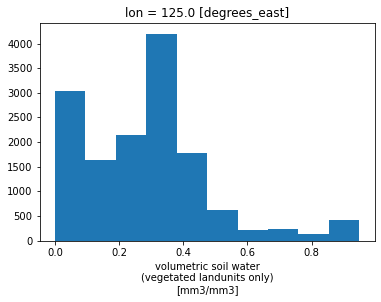

In [43]:
#Plot Diagram - H2OSOI variable with longitude position = 100 & values from positions (11-20) of co-ordinate [time]

ds.H2OSOI.isel(lon=100, time=slice(10, 20)).plot()

In [44]:
#Labelled selection of H2OSOI variable with co-ordinate [time = 2016]

ds.H2OSOI.sel(time="2016")

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20, lat: 192, lon: 288)>
array([[[[nan, ..., nan],
         ...,
         [nan, ..., nan]],

        ...,

        [[nan, ..., nan],
         ...,
         [nan, ..., nan]]],


       ...,


       [[[nan, ..., nan],
         ...,
         [nan, ..., nan]],

        ...,

        [[nan, ..., nan],
         ...,
         [nan, ..., nan]]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

(array([2674739., 2186502., 2910027., 3681272., 1748960.,  344789.,
         168520.,  142374.,  127385.,   69352.]),
 array([1.83378288e-05, 1.01043336e-01, 2.02068344e-01, 3.03093344e-01,
        4.04118329e-01, 5.05143344e-01, 6.06168330e-01, 7.07193315e-01,
        8.08218360e-01, 9.09243345e-01, 1.01026833e+00], dtype=float32),
 <BarContainer object of 10 artists>)

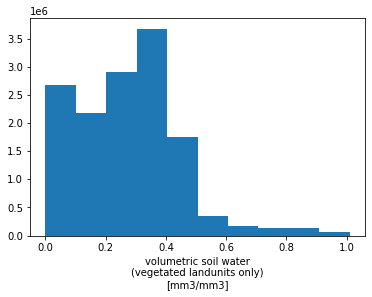

In [45]:
#Plot Diagram - H2OSOI variable with co-ordinate [time = 2016]

ds.H2OSOI.sel(time="2016").plot()

In [46]:
#Labelled selection of H2OSOI variable with co-ordinate [time] from 25th Jan 2016 to 10th Feb 2016

ds.H2OSOI.sel(time=slice("2016-01-25", "2016-02-10"))

<xarray.DataArray 'H2OSOI' (time: 17, levsoi: 20, lat: 192, lon: 288)>
array([[[[nan, ..., nan],
         ...,
         [nan, ..., nan]],

        ...,

        [[nan, ..., nan],
         ...,
         [nan, ..., nan]]],


       ...,


       [[[nan, ..., nan],
         ...,
         [nan, ..., nan]],

        ...,

        [[nan, ..., nan],
         ...,
         [nan, ..., nan]]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-02-10 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

(array([ 987678.,  810387., 1067561., 1363306.,  650506.,  127778.,
          61744.,   52532.,   47530.,   24818.]),
 array([1.8337829e-05, 1.0101659e-01, 2.0201483e-01, 3.0301309e-01,
        4.0401134e-01, 5.0500959e-01, 6.0600781e-01, 7.0700610e-01,
        8.0800432e-01, 9.0900260e-01, 1.0100008e+00], dtype=float32),
 <BarContainer object of 10 artists>)

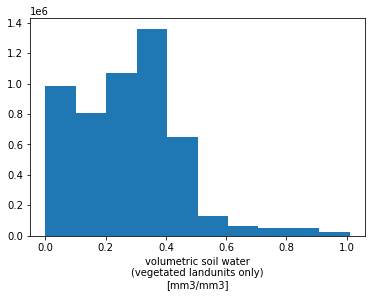

In [47]:
#Plot Diagram - H2OSOI variable with co-ordinate [time] from 25th Jan 2016 to 10th Feb 2016

ds.H2OSOI.sel(time=slice("2016-01-25", "2016-02-10")).plot()

In [48]:
#Labelled Selection of H2OSOI variable with co-ordinates [lat,lon] in floating point numbers using nearest neighbour method

ds.H2OSOI.sel(lat=39.5, lon=105.7, method='nearest')

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20)>
array([[0.301744, 0.422457, 0.48438 , ..., 0.314333, 0.330402, 0.381682],
       [0.30087 , 0.422457, 0.48438 , ..., 0.314331, 0.330424, 0.381784],
       [0.299238, 0.422456, 0.48438 , ..., 0.314327, 0.33046 , 0.381839],
       ...,
       [0.362596, 0.348632, 0.344404, ..., 0.313285, 0.330297, 0.381839],
       [0.361888, 0.352594, 0.350816, ..., 0.313256, 0.330291, 0.381838],
       [0.370137, 0.365367, 0.362568, ..., 0.313227, 0.330285, 0.381839]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 106.2
    lat      float32 39.11
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [50]:
#Plot Diagram - H2OSOI variable with co-ordinates [lat,lon] in floating point numbers using nearest neighbour method

#ds.H2OSOI.sel(lat=39.5, lon=105.7, method='nearest').plot()

In [51]:
#Labelled Selection of H2OSOI variable with co-ordinates [lat,lon] in floating point numbers using slice method

ds.H2OSOI.sel(lat=slice(39, 39.5), lon=slice(106.1, 106.3))

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20, lat: 1, lon: 1)>
array([[[[0.301744]],

        ...,

        [[0.381682]]],


       ...,


       [[[0.370137]],

        ...,

        [[0.381839]]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 106.2
  * lat      (lat) float32 39.11
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [53]:
#Plot Diagram - H2OSOI variable with co-ordinates [lat,lon] in floating point numbers using slice method

#ds.H2OSOI.sel(lat=slice(39, 39.5), lon=slice(106.1, 106.3)).plot()

In [54]:
#Selection of dataarray using Interpolation function by co-ordinate lable [lat] 

ds.H2OSOI.interp(lat=[10, 10.1, 10.2], method='nearest')

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20, lat: 3, lon: 288)>
array([[[[6.91723973e-02, 5.87225594e-02, 1.41696110e-01, ...,
          1.54584661e-01, 1.69781640e-01, 6.86665103e-02],
         [6.91723973e-02, 5.87225594e-02, 1.41696110e-01, ...,
          1.54584661e-01, 1.69781640e-01, 6.86665103e-02],
         [6.91723973e-02, 5.87225594e-02, 1.41696110e-01, ...,
          1.54584661e-01, 1.69781640e-01, 6.86665103e-02]],

        [[1.67403579e-01, 1.57517537e-01, 1.94187030e-01, ...,
          2.03106791e-01, 2.04721570e-01, 1.68407187e-01],
         [1.67403579e-01, 1.57517537e-01, 1.94187030e-01, ...,
          2.03106791e-01, 2.04721570e-01, 1.68407187e-01],
         [1.67403579e-01, 1.57517537e-01, 1.94187030e-01, ...,
          2.03106791e-01, 2.04721570e-01, 1.68407187e-01]],

        [[1.90446213e-01, 1.81992218e-01, 2.15230644e-01, ...,
          2.27983579e-01, 2.24466041e-01, 1.92255944e-01],
         [1.90446213e-01, 1.81992218e-01, 2.15230644e-01, ...,
          2.27983579e-01, 2.24466041e-01, 1.92255944e-01],
         [1.90446213e-01, 1.81992218e-01, 2.15230644e-01, ...,
          2.27983579e-01, 2.24466041e-01, 1.92255944e-01]],
...
          1.38297866e-04, 1.38297866e-04, 2.96576619e-01],
         [3.15092832e-01, 5.31914884e-05, 1.38297866e-04, ...,
          1.38297866e-04, 1.38297866e-04, 2.96576619e-01],
         [3.15092832e-01, 5.31914884e-05, 1.38297866e-04, ...,
          1.38297866e-04, 1.38297866e-04, 2.96576619e-01]],

        [[3.94375771e-01, 4.80769231e-05, 1.25000006e-04, ...,
          1.25000006e-04, 1.25000006e-04, 3.22528213e-01],
         [3.94375771e-01, 4.80769231e-05, 1.25000006e-04, ...,
          1.25000006e-04, 1.25000006e-04, 3.22528213e-01],
         [3.94375771e-01, 4.80769231e-05, 1.25000006e-04, ...,
          1.25000006e-04, 1.25000006e-04, 3.22528213e-01]],

        [[4.23480004e-01, 4.38596508e-05, 1.14035087e-04, ...,
          1.14035087e-04, 1.14035087e-04, 4.20382231e-01],
         [4.23480004e-01, 4.38596508e-05, 1.14035087e-04, ...,
          1.14035087e-04, 1.14035087e-04, 4.20382231e-01],
         [4.23480004e-01, 4.38596508e-05, 1.14035087e-04, ...,
          1.14035087e-04, 1.14035087e-04, 4.20382231e-01]]]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float64 10.0 10.1 10.2
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

(array([37596.,  5760.,  4020.,  7311., 24078., 41238., 50820., 35268.,
        16203.,  9546.]),
 array([4.3859651e-05, 4.6923473e-02, 9.3803085e-02, 1.4068270e-01,
        1.8756232e-01, 2.3444194e-01, 2.8132156e-01, 3.2820117e-01,
        3.7508076e-01, 4.2196038e-01, 4.6884000e-01], dtype=float32),
 <BarContainer object of 10 artists>)

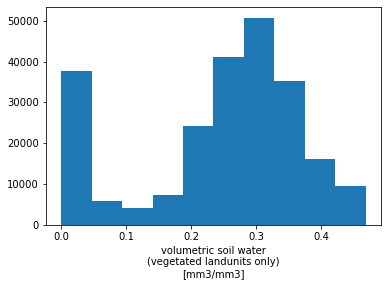

In [55]:
#Plot Diagram - Dataarray using Interpolation function by co-ordinate lable [lat] 

ds.H2OSOI.interp(lat=[10, 10.1, 10.2], method='nearest').plot()

In [56]:
#Positional selection of DZSOI variable with latitude position = 100

ds.DZSOI.isel(lat=100)

<xarray.DataArray 'DZSOI' (levgrnd: 25, lon: 288)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lat      float32 4.241
Attributes:
    long_name:  soil thickness
    units:      m

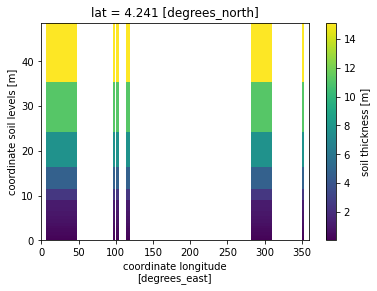

In [57]:
#Plot Diagram - DZSOI variable with latitude position = 100

ds.DZSOI.isel(lat=100).plot()

In [58]:
#Positional selection of DZSOI variable with latitude position = 100 & last two values of the co-ordinate [levgrnd]

ds.DZSOI.isel(lat=100, levgrnd=[-2, -1])

<xarray.DataArray 'DZSOI' (levgrnd: 2, lon: 288)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lat      float32 4.241
Attributes:
    long_name:  soil thickness
    units:      m

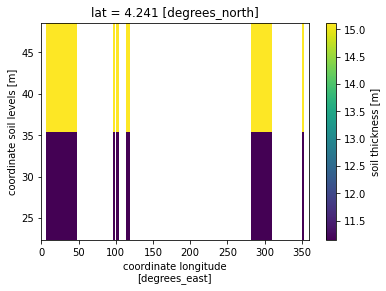

In [59]:
#Plot Diagram - DZSOI variable with latitude position = 100 & last two values of the co-ordinate [levgrnd]

ds.DZSOI.isel(lat=100, levgrnd=[-2, -1]).plot()

In [60]:
#Positional selection of DZSOI variable with longitude position = 100 & values from positions (11-20) of co-ordinate [levgrnd]

ds.DZSOI.isel(lon=100, levgrnd=slice(10, 20))

<xarray.DataArray 'DZSOI' (levgrnd: 10, lat: 192)>
array([[0.36, 0.36, 0.36, ...,  nan,  nan,  nan],
       [0.4 , 0.4 , 0.4 , ...,  nan,  nan,  nan],
       [0.44, 0.44, 0.44, ...,  nan,  nan,  nan],
       ...,
       [0.94, 0.94, 0.94, ...,  nan,  nan,  nan],
       [1.04, 1.04, 1.04, ...,  nan,  nan,  nan],
       [1.14, 1.14, 1.14, ...,  nan,  nan,  nan]], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 1.7 2.08 2.5 2.99 3.58 4.27 5.06 5.95 6.94 8.03
    lon      float32 125.0
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Attributes:
    long_name:  soil thickness
    units:      m

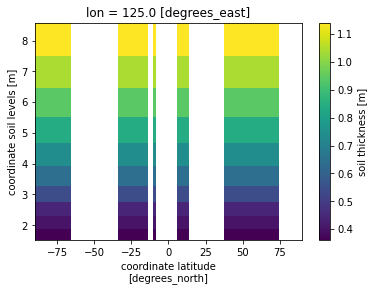

In [61]:
#Plot Diagram - DZSOI variable with longitude position = 100 & values from positions (11-20) of co-ordinate [levgrnd]

ds.DZSOI.isel(lon=100, levgrnd=slice(10, 20)).plot()

In [62]:
#Labelled selection of DZSOI variable with co-ordinate [levgrnd = 6.94]

ds.DZSOI.sel(levgrnd="6.94")

<xarray.DataArray 'DZSOI' (lat: 192, lon: 288)>
array([[1.04, 1.04, 1.04, ..., 1.04, 1.04, 1.04],
       [1.04, 1.04, 1.04, ..., 1.04, 1.04, 1.04],
       [1.04, 1.04, 1.04, ..., 1.04, 1.04, 1.04],
       ...,
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan]], dtype=float32)
Coordinates:
    levgrnd  float32 6.94
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Attributes:
    long_name:  soil thickness
    units:      m

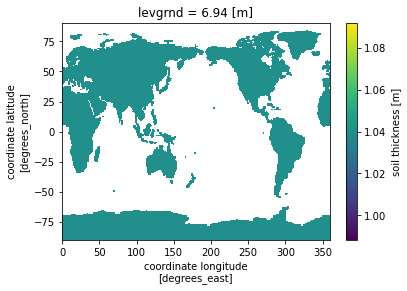

In [63]:
#Plot Diagram - DZSOI variable with co-ordinate [levgrnd = 6.94]

ds.DZSOI.sel(levgrnd="6.94").plot()

In [64]:
#Labelled Selection of DZSOI variable with co-ordinates [lat,lon] in floating point numbers using nearest neighbour method

ds.DZSOI.sel(lat=39.5, lon=105.7, method='nearest')

<xarray.DataArray 'DZSOI' (levgrnd: 25)>
array([ 0.02    ,  0.04    ,  0.06    ,  0.08    ,  0.12    ,  0.16    ,
        0.2     ,  0.24    ,  0.28    ,  0.32    ,  0.36    ,  0.4     ,
        0.44    ,  0.54    ,  0.64    ,  0.74    ,  0.84    ,  0.94    ,
        1.04    ,  1.14    ,  2.39    ,  4.675534,  7.63519 , 11.14    ,
       15.115425], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
    lon      float32 106.2
    lat      float32 39.11
Attributes:
    long_name:  soil thickness
    units:      m

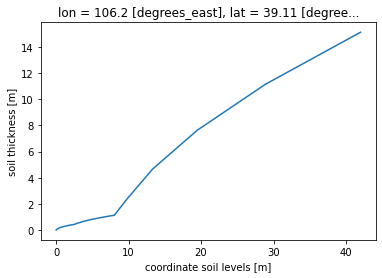

In [65]:
#Plot Diagram - DZSOI variable with co-ordinates [lat,lon] in floating point numbers using nearest neighbour method

ds.DZSOI.sel(lat=39.5, lon=105.7, method='nearest').plot()

In [66]:
#Selection of dataarray using Interpolation function by co-ordinate lable [lat] 

ds.DZSOI.interp(lat=[10, 10.1, 10.2], method='nearest')

<xarray.DataArray 'DZSOI' (levgrnd: 25, lat: 3, lon: 288)>
array([[[ 0.02     ,  0.02     ,  0.02     , ...,  0.02     ,
          0.02     ,  0.02     ],
        [ 0.02     ,  0.02     ,  0.02     , ...,  0.02     ,
          0.02     ,  0.02     ],
        [ 0.02     ,  0.02     ,  0.02     , ...,  0.02     ,
          0.02     ,  0.02     ]],

       [[ 0.04     ,  0.04     ,  0.04     , ...,  0.04     ,
          0.04     ,  0.04     ],
        [ 0.04     ,  0.04     ,  0.04     , ...,  0.04     ,
          0.04     ,  0.04     ],
        [ 0.04     ,  0.04     ,  0.04     , ...,  0.04     ,
          0.04     ,  0.04     ]],

       [[ 0.06     ,  0.06     ,  0.06     , ...,  0.06     ,
          0.06     ,  0.06     ],
        [ 0.06     ,  0.06     ,  0.06     , ...,  0.06     ,
          0.06     ,  0.06     ],
        [ 0.06     ,  0.06     ,  0.06     , ...,  0.06     ,
          0.06     ,  0.06     ]],
...
       [[ 7.6351905,  7.6351905,  7.6351905, ...,  7.6351905,
          7.6351905,  7.6351905],
        [ 7.6351905,  7.6351905,  7.6351905, ...,  7.6351905,
          7.6351905,  7.6351905],
        [ 7.6351905,  7.6351905,  7.6351905, ...,  7.6351905,
          7.6351905,  7.6351905]],

       [[11.14     , 11.14     , 11.14     , ..., 11.14     ,
         11.14     , 11.14     ],
        [11.14     , 11.14     , 11.14     , ..., 11.14     ,
         11.14     , 11.14     ],
        [11.14     , 11.14     , 11.14     , ..., 11.14     ,
         11.14     , 11.14     ]],

       [[15.115425 , 15.115425 , 15.115425 , ..., 15.115425 ,
         15.115425 , 15.115425 ],
        [15.115425 , 15.115425 , 15.115425 , ..., 15.115425 ,
         15.115425 , 15.115425 ],
        [15.115425 , 15.115425 , 15.115425 , ..., 15.115425 ,
         15.115425 , 15.115425 ]]], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float64 10.0 10.1 10.2
Attributes:
    long_name:  soil thickness
    units:      m

(array([5040.,  252.,    0.,  252.,    0.,  252.,    0.,  252.,    0.,
         252.]),
 array([ 0.02     ,  1.5295426,  3.039085 ,  4.5486274,  6.05817  ,
         7.567713 ,  9.077255 , 10.586798 , 12.09634  , 13.605883 ,
        15.115425 ], dtype=float32),
 <BarContainer object of 10 artists>)

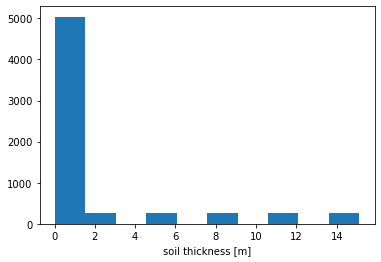

In [67]:
#Selection of dataarray using Interpolation function by co-ordinate lable [lat] 

ds.DZSOI.interp(lat=[10, 10.1, 10.2], method='nearest').plot()

In [68]:
#Displaying the values of the co-ordinate [lat]

ds.lat

<xarray.DataArray 'lat' (lat: 192)>
array([-90.      , -89.057594, -88.11518 , -87.172775, -86.23037 , -85.28796 ,
       -84.34555 , -83.403145, -82.46073 , -81.518326, -80.57591 , -79.63351 ,
       -78.6911  , -77.74869 , -76.80628 , -75.86388 , -74.92146 , -73.97906 ,
       -73.03665 , -72.09424 , -71.15183 , -70.20943 , -69.26701 , -68.32461 ,
       -67.3822  , -66.43979 , -65.49738 , -64.55498 , -63.612564, -62.67016 ,
       -61.72775 , -60.78534 , -59.842934, -58.900524, -57.958115, -57.015705,
       -56.0733  , -55.13089 , -54.18848 , -53.246075, -52.303665, -51.361256,
       -50.41885 , -49.47644 , -48.53403 , -47.59162 , -46.649216, -45.706806,
       -44.764397, -43.82199 , -42.87958 , -41.937172, -40.994766, -40.052357,
       -39.109947, -38.167538, -37.225132, -36.282722, -35.340313, -34.397907,
       -33.455498, -32.51309 , -31.57068 , -30.628273, -29.685863, -28.743456,
       -27.801046, -26.858639, -25.916231, -24.973822, -24.031414, -23.089005,
       -22.146597, -21.20419 , -20.26178 , -19.319372, -18.376963, -17.434555,
       -16.492147, -15.549738, -14.607329, -13.664922, -12.722513, -11.780105,
       -10.837696,  -9.895288,  -8.95288 ,  -8.010471,  -7.068063,  -6.125654,
        -5.183246,  -4.240838,  -3.298429,  -2.356021,  -1.413613,  -0.471204,
         0.471204,   1.413613,   2.356021,   3.298429,   4.240838,   5.183246,
         6.125654,   7.068063,   8.010471,   8.95288 ,   9.895288,  10.837696,
        11.780105,  12.722513,  13.664922,  14.607329,  15.549738,  16.492147,
        17.434555,  18.376963,  19.319372,  20.26178 ,  21.20419 ,  22.146597,
        23.089005,  24.031414,  24.973822,  25.916231,  26.858639,  27.801046,
        28.743456,  29.685863,  30.628273,  31.57068 ,  32.51309 ,  33.455498,
        34.397907,  35.340313,  36.282722,  37.225132,  38.167538,  39.109947,
        40.052357,  40.994766,  41.937172,  42.87958 ,  43.82199 ,  44.764397,
        45.706806,  46.649216,  47.59162 ,  48.53403 ,  49.47644 ,  50.41885 ,
        51.361256,  52.303665,  53.246075,  54.18848 ,  55.13089 ,  56.0733  ,
        57.015705,  57.958115,  58.900524,  59.842934,  60.78534 ,  61.72775 ,
        62.67016 ,  63.612564,  64.55498 ,  65.49738 ,  66.43979 ,  67.3822  ,
        68.32461 ,  69.26701 ,  70.20943 ,  71.15183 ,  72.09424 ,  73.03665 ,
        73.97906 ,  74.92146 ,  75.86388 ,  76.80628 ,  77.74869 ,  78.6911  ,
        79.63351 ,  80.57591 ,  81.518326,  82.46073 ,  83.403145,  84.34555 ,
        85.28796 ,  86.23037 ,  87.172775,  88.11518 ,  89.057594,  90.      ],
      dtype=float32)
Coordinates:
  * lat      (lat) float32 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
Attributes:
    long_name:  coordinate latitude
    units:      degrees_north

In [69]:
#Displaying the values of the co-ordinate [lon]

ds.lon

<xarray.DataArray 'lon' (lon: 288)>
array([  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75], dtype=float32)
Coordinates:
  * lon      (lon) float32 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Attributes:
    long_name:  coordinate longitude
    units:      degrees_east

In [75]:
#Creating Dataframe for variable [area] - 2d
 
df_1 = pd.DataFrame(ds.area)
df_1

,0,1,2,3,4,5,6,7,8,9,...,278,279,280,281,282,283,284,285,286,287
0,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,...,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992,29.945992
1,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,...,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801,239.555801
2,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,...,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814,479.046814
3,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,...,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386,718.408386
4,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,...,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684,957.575684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
188,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
#Creating Dataframe for variable [DZSOI] - 3d

#df_2 = pd.DataFrame(ds.DZSOI)
#df_2

In [77]:
#Creating Dataframe for variable [ZSOI] - 3d

#df_3 = pd.DataFrame(ds.ZSOI)
#df_3

In [78]:
# DZSOI - Soil Thickness

ds.DZSOI.hvplot(groupby = "levgrnd", clim=(ds.DZSOI.min(), ds.DZSOI.max()), cmap = 'turbo', invert = "False")

:DynamicMap   [levgrnd]
   :Image   [lat,lon]   (DZSOI)

In [79]:
# DZSOI (Soil Thickness)

ds.DZSOI.hvplot(
    groupby  = "levgrnd",
    clim = (ds.DZSOI.min(), ds.DZSOI.max()),
    cmap = "turbo",
    invert = "False",
    widget_type="scrubber",
    widget_location="bottom",
)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=24, width=550)
        [2] HSpacer()

In [80]:
# ZSOI (Soil Depth)

ds.ZSOI.hvplot(
    groupby  = "levgrnd",
    clim = (ds.ZSOI.min(), ds.ZSOI.max()),
    cmap = "turbo",
    invert = "False",
    widget_type="scrubber",
    widget_location="bottom",
)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=24, width=550)
        [2] HSpacer()

In [81]:
#Computing mean value of H2OSOI variable

ds.H2OSOI.mean()

<xarray.DataArray 'H2OSOI' ()>
array(0.2671799, dtype=float32)

In [82]:
#Computing temporal minimum of H2OSOI variable

ds.H2OSOI.min(dim=['lat','lon'])

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20)>
array([[1.3560022e-03, 5.4785702e-04, 5.2083865e-02, 5.7666764e-02,
        6.1746467e-02, 6.5741844e-02, 1.0452563e-04, 8.7104687e-05,
        7.4661162e-05, 6.5328517e-05, 5.8069792e-05, 5.2262814e-05,
        4.7511650e-05, 3.8713195e-05, 3.2664258e-05, 2.8250170e-05,
        2.4887055e-05, 2.2239496e-05, 2.0101083e-05, 1.8337829e-05],
       [1.3560022e-03, 5.4785702e-04, 5.2083477e-02, 5.7666622e-02,
        6.1746225e-02, 6.5741658e-02, 1.0452563e-04, 8.7104687e-05,
        7.4661162e-05, 6.5328517e-05, 5.8069792e-05, 5.2262814e-05,
        4.7511650e-05, 3.8713195e-05, 3.2664258e-05, 2.8250170e-05,
        2.4887055e-05, 2.2239496e-05, 2.0101083e-05, 1.8337829e-05],
       [1.3560022e-03, 5.4785702e-04, 5.2082721e-02, 5.7666343e-02,
        6.1745752e-02, 6.5741301e-02, 1.0452563e-04, 8.7104687e-05,
        7.4661162e-05, 6.5328517e-05, 5.8069792e-05, 5.2262814e-05,
        4.7511650e-05, 3.8713195e-05, 3.2664258e-05, 2.8250170e-05,
        2.4887055e-05, 2.2239496e-05, 2.0101083e-05, 1.8337829e-05],
       [1.3560022e-03, 5.4785702e-04, 5.2081969e-02, 5.7666063e-02,
        6.1745279e-02, 6.5740950e-02, 1.0452563e-04, 8.7104687e-05,
        7.4661162e-05, 6.5328517e-05, 5.8069792e-05, 5.2262814e-05,
        4.7511650e-05, 3.8713195e-05, 3.2664258e-05, 2.8250170e-05,
        2.4887055e-05, 2.2239496e-05, 2.0101083e-05, 1.8337829e-05],
...
        6.1726108e-02, 6.5729238e-02, 1.0452563e-04, 8.7104687e-05,
        7.4661162e-05, 6.5328517e-05, 5.8069792e-05, 5.2262814e-05,
        4.7511650e-05, 3.8713195e-05, 3.2664258e-05, 2.8250170e-05,
        2.4887055e-05, 2.2239496e-05, 2.0101083e-05, 1.8337829e-05],
       [1.3560022e-03, 5.4785708e-04, 5.2051809e-02, 5.7654656e-02,
        6.1725598e-02, 6.5728970e-02, 1.0452563e-04, 8.7104687e-05,
        7.4661162e-05, 6.5328517e-05, 5.8069792e-05, 5.2262814e-05,
        4.7511650e-05, 3.8713195e-05, 3.2664258e-05, 2.8250170e-05,
        2.4887055e-05, 2.2239496e-05, 2.0101083e-05, 1.8337829e-05],
       [1.3560022e-03, 5.4785708e-04, 5.2050963e-02, 5.7654366e-02,
        6.1725087e-02, 6.5728709e-02, 1.0452563e-04, 8.7104687e-05,
        7.4661162e-05, 6.5328517e-05, 5.8069792e-05, 5.2262814e-05,
        4.7511650e-05, 3.8713195e-05, 3.2664258e-05, 2.8250170e-05,
        2.4887055e-05, 2.2239496e-05, 2.0101083e-05, 1.8337829e-05],
       [1.3560022e-03, 5.4785708e-04, 5.2050114e-02, 5.7654072e-02,
        6.1724581e-02, 6.5728441e-02, 1.0452563e-04, 8.7104687e-05,
        7.4661162e-05, 6.5328517e-05, 5.8069792e-05, 5.2262814e-05,
        4.7511650e-05, 3.8713195e-05, 3.2664258e-05, 2.8250170e-05,
        2.4887055e-05, 2.2239496e-05, 2.0101083e-05, 1.8337829e-05]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
Dimensions without coordinates: levsoi

In [83]:
# Computing Spatial Sum of H2OSOI variable

ds.H2OSOI.sum(dim=['lat', 'lon'])

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20)>
array([[6550.4976, 6403.364 , 6036.166 , 5608.9106, 5251.987 , 5159.994 ,
        4911.885 , 4641.466 , 4383.307 , 3723.17  , 3416.5317, 3197.2063,
        3083.7961, 2959.166 , 2839.2566, 2752.08  , 2697.881 , 2650.833 ,
        2654.791 , 2707.6367],
       [6526.9214, 6392.4663, 6028.093 , 5602.461 , 5247.6895, 5157.0435,
        4909.6343, 4640.0864, 4382.061 , 3722.3145, 3415.7742, 3196.7407,
        3083.395 , 2958.8164, 2839.0088, 2752.0066, 2697.8455, 2650.8157,
        2654.7708, 2707.626 ],
       [6534.8535, 6400.066 , 6034.5107, 5606.9414, 5249.1675, 5156.207 ,
        4907.218 , 4637.5513, 4379.045 , 3719.906 , 3413.8271, 3195.4492,
        3082.3743, 2958.046 , 2838.408 , 2751.6396, 2697.7485, 2650.7844,
        2654.7153, 2707.6072],
       [6544.414 , 6409.968 , 6044.3867, 5616.379 , 5257.2837, 5162.4263,
        4910.4976, 4638.753 , 4378.076 , 3717.9382, 3411.9377, 3193.822 ,
        3081.1343, 2957.1865, 2837.6704, 2751.154 , 2697.493 , 2650.7449,
        2654.6382, 2707.6023],
       [6553.7417, 6415.992 , 6052.837 , 5624.8306, 5265.04  , 5169.7593,
        4916.3633, 4642.5405, 4379.4507, 3717.7332, 3411.0303, 3192.579 ,
        3079.977 , 2956.2246, 2836.8804, 2750.634 , 2697.1882, 2650.6047,
        2654.5654, 2707.6013],
...
       [6542.0186, 6365.7114, 6029.2397, 5624.723 , 5287.581 , 5202.197 ,
        4949.14  , 4672.251 , 4396.707 , 3723.23  , 3409.672 , 3182.5942,
        3066.7844, 2942.8687, 2822.905 , 2735.837 , 2684.064 , 2641.2727,
        2650.0637, 2706.6165],
       [6550.6455, 6375.1675, 6035.554 , 5628.259 , 5289.659 , 5202.622 ,
        4948.9253, 4671.2783, 4396.03  , 3722.8347, 3409.383 , 3182.1995,
        3066.207 , 2942.166 , 2822.3303, 2735.3384, 2683.6235, 2640.9563,
        2649.8345, 2706.5864],
       [6537.891 , 6372.308 , 6036.6855, 5630.256 , 5291.1323, 5203.1426,
        4949.9316, 4671.685 , 4396.3086, 3722.7712, 3409.2058, 3181.8123,
        3065.6694, 2941.5435, 2821.6682, 2734.7947, 2683.189 , 2640.658 ,
        2649.5823, 2706.5542],
       [6530.9316, 6374.187 , 6038.9473, 5633.5205, 5292.8726, 5202.996 ,
        4949.799 , 4671.469 , 4396.647 , 3722.8726, 3409.0427, 3181.6047,
        3065.257 , 2941.0022, 2821.067 , 2734.1953, 2682.7454, 2640.334 ,
        2649.3223, 2706.5212],
       [6516.5825, 6367.8345, 6035.4463, 5633.0356, 5293.57  , 5203.161 ,
        4949.612 , 4671.113 , 4396.7163, 3722.839 , 3408.8184, 3181.2363,
        3065.0215, 2940.5454, 2820.5293, 2733.5686, 2682.304 , 2639.9646,
        2649.074 , 2706.487 ]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
Dimensions without coordinates: levsoi

In [84]:
# Compute Temporal Median of H2OSOI variable

ds.H2OSOI.median(dim=['lat','lon'])

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20)>
array([[0.36552855, 0.37495506, 0.36217874, 0.3527848 , 0.34479538,
        0.3415094 , 0.32800066, 0.31416643, 0.30733895, 0.2689096 ,
        0.25364324, 0.23776905, 0.22877073, 0.21358731, 0.18828738,
        0.16115364, 0.15723507, 0.15654811, 0.15606019, 0.14604975],
       [0.36234862, 0.37270015, 0.36121768, 0.35241902, 0.3445801 ,
        0.34124294, 0.32778054, 0.31413215, 0.30724138, 0.26899946,
        0.2537266 , 0.23771554, 0.22877073, 0.21373054, 0.18828788,
        0.16115364, 0.15723507, 0.15654811, 0.15606019, 0.14604977],
       [0.36430806, 0.37393183, 0.36206397, 0.3525764 , 0.34469002,
        0.3410312 , 0.32764465, 0.31384397, 0.30707452, 0.26898023,
        0.25358915, 0.23766476, 0.22876966, 0.21345636, 0.18828866,
        0.16115364, 0.15723507, 0.15654811, 0.15606019, 0.14604978],
       [0.3658063 , 0.37690586, 0.36333635, 0.3544374 , 0.34565526,
        0.34144574, 0.32783717, 0.3137226 , 0.30694395, 0.26870635,
        0.25361195, 0.23753247, 0.2286593 , 0.21341848, 0.18831798,
        0.16115364, 0.1572299 , 0.15654811, 0.15606019, 0.1460498 ],
       [0.3665954 , 0.3780242 , 0.3647359 , 0.35538778, 0.3464505 ,
        0.3421288 , 0.32838774, 0.31383836, 0.30681214, 0.2686295 ,
        0.2536208 , 0.23745915, 0.22853318, 0.21330963, 0.1883181 ,
        0.16115364, 0.15723507, 0.15654811, 0.15606019, 0.1460498 ],
...
        0.34416986, 0.33192366, 0.31602037, 0.30689   , 0.2700671 ,
        0.25458813, 0.23848628, 0.22710595, 0.21420032, 0.18794698,
        0.16117357, 0.1572299 , 0.15654479, 0.15606299, 0.1460504 ],
       [0.36425313, 0.37136787, 0.3623826 , 0.35439017, 0.346788  ,
        0.3441915 , 0.33189237, 0.31583962, 0.30686823, 0.27008665,
        0.25466543, 0.23851362, 0.22696804, 0.21431693, 0.18794632,
        0.16117357, 0.1572299 , 0.15654479, 0.15606299, 0.14605041],
       [0.3625217 , 0.3721919 , 0.36263895, 0.35410756, 0.3468919 ,
        0.3440357 , 0.33202422, 0.3158304 , 0.30678672, 0.27004778,
        0.2546778 , 0.23851843, 0.22697806, 0.21424666, 0.18794514,
        0.16120884, 0.15723507, 0.15654479, 0.15606299, 0.14605042],
       [0.36229852, 0.37244862, 0.36239618, 0.35377702, 0.3467052 ,
        0.34389627, 0.33220193, 0.3157903 , 0.30675572, 0.26991326,
        0.2546233 , 0.23851362, 0.22694722, 0.21421888, 0.18788427,
        0.16120884, 0.15723507, 0.15654479, 0.15606299, 0.14605044],
       [0.3612023 , 0.37109953, 0.36228937, 0.35326773, 0.3467616 ,
        0.3437945 , 0.33198518, 0.31590444, 0.3068326 , 0.26999164,
        0.25468943, 0.23840182, 0.22716486, 0.21421684, 0.18785265,
        0.16120884, 0.15723507, 0.15654492, 0.15606584, 0.14605045]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
Dimensions without coordinates: levsoi

In [85]:
#Computing the year of the dataset

ds.time.dt.year

<xarray.DataArray 'year' (time: 46)>
array([2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016,
       2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016,
       2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016,
       2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016,
       2016, 2016])
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00

In [86]:
#Computing the months of the dataset

ds.time.dt.month

<xarray.DataArray 'month' (time: 46)>
array([1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3])
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00

In [87]:
#Computing the months of H2OSOI variable

ds.H2OSOI.groupby(ds.time.dt.month)

DataArrayGroupBy, grouped over 'month'
3 groups with labels 1, 2, 3.

In [88]:
#Computing the year of H2OSOI variable

ds.H2OSOI.groupby(ds.time.dt.year)

DataArrayGroupBy, grouped over 'year'
1 groups with labels 2016.

In [89]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

#H2OSOI variable (location 1)

loc_1_H2OSOI=ds.H2OSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_H2OSOI

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20)>
array([[0.274686, 0.27112 , 0.283711, ..., 0.340851, 0.35469 , 0.376203],
       [0.275126, 0.270003, 0.282316, ..., 0.340842, 0.354679, 0.376187],
       [0.271013, 0.266866, 0.279944, ..., 0.340825, 0.354659, 0.376158],
       ...,
       [0.27288 , 0.269415, 0.282704, ..., 0.340119, 0.353803, 0.374869],
       [0.266392, 0.265147, 0.28007 , ..., 0.340101, 0.353782, 0.374836],
       [0.260708, 0.261203, 0.277249, ..., 0.340084, 0.353761, 0.374804]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 241.2
    lat      float32 34.4
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [90]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

#DZSOI variable (location 1)

loc_1_DZSOI=ds.DZSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_DZSOI

<xarray.DataArray 'DZSOI' (levgrnd: 25)>
array([ 0.02    ,  0.04    ,  0.06    ,  0.08    ,  0.12    ,  0.16    ,
        0.2     ,  0.24    ,  0.28    ,  0.32    ,  0.36    ,  0.4     ,
        0.44    ,  0.54    ,  0.64    ,  0.74    ,  0.84    ,  0.94    ,
        1.04    ,  1.14    ,  2.39    ,  4.675534,  7.63519 , 11.14    ,
       15.115425], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
    lon      float32 241.2
    lat      float32 34.4
Attributes:
    long_name:  soil thickness
    units:      m

In [91]:
#Multiplying H2OSOI and DZSOI variables of Location 1

prod_loc_1 = loc_1_H2OSOI * loc_1_DZSOI
prod_loc_1

<xarray.DataArray (time: 46, levsoi: 20, levgrnd: 25)>
array([[[5.49372425e-03, 1.09874485e-02, 1.64811723e-02, ...,
         2.09728169e+00, 3.06000447e+00, 4.15199900e+00],
        [5.42240683e-03, 1.08448137e-02, 1.62672196e-02, ...,
         2.07005548e+00, 3.02028060e+00, 4.09809923e+00],
        [5.67422388e-03, 1.13484478e-02, 1.70226712e-02, ...,
         2.16618896e+00, 3.16054273e+00, 4.28841543e+00],
        ...,
        [6.81701303e-03, 1.36340261e-02, 2.04510391e-02, ...,
         2.60245967e+00, 3.79707646e+00, 5.15210247e+00],
        [7.09379418e-03, 1.41875884e-02, 2.12813821e-02, ...,
         2.70812345e+00, 3.95124364e+00, 5.36128569e+00],
        [7.52405310e-03, 1.50481062e-02, 2.25721598e-02, ...,
         2.87237906e+00, 4.19089794e+00, 5.68646336e+00]],

       [[5.50252059e-03, 1.10050412e-02, 1.65075622e-02, ...,
         2.10063982e+00, 3.06490421e+00, 4.15864706e+00],
        [5.40005742e-03, 1.08001148e-02, 1.62001718e-02, ...,
         2.06152344e+00, 3.00783205e+00, 4.08120823e+00],
        [5.64632704e-03, 1.12926541e-02, 1.69389807e-02, ...,
         2.15553927e+00, 3.14500427e+00, 4.26733160e+00],
...
        [6.80202944e-03, 1.36040589e-02, 2.04060879e-02, ...,
         2.59673953e+00, 3.78873062e+00, 5.14077854e+00],
        [7.07563944e-03, 1.41512789e-02, 2.12269183e-02, ...,
         2.70119262e+00, 3.94113135e+00, 5.34756470e+00],
        [7.49672623e-03, 1.49934525e-02, 2.24901792e-02, ...,
         2.86194682e+00, 4.17567682e+00, 5.66581059e+00]],

       [[5.21415332e-03, 1.04283066e-02, 1.56424604e-02, ...,
         1.99055278e+00, 2.90428352e+00, 3.94070745e+00],
        [5.22406213e-03, 1.04481243e-02, 1.56721864e-02, ...,
         1.99433553e+00, 2.90980268e+00, 3.94819593e+00],
        [5.54497587e-03, 1.10899517e-02, 1.66349281e-02, ...,
         2.11684752e+00, 3.08855176e+00, 4.19073343e+00],
        ...,
        [6.80168858e-03, 1.36033772e-02, 2.04050653e-02, ...,
         2.59660935e+00, 3.78854060e+00, 5.14052057e+00],
        [7.07521103e-03, 1.41504221e-02, 2.12256331e-02, ...,
         2.70102930e+00, 3.94089293e+00, 5.34724140e+00],
        [7.49607524e-03, 1.49921505e-02, 2.24882271e-02, ...,
         2.86169815e+00, 4.17531443e+00, 5.66531849e+00]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi

In [92]:
#Selecting first five values of prod_loc_1

pp_loc_1 = prod_loc_1.isel(levsoi=slice(0,5),levgrnd=slice(0,5))

In [93]:
#Selecting three specific dates from pp_loc_1

pp = pp_loc_1.sel(time=slice("2016-02-11","2016-02-13"))

In [94]:
#Displaying the DataArray (pp)

pp

<xarray.DataArray (time: 3, levsoi: 5, levgrnd: 5)>
array([[[0.00499665, 0.00999331, 0.01498996, 0.01998661, 0.02997992],
        [0.0050097 , 0.01001939, 0.01502909, 0.02003878, 0.03005818],
        [0.00533666, 0.01067332, 0.01600998, 0.02134664, 0.03201997],
        [0.00569531, 0.01139062, 0.01708593, 0.02278124, 0.03417186],
        [0.00591213, 0.01182427, 0.01773641, 0.02364854, 0.03547281]],

       [[0.0049641 , 0.00992819, 0.01489229, 0.01985638, 0.02978457],
        [0.00498204, 0.00996409, 0.01494613, 0.01992817, 0.02989226],
        [0.00531064, 0.01062129, 0.01593193, 0.02124257, 0.03186386],
        [0.00567168, 0.01134337, 0.01701505, 0.02268674, 0.03403011],
        [0.00589229, 0.01178457, 0.01767685, 0.02356914, 0.03535371]],

       [[0.00492607, 0.00985214, 0.01477821, 0.01970429, 0.02955643],
        [0.00495198, 0.00990396, 0.01485593, 0.01980791, 0.02971187],
        [0.00528539, 0.01057078, 0.01585617, 0.02114156, 0.03171235],
        [0.0056498 , 0.01129961, 0.01694941, 0.02259921, 0.03389882],
        [0.00587386, 0.01174773, 0.01762159, 0.02349545, 0.03524318]]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-02-11 00:00:00 ... 2016-02-13 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 0.26
Dimensions without coordinates: levsoi

(array([15.,  9.,  6., 12.,  9.,  6.,  3.,  0.,  9.,  6.]),
 array([0.00492607, 0.00798075, 0.01103542, 0.01409009, 0.01714477,
        0.02019944, 0.02325412, 0.02630879, 0.02936346, 0.03241814,
        0.03547281], dtype=float32),
 <BarContainer object of 10 artists>)

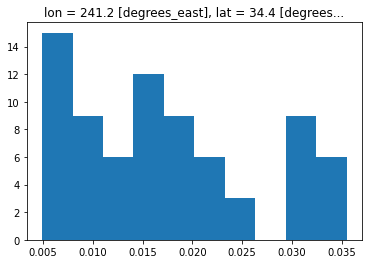

In [95]:
#Plot of DataArray (pp)

pp.plot()

In [96]:
#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

#H2OSOI variable (location 2)

loc_2_H2OSOI=ds.H2OSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_H2OSOI

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20)>
array([[2.217552e-01, 2.265733e-01, 2.369843e-01, ..., 2.947489e-01,
        3.788465e-01, 4.385965e-05],
       [2.213916e-01, 2.263777e-01, 2.368392e-01, ..., 2.947485e-01,
        3.788429e-01, 4.385965e-05],
       [2.210177e-01, 2.260226e-01, 2.365254e-01, ..., 2.947482e-01,
        3.788431e-01, 4.385965e-05],
       ...,
       [3.065532e-01, 3.094404e-01, 3.143170e-01, ..., 2.945409e-01,
        3.788433e-01, 4.385965e-05],
       [3.118811e-01, 3.132138e-01, 3.158122e-01, ..., 2.945344e-01,
        3.788419e-01, 4.385965e-05],
       [3.077441e-01, 3.102464e-01, 3.144367e-01, ..., 2.945285e-01,
        3.788427e-01, 4.385965e-05]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 243.8
    lat      float32 40.99
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [97]:
#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

#DZOSOI variable (location 2)

loc_2_DZSOI=ds.DZSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_DZSOI

<xarray.DataArray 'DZSOI' (levgrnd: 25)>
array([ 0.02    ,  0.04    ,  0.06    ,  0.08    ,  0.12    ,  0.16    ,
        0.2     ,  0.24    ,  0.28    ,  0.32    ,  0.36    ,  0.4     ,
        0.44    ,  0.54    ,  0.64    ,  0.74    ,  0.84    ,  0.94    ,
        1.04    ,  1.14    ,  2.39    ,  4.675534,  7.63519 , 11.14    ,
       15.115425], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
    lon      float32 243.8
    lat      float32 40.99
Attributes:
    long_name:  soil thickness
    units:      m

In [98]:
#Multiplying H2OSOI and DZSOI variables of Location 2

prod_loc_2 = loc_2_H2OSOI * loc_2_DZSOI
prod_loc_2

<xarray.DataArray (time: 46, levsoi: 20, levgrnd: 25)>
array([[[4.43510385e-03, 8.87020770e-03, 1.33053120e-02, ...,
         1.69314325e+00, 2.47035313e+00, 3.35192418e+00],
        [4.53146640e-03, 9.06293280e-03, 1.35944001e-02, ...,
         1.72993052e+00, 2.52402711e+00, 3.42475224e+00],
        [4.73968498e-03, 9.47936997e-03, 1.42190550e-02, ...,
         1.80941987e+00, 2.64000463e+00, 3.58211780e+00],
        ...,
        [5.89497853e-03, 1.17899571e-02, 1.76849347e-02, ...,
         2.25046420e+00, 3.28350329e+00, 4.45525551e+00],
        [7.57693034e-03, 1.51538607e-02, 2.27307919e-02, ...,
         2.89256549e+00, 4.22035027e+00, 5.72642612e+00],
        [8.77192974e-07, 1.75438595e-06, 2.63157904e-06, ...,
         3.34876793e-04, 4.88596503e-04, 6.62957260e-04]],

       [[4.42783209e-03, 8.85566417e-03, 1.32834967e-02, ...,
         1.69036722e+00, 2.46630263e+00, 3.34642839e+00],
        [4.52755485e-03, 9.05510969e-03, 1.35826645e-02, ...,
         1.72843719e+00, 2.52184820e+00, 3.42179585e+00],
        [4.73678438e-03, 9.47356876e-03, 1.42103536e-02, ...,
         1.80831265e+00, 2.63838911e+00, 3.57992578e+00],
...
        [5.89068886e-03, 1.17813777e-02, 1.76720656e-02, ...,
         2.24882650e+00, 3.28111386e+00, 4.45201349e+00],
        [7.57683720e-03, 1.51536744e-02, 2.27305125e-02, ...,
         2.89252996e+00, 4.22029877e+00, 5.72635603e+00],
        [8.77192974e-07, 1.75438595e-06, 2.63157904e-06, ...,
         3.34876793e-04, 4.88596503e-04, 6.62957260e-04]],

       [[6.15488179e-03, 1.23097636e-02, 1.84646454e-02, ...,
         2.34968472e+00, 3.42826915e+00, 4.65168285e+00],
        [6.20492734e-03, 1.24098547e-02, 1.86147820e-02, ...,
         2.36879015e+00, 3.45614481e+00, 4.68950605e+00],
        [6.28873333e-03, 1.25774667e-02, 1.88662000e-02, ...,
         2.40078402e+00, 3.50282454e+00, 4.75284386e+00],
        ...,
        [5.89057012e-03, 1.17811402e-02, 1.76717099e-02, ...,
         2.24878120e+00, 3.28104782e+00, 4.45192385e+00],
        [7.57685350e-03, 1.51537070e-02, 2.27305610e-02, ...,
         2.89253592e+00, 4.22030783e+00, 5.72636795e+00],
        [8.77192974e-07, 1.75438595e-06, 2.63157904e-06, ...,
         3.34876793e-04, 4.88596503e-04, 6.62957260e-04]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi

In [99]:
#Selecting first five values of prod_loc_2

qq_loc_2 = prod_loc_2.isel(levsoi=slice(0,5),levgrnd=slice(0,5))

In [100]:
#Selecting three specific dates from qq_loc_2

qq = qq_loc_2.sel(time=slice("2016-02-11","2016-02-13"))

In [101]:
#Displaying the DataArray (qq)

qq

<xarray.DataArray (time: 3, levsoi: 5, levgrnd: 5)>
array([[[0.00450005, 0.00900009, 0.01350014, 0.01800018, 0.02700027],
        [0.00459153, 0.00918307, 0.0137746 , 0.01836614, 0.02754921],
        [0.00479274, 0.00958548, 0.01437821, 0.01917095, 0.02875643],
        [0.00527965, 0.0105593 , 0.01583895, 0.02111859, 0.03167789],
        [0.00551364, 0.01102728, 0.01654091, 0.02205455, 0.03308183]],

       [[0.0044882 , 0.0089764 , 0.0134646 , 0.01795281, 0.02692921],
        [0.00458535, 0.0091707 , 0.01375605, 0.01834141, 0.02751211],
        [0.00478832, 0.00957663, 0.01436495, 0.01915326, 0.02872989],
        [0.00527489, 0.01054977, 0.01582466, 0.02109954, 0.03164931],
        [0.00550762, 0.01101524, 0.01652287, 0.02203049, 0.03304574]],

       [[0.00451823, 0.00903646, 0.01355468, 0.01807291, 0.02710936],
        [0.00459197, 0.00918394, 0.01377591, 0.01836788, 0.02755181],
        [0.00478436, 0.00956873, 0.01435309, 0.01913745, 0.02870618],
        [0.00526856, 0.01053712, 0.01580568, 0.02107424, 0.03161137],
        [0.00550104, 0.01100208, 0.01650311, 0.02200415, 0.03300623]]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-02-11 00:00:00 ... 2016-02-13 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 0.26
Dimensions without coordinates: levsoi

(array([15.,  9.,  6., 12.,  9.,  6.,  3.,  3.,  6.,  6.]),
 array([0.0044882 , 0.00734756, 0.01020693, 0.01306629, 0.01592565,
        0.01878501, 0.02164438, 0.02450374, 0.0273631 , 0.03022247,
        0.03308183], dtype=float32),
 <BarContainer object of 10 artists>)

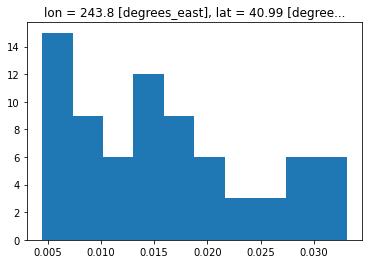

In [102]:
#Plot of DataArray (qq)

qq.plot()

In [103]:
#Boston Location - Latitude & Longitude co-ordinates
# identified Location is Near to Boston

#H2OSOI variable (location 3)

loc_3_H2OSOI=ds.H2OSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_H2OSOI

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20)>
array([[0.263856, 0.266971, 0.272404, ..., 0.321784, 0.346602, 0.409906],
       [0.263462, 0.266726, 0.272227, ..., 0.321801, 0.346604, 0.409888],
       [0.268191, 0.269331, 0.272981, ..., 0.321833, 0.346609, 0.409885],
       ...,
       [0.312395, 0.314051, 0.318267, ..., 0.323304, 0.346947, 0.409764],
       [0.303565, 0.306092, 0.311344, ..., 0.32336 , 0.346958, 0.40976 ],
       [0.298614, 0.301229, 0.306657, ..., 0.323426, 0.34697 , 0.409757]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 242.5
    lat      float32 40.99
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [104]:
#Boston Location - Latitude & Longitude co-ordinates
# identified Location is Near to Boston

#DZSOI variable (location 3)

loc_3_DZSOI=ds.DZSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_DZSOI

<xarray.DataArray 'DZSOI' (levgrnd: 25)>
array([ 0.02    ,  0.04    ,  0.06    ,  0.08    ,  0.12    ,  0.16    ,
        0.2     ,  0.24    ,  0.28    ,  0.32    ,  0.36    ,  0.4     ,
        0.44    ,  0.54    ,  0.64    ,  0.74    ,  0.84    ,  0.94    ,
        1.04    ,  1.14    ,  2.39    ,  4.675534,  7.63519 , 11.14    ,
       15.115425], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
    lon      float32 242.5
    lat      float32 40.99
Attributes:
    long_name:  soil thickness
    units:      m

In [105]:
#Multiplying H2OSOI and DZSOI variables of Location 3

prod_loc_3 = loc_3_H2OSOI * loc_3_DZSOI
prod_loc_3

<xarray.DataArray (time: 46, levsoi: 20, levgrnd: 25)>
array([[[5.27711213e-03, 1.05542243e-02, 1.58313364e-02, ...,
         2.01458788e+00, 2.93935156e+00, 3.98828959e+00],
        [5.33941714e-03, 1.06788343e-02, 1.60182528e-02, ...,
         2.03837347e+00, 2.97405553e+00, 4.03537846e+00],
        [5.44807781e-03, 1.08961556e-02, 1.63442325e-02, ...,
         2.07985568e+00, 3.03457952e+00, 4.11750078e+00],
        ...,
        [6.43568859e-03, 1.28713772e-02, 1.93070658e-02, ...,
         2.45688558e+00, 3.58467865e+00, 4.86390877e+00],
        [6.93203369e-03, 1.38640674e-02, 2.07961015e-02, ...,
         2.64636993e+00, 3.86114311e+00, 5.23903179e+00],
        [8.19812901e-03, 1.63962580e-02, 2.45943870e-02, ...,
         3.12971377e+00, 4.56635809e+00, 6.19590998e+00]],

       [[5.26923826e-03, 1.05384765e-02, 1.58077143e-02, ...,
         2.01158190e+00, 2.93496585e+00, 3.98233891e+00],
        [5.33451326e-03, 1.06690265e-02, 1.60035398e-02, ...,
         2.03650117e+00, 2.97132397e+00, 4.03167152e+00],
        [5.44454018e-03, 1.08890804e-02, 1.63336210e-02, ...,
         2.07850504e+00, 3.03260899e+00, 4.11482716e+00],
...
        [6.46719616e-03, 1.29343923e-02, 1.94015894e-02, ...,
         2.46891379e+00, 3.60222840e+00, 4.88772106e+00],
        [6.93915226e-03, 1.38783045e-02, 2.08174568e-02, ...,
         2.64908767e+00, 3.86510801e+00, 5.24441195e+00],
        [8.19519721e-03, 1.63903944e-02, 2.45855916e-02, ...,
         3.12859464e+00, 4.56472540e+00, 6.19369459e+00]],

       [[5.97227085e-03, 1.19445417e-02, 1.79168116e-02, ...,
         2.27997136e+00, 3.32655501e+00, 4.51367092e+00],
        [6.02458743e-03, 1.20491749e-02, 1.80737637e-02, ...,
         2.29994369e+00, 3.35569549e+00, 4.55321026e+00],
        [6.13314752e-03, 1.22662950e-02, 1.83994416e-02, ...,
         2.34138751e+00, 3.41616321e+00, 4.63525677e+00],
        ...,
        [6.46852655e-03, 1.29370531e-02, 1.94055792e-02, ...,
         2.46942163e+00, 3.60296941e+00, 4.88872671e+00],
        [6.93940045e-03, 1.38788009e-02, 2.08182000e-02, ...,
         2.64918232e+00, 3.86524606e+00, 5.24459934e+00],
        [8.19513015e-03, 1.63902603e-02, 2.45853905e-02, ...,
         3.12856913e+00, 4.56468773e+00, 6.19364405e+00]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi

In [106]:
#Selecting first five values of prod_loc_3

rr_loc_3 = prod_loc_3.isel(levsoi=slice(0,5),levgrnd=slice(0,5))

In [107]:
#Selecting three specific dates from rr_loc_3

rr = rr_loc_3.sel(time=slice("2016-02-11","2016-02-13"))

In [108]:
#Displaying the DataArray (rr)

rr

<xarray.DataArray (time: 3, levsoi: 5, levgrnd: 5)>
array([[[0.00544541, 0.01089081, 0.01633622, 0.02178163, 0.03267244],
        [0.00546923, 0.01093846, 0.01640769, 0.02187693, 0.03281539],
        [0.00558186, 0.01116372, 0.01674558, 0.02232744, 0.03349116],
        [0.00600791, 0.01201583, 0.01802374, 0.02403165, 0.03604748],
        [0.00610731, 0.01221461, 0.01832192, 0.02442923, 0.03664384]],

       [[0.00539776, 0.01079552, 0.01619327, 0.02159103, 0.03238655],
        [0.00546102, 0.01092204, 0.01638306, 0.02184408, 0.03276612],
        [0.00557029, 0.01114059, 0.01671088, 0.02228118, 0.03342177],
        [0.00599381, 0.01198761, 0.01798142, 0.02397523, 0.03596284],
        [0.00609171, 0.01218341, 0.01827512, 0.02436683, 0.03655024]],

       [[0.00558889, 0.01117778, 0.01676667, 0.02235555, 0.03353333],
        [0.00557542, 0.01115084, 0.01672626, 0.02230168, 0.03345252],
        [0.00561726, 0.01123452, 0.01685179, 0.02246905, 0.03370357],
        [0.00600998, 0.01201996, 0.01802995, 0.02403993, 0.03605989],
        [0.00608978, 0.01217955, 0.01826933, 0.02435911, 0.03653866]]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-02-11 00:00:00 ... 2016-02-13 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 0.26
Dimensions without coordinates: levsoi

(array([15.,  9.,  6.,  9.,  6., 12.,  3.,  0.,  7.,  8.]),
 array([0.00539776, 0.00852237, 0.01164697, 0.01477158, 0.01789619,
        0.0210208 , 0.02414541, 0.02727001, 0.03039462, 0.03351923,
        0.03664384], dtype=float32),
 <BarContainer object of 10 artists>)

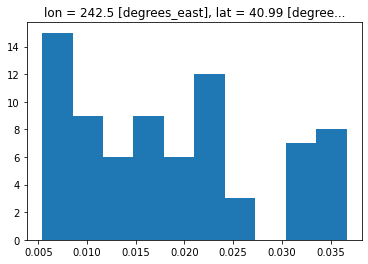

In [109]:
#Plot of DataArray (rr)

rr.plot()

In [110]:
#Villupuram - Latitude & Longitude co-ordinates
# identified Location is around VPM

#H2OSOI variable (location 4)

loc_4_H2OSOI=ds.H2OSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_H2OSOI

<xarray.DataArray 'H2OSOI' (time: 46, levsoi: 20)>
array([[0.356584, 0.362568, 0.369011, ..., 0.43986 , 0.43986 , 0.43986 ],
       [0.347893, 0.354804, 0.362509, ..., 0.43986 , 0.43986 , 0.43986 ],
       [0.342271, 0.349407, 0.357431, ..., 0.43986 , 0.43986 , 0.43986 ],
       ...,
       [0.289337, 0.300703, 0.310342, ..., 0.43986 , 0.43986 , 0.43986 ],
       [0.287551, 0.299426, 0.309213, ..., 0.43986 , 0.43986 , 0.43986 ],
       [0.286593, 0.298792, 0.308539, ..., 0.43986 , 0.43986 , 0.43986 ]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 80.0
    lat      float32 11.78
Dimensions without coordinates: levsoi
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [111]:
#Villupuram - Latitude & Longitude co-ordinates
# identified Location is around VPM

#DZSOI variable (location 4)

loc_4_DZSOI=ds.DZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_DZSOI

<xarray.DataArray 'DZSOI' (levgrnd: 25)>
array([ 0.02    ,  0.04    ,  0.06    ,  0.08    ,  0.12    ,  0.16    ,
        0.2     ,  0.24    ,  0.28    ,  0.32    ,  0.36    ,  0.4     ,
        0.44    ,  0.54    ,  0.64    ,  0.74    ,  0.84    ,  0.94    ,
        1.04    ,  1.14    ,  2.39    ,  4.675534,  7.63519 , 11.14    ,
       15.115425], dtype=float32)
Coordinates:
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
    lon      float32 80.0
    lat      float32 11.78
Attributes:
    long_name:  soil thickness
    units:      m

In [112]:
#Multiplying H2OSOI and DZSOI variables of Location 4

prod_loc_4 = loc_4_H2OSOI * loc_4_DZSOI
prod_loc_4

<xarray.DataArray (time: 46, levsoi: 20, levgrnd: 25)>
array([[[7.1316711e-03, 1.4263342e-02, 2.1395013e-02, ...,
         2.7225835e+00, 3.9723411e+00, 5.3899121e+00],
        [7.2513684e-03, 1.4502737e-02, 2.1754107e-02, ...,
         2.7682791e+00, 4.0390124e+00, 5.4803762e+00],
        [7.3802220e-03, 1.4760444e-02, 2.2140665e-02, ...,
         2.8174701e+00, 4.1107841e+00, 5.5777597e+00],
        ...,
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00],
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00],
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00]],

       [[6.9578532e-03, 1.3915706e-02, 2.0873560e-02, ...,
         2.6562269e+00, 3.8755245e+00, 5.2585454e+00],
        [7.0960810e-03, 1.4192162e-02, 2.1288244e-02, ...,
         2.7089965e+00, 3.9525175e+00, 5.3630142e+00],
        [7.2501795e-03, 1.4500359e-02, 2.1750538e-02, ...,
         2.7678251e+00, 4.0383501e+00, 5.4794774e+00],
...
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00],
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00],
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00]],

       [[5.7318686e-03, 1.1463737e-02, 1.7195607e-02, ...,
         2.1881955e+00, 3.1926510e+00, 4.3319817e+00],
        [5.9758406e-03, 1.1951681e-02, 1.7927522e-02, ...,
         2.2813342e+00, 3.3285434e+00, 4.5163684e+00],
        [6.1707799e-03, 1.2341560e-02, 1.8512340e-02, ...,
         2.3557541e+00, 3.4371245e+00, 4.6636982e+00],
        ...,
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00],
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00],
        [8.7971995e-03, 1.7594399e-02, 2.6391599e-02, ...,
         3.3584149e+00, 4.9000406e+00, 6.6486707e+00]]], dtype=float32)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi

In [113]:
#Selecting first five values of prod_loc_4

ss_loc_1 = prod_loc_4.isel(levsoi=slice(0,5),levgrnd=slice(0,5))

In [114]:
#Selecting three specific dates from ss_loc_4

ss = ss_loc_1.sel(time=slice("2016-02-11","2016-02-13"))

In [115]:
#Displaying the DataArray (ss)

ss

<xarray.DataArray (time: 3, levsoi: 5, levgrnd: 5)>
array([[[0.00632663, 0.01265326, 0.01897989, 0.02530652, 0.03795979],
        [0.00648563, 0.01297125, 0.01945688, 0.0259425 , 0.03891376],
        [0.00666395, 0.0133279 , 0.01999185, 0.0266558 , 0.03998369],
        [0.00692196, 0.01384392, 0.02076589, 0.02768785, 0.04153177],
        [0.00724026, 0.01448053, 0.02172079, 0.02896106, 0.04344159]],

       [[0.00628852, 0.01257704, 0.01886557, 0.02515409, 0.03773113],
        [0.00644524, 0.01289047, 0.01933571, 0.02578095, 0.03867142],
        [0.00662461, 0.01324922, 0.01987384, 0.02649845, 0.03974767],
        [0.00688682, 0.01377364, 0.02066047, 0.02754729, 0.04132093],
        [0.00721087, 0.01442174, 0.0216326 , 0.02884347, 0.04326521]],

       [[0.00629635, 0.0125927 , 0.01888904, 0.02518539, 0.03777809],
        [0.00644531, 0.01289062, 0.01933593, 0.02578123, 0.03867185],
        [0.00661654, 0.01323307, 0.01984961, 0.02646615, 0.03969922],
        [0.0068736 , 0.01374719, 0.02062079, 0.02749438, 0.04124157],
        [0.00719539, 0.01439079, 0.02158619, 0.02878158, 0.04317237]]],
      dtype=float32)
Coordinates:
  * time     (time) object 2016-02-11 00:00:00 ... 2016-02-13 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 0.26
Dimensions without coordinates: levsoi

(array([15.,  9.,  6., 12.,  3., 12.,  3.,  0.,  7.,  8.]),
 array([0.00628852, 0.01000383, 0.01371914, 0.01743444, 0.02114975,
        0.02486506, 0.02858036, 0.03229567, 0.03601098, 0.03972628,
        0.04344159], dtype=float32),
 <BarContainer object of 10 artists>)

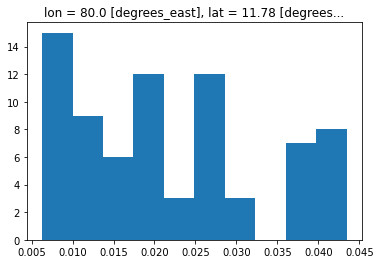

In [116]:
#Plot of DataArray (ss)

ss.plot()

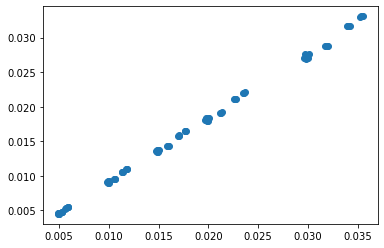

In [117]:
#Plotting the Product values of Location 1 and 2

plt.scatter(pp,qq)

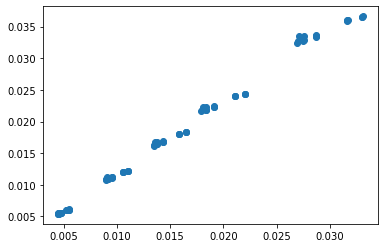

In [118]:
#Plotting the Product values of Location 2 and 3

plt.scatter(qq,rr)

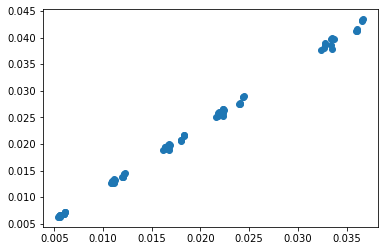

In [119]:
#Plotting the Product values of Location 3 and 4

plt.scatter(rr,ss)

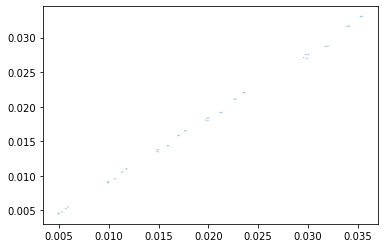

In [120]:
#Plotting the Product values of Location 1,2 and 3

plt.scatter(pp,qq,rr)

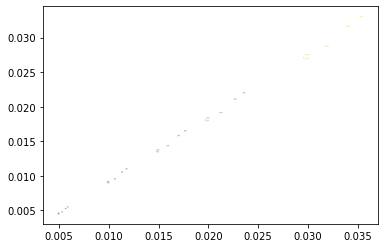

In [121]:
#Plotting the Product values of all the locations

plt.scatter(pp,qq,rr,ss)

In [122]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

#ZSOI variable (location 1)

loc_1_ZSOI = ds.ZSOI.sel(lat=34.0522, lon=241.75, method='nearest')

In [123]:
#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

#ZSOI variable (location 2)

loc_2_ZSOI = ds.ZSOI.sel(lat=41.02, lon=244.05, method='nearest')

In [124]:
#Boston Location - Latitude & Longitude co-ordinates
# identified Location is near to Boston

#ZSOI variable (location 3)

loc_3_ZSOI = ds.ZSOI.sel(lat=41.08, lon=243.05, method='nearest')

In [125]:
#Villupuram Location - Latitude & Longitude co-ordinates
# identified Location is around VPM

#ZSOI variable (location 4)

loc_4_ZSOI = ds.ZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')

In [126]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 1)

data_1_f1 = xr.merge((loc_1_H2OSOI,loc_1_DZSOI,loc_1_ZSOI), compat='override')

In [127]:
#Displaying the Dataset (Loc 1)

data_1_f1

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 0.2747 0.2711 0.2837 ... 0.3538 0.3748
    DZSOI    (levgrnd) float32 0.02 0.04 0.06 0.08 ... 4.676 7.635 11.14 15.12
    ZSOI     (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [128]:
dataa_1_mul_50_f1 = data_1_f1 * 50

In [129]:
dataa_1_mul_50_f1

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 13.73 13.56 14.19 14.89 ... 17.0 17.69 18.74
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [130]:
#Creating a DataFrame for the variable H2OSOI (Loc 1)

df_loc_1_H2OSOI_f1 = pd.DataFrame(dataa_1_mul_50_f1.H2OSOI)
df_loc_1_H2OSOI_f1

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,13.734311,13.556017,14.185560,14.894978,15.237720,15.179547,14.867954,14.475645,14.397110,13.054164,13.356487,13.664060,15.229943,15.488462,15.784847,16.126646,16.533081,17.042532,17.734486,18.810133
1,13.756302,13.500144,14.115818,14.846977,15.216094,15.175295,14.876964,14.491786,14.411471,13.057929,13.357222,13.663845,15.229471,15.487949,15.784354,16.126188,16.532652,17.042095,17.733967,18.809372
2,13.550636,13.343307,13.997181,14.761040,15.164290,15.159653,14.889961,14.521365,14.439299,13.065575,13.358813,13.663480,15.228565,15.486953,15.783389,16.125296,16.531813,17.041241,17.732950,18.807878
3,13.439393,13.231219,13.895377,14.678234,15.106729,15.135328,14.896032,14.547531,14.466429,13.073592,13.360628,13.663199,15.227694,15.485970,15.782431,16.124405,16.530973,17.040386,17.731936,18.806379
4,13.260354,13.113642,13.808086,14.607605,15.052518,15.106652,14.896112,14.570001,14.492549,13.081934,13.362667,13.663006,15.226857,15.485003,15.781479,16.123516,16.530134,17.039528,17.730921,18.804874
5,13.069621,12.974818,13.704872,14.530184,14.997387,15.075768,14.891595,14.588753,14.517355,13.090544,13.364924,13.662900,15.226062,15.484049,15.780533,16.122629,16.529295,17.038670,17.729904,18.803362
6,12.920751,12.849987,13.604294,14.451075,14.939602,15.042286,14.883373,14.603974,14.540595,13.099352,13.367395,13.662885,15.225307,15.483114,15.779593,16.121746,16.528458,17.037813,17.728886,18.801849
7,14.032321,13.355144,13.701262,14.410981,14.886248,15.007470,14.872217,14.615973,14.562098,13.108293,13.370069,13.662963,15.224598,15.482196,15.778663,16.120865,16.527618,17.036955,17.727869,18.800329
8,14.624333,14.184783,14.500123,14.893299,15.032180,15.008349,14.864084,14.626016,14.581977,13.117342,13.372946,13.663136,15.223937,15.481299,15.777739,16.119987,16.526783,17.036095,17.726847,18.798805
9,13.933513,13.657847,14.228922,14.891810,15.169003,15.072213,14.872117,14.635879,14.600261,13.126410,13.376005,13.663403,15.223323,15.480421,15.776822,16.119112,16.525946,17.035236,17.725826,18.797277


In [131]:
df_loc_1_H2OSOI_f1_5 = df_loc_1_H2OSOI_f1.iloc[:,:5]  
df_loc_1_H2OSOI_f1_5

,0,1,2,3,4
0,13.734311,13.556017,14.185560,14.894978,15.237720
1,13.756302,13.500144,14.115818,14.846977,15.216094
2,13.550636,13.343307,13.997181,14.761040,15.164290
3,13.439393,13.231219,13.895377,14.678234,15.106729
4,13.260354,13.113642,13.808086,14.607605,15.052518
5,13.069621,12.974818,13.704872,14.530184,14.997387
6,12.920751,12.849987,13.604294,14.451075,14.939602
7,14.032321,13.355144,13.701262,14.410981,14.886248
8,14.624333,14.184783,14.500123,14.893299,15.032180
9,13.933513,13.657847,14.228922,14.891810,15.169003


In [132]:
df_loc_1_H2OSOI_f1_5_mean = df_loc_1_H2OSOI_f1_5.mean(axis = 1, skipna = True)
df_loc_1_H2OSOI_f1_5_mean

0     14.321718
1     14.287066
2     14.163290
3     14.070190
4     13.968442
5     13.855377
6     13.753140
7     14.077191
8     14.646944
9     14.376219
10    14.211929
11    14.085829
12    13.970739
13    13.858159
14    13.749347
15    13.645018
16    13.550817
17    13.475229
18    13.410376
19    13.343554
20    13.309637
21    14.446569
22    14.420145
23    14.780985
24    14.558966
25    14.357718
26    14.298114
27    14.383615
28    14.497907
29    14.292935
30    14.186048
31    14.183889
32    14.035487
33    13.954260
34    14.256328
35    14.232022
36    15.900246
37    15.318172
38    15.016928
39    14.774371
40    14.563614
41    14.401454
42    14.354930
43    14.305224
44    14.144892
45    13.986467
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1)\nlat=34.4, lon=241.2')

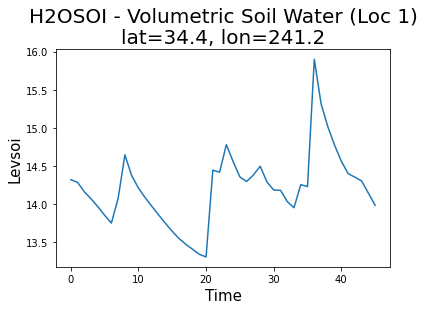

In [133]:
#Plotting the H2OSOI variable DataFrame (Loc 1) using line plot function

df_loc_1_H2OSOI_f1_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1)\nlat=34.4, lon=241.2",size=20)

In [134]:
#Creating a DataFrame for the DZSOI variable (Loc 1)

df_loc_1_DZSOI_f1 = pd.DataFrame(dataa_1_mul_50_f1.DZSOI)
df_loc_1_DZSOI_f1

,0
0,1.000000
1,2.000000
2,3.000000
3,4.000000
4,6.000000
5,8.000000
6,10.000000
7,12.000000
8,14.000000
9,16.000000


<AxesSubplot:>

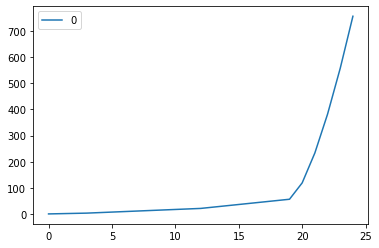

In [135]:
#Plotting the DZSOI variable DataFrame (Loc 1) using plot() function

df_loc_1_DZSOI_f1.plot()

In [136]:
#Creating a DataFrame for the ZSOI variable (Loc 1)

df_loc_1_ZSOI_f1 = pd.DataFrame(dataa_1_mul_50_f1.ZSOI)
df_loc_1_ZSOI_f1

,0
0,0.500000
1,2.000000
2,4.500000
3,8.000000
4,13.000000
5,20.000000
6,29.000000
7,40.000000
8,52.999996
9,68.000000


<AxesSubplot:>

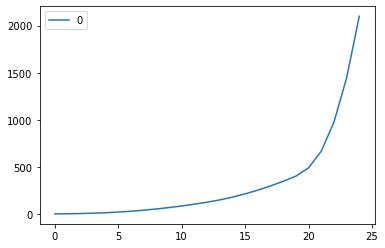

In [137]:
#Plotting the ZSOI variable DataFrame (Loc 1) using plot() function

df_loc_1_ZSOI_f1.plot()

In [138]:
#Concatenating the DataFrames of DZSOI and ZSOI variables into a Single DataFrame (Loc 1)

df_merged_loc_1 = pd.concat([df_loc_1_DZSOI_f1, df_loc_1_ZSOI_f1], axis=1, join="inner")

In [139]:
#Changing the column names of the Single DataFrame (Loc 1)

df_merged_loc_1.columns = ['Levgrnd_DZSOI (Loc 1)', 'Levgrnd_ZSOI (Loc 1)']

In [140]:
#Displaying the Single DataFrame (Loc 1)

df_merged_loc_1

,Levgrnd_DZSOI (Loc 1),Levgrnd_ZSOI (Loc 1)
0,1.000000,0.500000
1,2.000000,2.000000
2,3.000000,4.500000
3,4.000000,8.000000
4,6.000000,13.000000
5,8.000000,20.000000
6,10.000000,29.000000
7,12.000000,40.000000
8,14.000000,52.999996
9,16.000000,68.000000


Text(0.5, 1.0, 'DZSOI vs ZSOI (Loc 1)\nlat=34.4, lon=241.2')

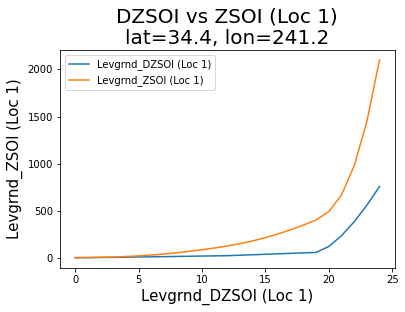

In [141]:
#Plotting the Single DataFrame (Loc 1) using plot function 

df_merged_loc_1.plot()
plt.xlabel("Levgrnd_DZSOI (Loc 1)",size=15)
#plt.xlim(0,25)
plt.ylabel("Levgrnd_ZSOI (Loc 1)",size=15)
#plt.ylim(0,50)
plt.title("DZSOI vs ZSOI (Loc 1)\nlat=34.4, lon=241.2",size=20)

Text(0.5, 1.0, 'DZSOI vs ZSOI (Loc 1)\nlat=34.4, lon=241.2')

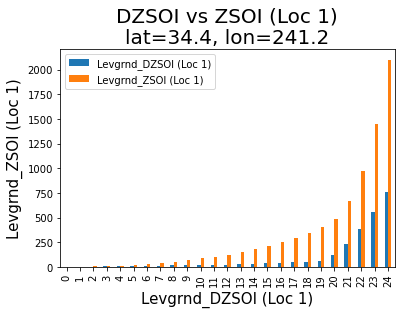

In [142]:
#Plotting the Single DataFrame (Loc 1) using bar plot function 

df_merged_loc_1.plot(kind='bar')
plt.xlabel("Levgrnd_DZSOI (Loc 1)",size=15)
#plt.xlim(0,25)
plt.ylabel("Levgrnd_ZSOI (Loc 1)",size=15)
#plt.ylim(0,50)
plt.title("DZSOI vs ZSOI (Loc 1)\nlat=34.4, lon=241.2",size=20)

Text(0.5, 1.0, 'DZSOI vs ZSOI (Loc 1)\nlat=34.4, lon=241.2')

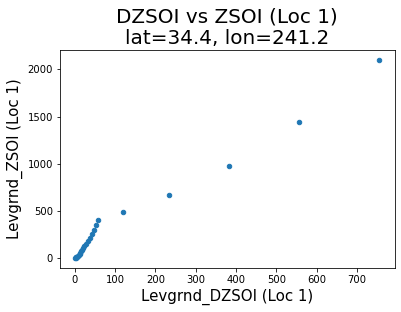

In [143]:
#Plotting the Single DataFrame (Loc 1) using scatter function 

df_merged_loc_1.plot(kind='scatter',x='Levgrnd_DZSOI (Loc 1)',y='Levgrnd_ZSOI (Loc 1)')
plt.xlabel("Levgrnd_DZSOI (Loc 1)",size=15)
#plt.xlim(0,25)
plt.ylabel("Levgrnd_ZSOI (Loc 1)",size=15)
#plt.ylim(0,50)
plt.title("DZSOI vs ZSOI (Loc 1)\nlat=34.4, lon=241.2",size=20)

In [144]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 2)

data_2_f1 = xr.merge((loc_2_H2OSOI,loc_2_DZSOI,loc_2_ZSOI), compat='override')

In [145]:
#Displaying the Dataset (Loc 2)

data_2_f1

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 0.2218 0.2266 0.237 ... 0.3788 4.386e-05
    DZSOI    (levgrnd) float32 0.02 0.04 0.06 0.08 ... 4.676 7.635 11.14 15.12
    ZSOI     (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [146]:
data_2_mul_50_f1 = data_2_f1 * 50

In [147]:
data_2_mul_50_f1

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 11.09 11.33 11.85 ... 14.73 18.94 0.002193
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [148]:
#Creating a DataFrame for the variable H2OSOI (Loc 2)

df_loc_2_H2OSOI_f1 = pd.DataFrame(data_2_mul_50_f1.H2OSOI)
df_loc_2_H2OSOI_f1

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,11.087760,11.328667,11.849213,13.077233,13.672383,13.855113,13.690654,13.603891,13.692716,13.142345,13.221651,13.292275,13.352938,13.412091,13.483685,13.598433,13.871431,14.737447,18.942326,0.002193
1,11.069581,11.318887,11.841962,13.070480,13.665980,13.848439,13.683844,13.597475,13.686798,13.137029,13.216732,13.287830,13.349154,13.409199,13.481866,13.597867,13.871702,14.737423,18.942144,0.002193
2,11.050884,11.301127,11.826271,13.056114,13.652637,13.835500,13.670773,13.585030,13.675213,13.126620,13.207128,13.279163,13.341758,13.403501,13.478213,13.596620,13.872108,14.737411,18.942156,0.002193
3,11.217395,11.366798,11.832746,13.046760,13.639687,13.822553,13.657925,13.572760,13.663679,13.116233,13.197567,13.270558,13.334389,13.397759,13.474442,13.595179,13.872339,14.737426,18.942169,0.002193
4,11.591168,11.692025,12.044285,13.167461,13.684414,13.824765,13.647416,13.560848,13.652237,13.105883,13.188049,13.262004,13.327045,13.391979,13.470559,13.593556,13.872403,14.737442,18.942127,0.002193
5,11.677371,11.779169,12.138537,13.261425,13.760506,13.860923,13.649753,13.551673,13.641244,13.095613,13.178578,13.253493,13.319725,13.386168,13.466575,13.591761,13.872306,14.737448,18.942142,0.002193
6,12.039598,12.061759,12.325509,13.390574,13.845587,13.909700,13.665310,13.548223,13.631752,13.085611,13.169177,13.245027,13.312425,13.380328,13.462498,13.589804,13.872057,14.737434,18.942139,0.002193
7,11.831758,12.026742,12.414167,13.517377,13.965660,13.987233,13.696490,13.552099,13.624909,13.076239,13.159921,13.236610,13.305141,13.374463,13.458336,13.587694,13.871662,14.737399,18.942186,0.002193
8,11.603634,11.797248,12.259076,13.439123,13.965986,14.036119,13.736778,13.564758,13.621934,13.067974,13.150949,13.228271,13.297881,13.368578,13.454096,13.585443,13.871129,14.737341,18.942125,0.002193
9,11.923091,12.018717,12.360934,13.475370,13.969106,14.045891,13.762365,13.580583,13.623018,13.061311,13.142459,13.220061,13.290651,13.362675,13.449785,13.583059,13.870462,14.737261,18.942125,0.002193


In [149]:
df_loc_2_H2OSOI_f1_5 = df_loc_2_H2OSOI_f1.iloc[:,:5]
df_loc_2_H2OSOI_f1_5

,0,1,2,3,4
0,11.087760,11.328667,11.849213,13.077233,13.672383
1,11.069581,11.318887,11.841962,13.070480,13.665980
2,11.050884,11.301127,11.826271,13.056114,13.652637
3,11.217395,11.366798,11.832746,13.046760,13.639687
4,11.591168,11.692025,12.044285,13.167461,13.684414
5,11.677371,11.779169,12.138537,13.261425,13.760506
6,12.039598,12.061759,12.325509,13.390574,13.845587
7,11.831758,12.026742,12.414167,13.517377,13.965660
8,11.603634,11.797248,12.259076,13.439123,13.965986
9,11.923091,12.018717,12.360934,13.475370,13.969106


In [150]:
df_loc_2_H2OSOI_f1_5_mean = df_loc_2_H2OSOI_f1_5.mean(axis = 1, skipna = True)
df_loc_2_H2OSOI_f1_5_mean

0     12.203051
1     12.193378
2     12.177407
3     12.220677
4     12.435870
5     12.523401
6     12.732605
7     12.751141
8     12.613014
9     12.749444
10    12.753180
11    12.614202
12    12.531622
13    12.465518
14    12.415145
15    12.377111
16    12.344542
17    12.338802
18    12.322187
19    12.332079
20    12.569596
21    13.698085
22    13.656668
23    13.517573
24    13.448736
25    13.435939
26    13.277066
27    13.120488
28    13.329256
29    13.945783
30    14.557693
31    15.283937
32    15.259949
33    15.207514
34    15.491557
35    16.201969
36    15.805235
37    15.247484
38    15.036260
39    15.058917
40    15.295471
41    16.257303
42    16.628330
43    16.102598
44    16.183847
45    16.104944
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 2)\nlat=40.99, lon=243.8')

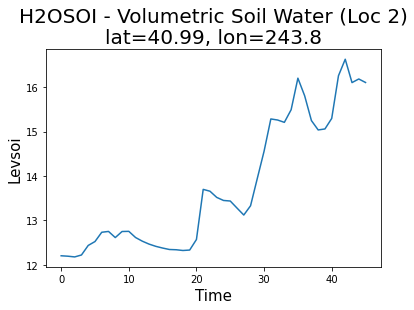

In [151]:
#Plotting the H2OSOI variable DataFrame (Loc 2) using line plot function

df_loc_2_H2OSOI_f1_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 2)\nlat=40.99, lon=243.8",size=20)

In [152]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 3)

data_3_f1 = xr.merge((loc_3_H2OSOI,loc_3_DZSOI,loc_3_ZSOI), compat='override')

In [153]:
#Displaying the Dataset (Loc 3)

data_3_f1

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 0.2639 0.267 0.2724 ... 0.3234 0.347 0.4098
    DZSOI    (levgrnd) float32 0.02 0.04 0.06 0.08 ... 4.676 7.635 11.14 15.12
    ZSOI     (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [154]:
data_3_mul_50_f1 = data_3_f1 * 50
data_3_mul_50_f1

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 13.19 13.35 13.62 ... 16.17 17.35 20.49
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [155]:
#Creating a DataFrame for the variable H2OSOI (Loc 3)

df_loc_3_H2OSOI_f1 = pd.DataFrame(data_3_mul_50_f1.H2OSOI)
df_loc_3_H2OSOI_f1

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,13.192780,13.348543,13.620194,14.679090,14.925774,15.046394,16.191917,16.040688,16.110775,14.372143,14.332090,14.256114,14.944456,14.926453,14.949201,15.088179,15.431845,16.089222,17.330084,20.495323
1,13.173096,13.336283,13.611351,14.671120,14.918238,15.038533,16.183720,16.032782,16.103474,14.366961,14.329026,14.255317,14.945541,14.929215,14.952753,15.091207,15.433691,16.090033,17.330206,20.494410
2,13.409527,13.466534,13.649058,14.671498,14.905177,15.023520,16.167967,16.017635,16.089367,14.356817,14.322892,14.253539,14.947393,14.934379,14.959565,15.097113,15.437332,16.091640,17.330471,20.494247
3,13.660824,13.766484,13.938418,14.895950,15.022427,15.051070,16.164736,16.004923,16.075808,14.346717,14.316595,14.251465,14.948863,14.939176,14.966152,15.102967,15.441002,16.093275,17.330770,20.494190
4,13.607998,13.700752,13.898258,14.898234,15.068901,15.097652,16.189583,16.004852,16.065962,14.337026,14.310198,14.249124,14.949970,14.943615,14.972509,15.108763,15.444697,16.094940,17.331093,20.493898
5,14.107506,14.044083,14.084302,15.002862,15.121744,15.128052,16.211910,16.012865,16.062534,14.328742,14.303907,14.246564,14.950737,14.947705,14.978632,15.114488,15.448414,16.096630,17.331438,20.493895
6,15.425219,15.268512,15.098396,15.770666,15.581261,15.310923,16.282827,16.032925,16.065247,14.322598,14.298059,14.243868,14.951197,14.951456,14.984514,15.120132,15.452144,16.098349,17.331800,20.493668
7,15.217407,15.200943,15.245928,16.082840,16.002155,15.664957,16.511129,16.119310,16.088486,14.320369,14.293093,14.241165,14.951391,14.954885,14.990155,15.125692,15.455882,16.100090,17.332174,20.493567
8,14.902420,14.954305,15.088266,16.006790,16.036173,15.823743,16.717495,16.264338,16.154722,14.328164,14.290195,14.238683,14.951385,14.958005,14.995556,15.131155,15.459622,16.101854,17.332560,20.493423
9,16.016956,14.401648,14.663625,15.695151,15.867829,15.814301,16.803961,16.386162,16.247705,14.351151,14.291577,14.236901,14.951293,14.960848,15.000716,15.136517,15.463361,16.103638,17.332954,20.493198


In [156]:
df_loc_3_H2OSOI_f1_5 = df_loc_3_H2OSOI_f1.iloc[:,:5]
df_loc_3_H2OSOI_f1_5

,0,1,2,3,4
0,13.192780,13.348543,13.620194,14.679090,14.925774
1,13.173096,13.336283,13.611351,14.671120,14.918238
2,13.409527,13.466534,13.649058,14.671498,14.905177
3,13.660824,13.766484,13.938418,14.895950,15.022427
4,13.607998,13.700752,13.898258,14.898234,15.068901
5,14.107506,14.044083,14.084302,15.002862,15.121744
6,15.425219,15.268512,15.098396,15.770666,15.581261
7,15.217407,15.200943,15.245928,16.082840,16.002155
8,14.902420,14.954305,15.088266,16.006790,16.036173
9,16.016956,14.401648,14.663625,15.695151,15.867829


In [157]:
df_loc_3_H2OSOI_f1_5_mean = df_loc_3_H2OSOI_f1_5.mean(axis = 1, skipna = True)
df_loc_3_H2OSOI_f1_5_mean

0     13.953276
1     13.942017
2     14.020358
3     14.256821
4     14.234830
5     14.472099
6     15.428810
7     15.549853
8     15.397591
9     15.329042
10    15.004623
11    14.749304
12    14.624072
13    14.533709
14    14.455591
15    14.395739
16    14.345204
17    14.305860
18    14.257294
19    14.440664
20    16.117428
21    17.329329
22    16.433489
23    15.840761
24    15.716207
25    15.985052
26    15.546481
27    15.663843
28    16.844830
29    17.217402
30    17.603291
31    18.134855
32    17.969625
33    18.274445
34    17.966770
35    17.282757
36    17.174053
37    16.622091
38    16.599039
39    16.327223
40    16.002115
41    15.854291
42    16.304394
43    16.246746
44    15.904500
45    15.676619
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 3)\nlat=40.99, lon=242.5')

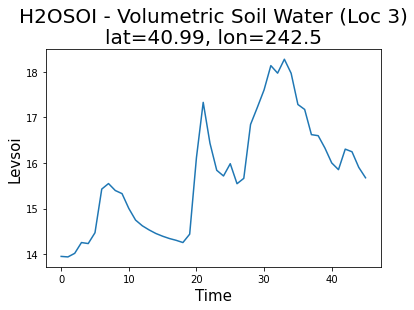

In [158]:
#Plotting the H2OSOI variable DataFrame (Loc 3) using line plot function

df_loc_3_H2OSOI_f1_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 3)\nlat=40.99, lon=242.5",size=20)

In [159]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 4)

data_4_f1 = xr.merge((loc_4_H2OSOI,loc_4_DZSOI,loc_4_ZSOI), compat='override')

In [160]:
#Displaying the Dataset (Loc 4)

data_4_f1

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 0.3566 0.3626 0.369 ... 0.4399 0.4399 0.4399
    DZSOI    (levgrnd) float32 0.02 0.04 0.06 0.08 ... 4.676 7.635 11.14 15.12
    ZSOI     (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [161]:
data_4_mul_50_f1 = data_4_f1 * 50
data_4_mul_50_f1

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2016-01-25 00:00:00 ... 2016-03-11 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 17.83 18.13 18.45 ... 21.99 21.99 21.99
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [162]:
#Creating a DataFrame for the variable H2OSOI (Loc 4)

df_loc_4_H2OSOI_f1 = pd.DataFrame(data_4_mul_50_f1.H2OSOI)
df_loc_4_H2OSOI_f1

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,17.829178,18.128422,18.450556,18.955833,19.592653,19.793324,19.814749,19.726305,20.690056,21.425312,21.866999,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
1,17.394634,17.740204,18.125448,18.699295,19.406063,19.677454,19.755579,19.697620,20.647131,21.373507,21.866999,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
2,17.113527,17.470354,17.871540,18.466904,19.201595,19.498680,19.603653,19.565475,20.471905,21.240265,21.866999,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
3,16.946169,17.309467,17.718222,18.322363,19.067833,19.368721,19.473852,19.426222,20.281906,21.015722,21.866999,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
4,16.813694,17.181841,17.596722,18.208130,18.962296,19.266016,19.370634,19.314837,20.141094,20.678411,21.863348,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
5,16.674833,17.052248,17.477903,18.099829,18.864243,19.171259,19.273149,19.202379,19.990086,20.343485,21.846483,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
6,16.536016,16.921577,17.357145,17.989210,18.763868,19.074430,19.174139,19.090261,19.846020,20.047981,21.780243,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
7,16.420042,16.809280,17.249832,17.888130,18.670418,18.983784,19.083605,18.995123,19.738695,19.771772,21.644175,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
8,16.347446,16.733017,17.170813,17.809013,18.593948,18.906450,19.003368,18.904762,19.622017,19.521555,21.479115,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
9,16.287106,16.674297,17.112392,17.750103,18.534880,18.842033,18.930365,18.814970,19.501225,19.283730,21.314356,21.866999,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993


In [163]:
df_loc_4_H2OSOI_f1_5 = df_loc_4_H2OSOI_f1.iloc[:,:5]
df_loc_4_H2OSOI_f1_5

,0,1,2,3,4
0,17.829178,18.128422,18.450556,18.955833,19.592653
1,17.394634,17.740204,18.125448,18.699295,19.406063
2,17.113527,17.470354,17.871540,18.466904,19.201595
3,16.946169,17.309467,17.718222,18.322363,19.067833
4,16.813694,17.181841,17.596722,18.208130,18.962296
5,16.674833,17.052248,17.477903,18.099829,18.864243
6,16.536016,16.921577,17.357145,17.989210,18.763868
7,16.420042,16.809280,17.249832,17.888130,18.670418
8,16.347446,16.733017,17.170813,17.809013,18.593948
9,16.287106,16.674297,17.112392,17.750103,18.534880


In [164]:
df_loc_4_H2OSOI_f1_5_mean = df_loc_4_H2OSOI_f1_5.mean(axis = 1, skipna = True)
df_loc_4_H2OSOI_f1_5_mean

0     18.591328
1     18.273129
2     18.024784
3     17.872812
4     17.752537
5     17.633812
6     17.513565
7     17.407541
8     17.330847
9     17.271755
10    17.188923
11    17.111942
12    16.989527
13    16.892605
14    16.828312
15    16.785074
16    16.890644
17    16.819218
18    16.728031
19    16.713593
20    16.613857
21    16.543373
22    16.603312
23    16.479221
24    16.413754
25    16.355541
26    16.328823
27    16.272097
28    16.219927
29    16.180477
30    16.192001
31    16.122805
32    16.056873
33    16.007244
34    15.974943
35    15.937025
36    15.919928
37    15.885800
38    15.825177
39    15.780721
40    15.752742
41    15.711691
42    15.685966
43    15.640696
44    15.580174
45    15.542984
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 4)\nlat=11.78, lon=80.0')

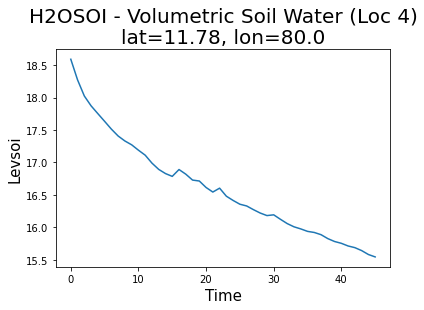

In [165]:
#Plotting the H2OSOI variable DataFrame (Loc 4) using line plot function

df_loc_4_H2OSOI_f1_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 4)\nlat=11.78, lon=80.0",size=20)

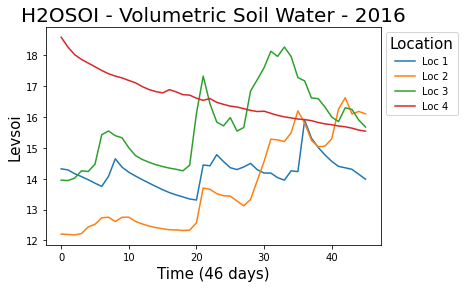

In [166]:
#Plotting the H2OSOI variable DataFrame for all locations using line plot function

df_loc_1_H2OSOI_f1_5_mean.plot(kind='line', label = 'Loc 1')
df_loc_2_H2OSOI_f1_5_mean.plot(kind='line', label = 'Loc 2')
df_loc_3_H2OSOI_f1_5_mean.plot(kind='line', label = 'Loc 3')
df_loc_4_H2OSOI_f1_5_mean.plot(kind='line', label = 'Loc 4')
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2016",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

In [189]:
ds_f2 = xr.open_dataset("cesm2cam6v2.2017-01-23.09.clm2.h0.2017-01-23-00000.nc", engine="netcdf4")

In [190]:
ds_f2

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, hist_interval: 2, lon: 288, lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi
Data variables: (12/56)
    mcdate          (time) int32 ...
    mcsec           (time) int32 ...
    mdcur           (time) int32 ...
    mscur           (time) int32 ...
    nstep           (time) int32 ...
    time_bounds     (time, hist_interval) object ...
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 ...
    SOILWATER_10CM  (time, lat, lon) float32 ...
    TLAI            (time, lat, lon) float32 ...
    TOTECOSYSC      (time, lat, lon) float32 ...
    TOTVEGC         (time, lat, lon) float32 ...
    TWS             (time, lat, lon) float32 ...
Attributes: (12/100)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 09/29/20 08:44:39
    source:                                    Community Land Model CLM4.0
    hostname:                                  cheyenne
    ...                                        ...
    cft_irrigated_switchgrass:                 60
    cft_tropical_corn:                         61
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          day_1

In [191]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

loc_1_H2OSOI_f2=ds_f2.H2OSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_DZSOI_f2=ds_f2.DZSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_ZSOI_f2 = ds_f2.ZSOI.sel(lat=34.0522, lon=241.75, method='nearest')

#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

loc_2_H2OSOI_f2=ds_f2.H2OSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_DZSOI_f2=ds_f2.DZSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_ZSOI_f2 = ds_f2.ZSOI.sel(lat=41.02, lon=244.05, method='nearest')

#Boston Location - Latitude & Longitude co-ordinates
# identified Location is Near to Boston

loc_3_H2OSOI_f2=ds_f2.H2OSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_DZSOI_f2=ds_f2.DZSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_ZSOI_f2 = ds_f2.ZSOI.sel(lat=41.08, lon=243.05, method='nearest')

#Villupuram - Latitude & Longitude co-ordinates
# identified Location is around VPM

loc_4_H2OSOI_f2=ds_f2.H2OSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_DZSOI_f2=ds_f2.DZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_ZSOI_f2 = ds_f2.ZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')

In [192]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 1)
data_1_f2 = xr.merge((loc_1_H2OSOI_f2,loc_1_DZSOI_f2,loc_1_ZSOI_f2), compat='override')
data_1_f2

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [193]:
dataa_1_f2_mul_50 = data_1_f2 * 50
dataa_1_f2_mul_50

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 23.65 22.64 22.59 22.66 ... 16.86 17.4 18.28
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [194]:
#Creating a DataFrame for the variable H2OSOI (Loc 1)
df_loc_1_H2OSOI_f2 = pd.DataFrame(dataa_1_f2_mul_50.H2OSOI)
df_loc_1_H2OSOI_f2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,23.647057,22.642391,22.593958,22.657644,22.434666,21.949148,20.692392,19.125620,18.090445,14.863053,13.944573,13.681236,15.101698,15.327035,15.610793,15.939919,16.325504,16.797499,17.417852,18.334261
1,21.793394,20.866684,20.947412,21.224312,21.299515,21.297758,20.868271,20.224028,19.346848,15.393846,14.050001,13.700220,15.106233,15.327681,15.610571,15.939541,16.325098,16.797064,17.417334,18.333530
2,20.130949,19.370659,19.612343,20.039780,20.246820,20.370466,20.197109,20.060930,19.954386,16.764786,14.596054,13.766627,15.117794,15.329352,15.610210,15.938815,16.324308,16.796215,17.416319,18.332100
3,19.505838,18.792309,19.073189,19.535160,19.765104,19.891981,19.747057,19.661230,19.664663,17.185087,15.439667,13.939821,15.139866,15.332108,15.610002,15.938117,16.323523,16.795366,17.415304,18.330666
4,19.030872,18.357704,18.675129,19.170563,19.425976,19.563156,19.437239,19.369179,19.406588,17.177876,16.023277,14.248959,15.186700,15.337284,15.610066,15.937455,16.322746,16.794519,17.414289,18.329229
5,18.681494,18.038605,18.382025,18.900188,19.171684,19.312548,19.196596,19.136915,19.192736,17.102884,16.291405,14.617048,15.272704,15.347174,15.610625,15.936859,16.321978,16.793673,17.413275,18.327789
6,18.403997,17.782743,18.144903,18.680168,18.964140,19.108023,19.000221,18.946625,19.014675,17.010815,16.386370,14.948715,15.403126,15.364779,15.612025,15.936363,16.321224,16.792830,17.412260,18.326347
7,18.187145,17.582359,17.957859,18.504807,18.796511,18.940157,18.836714,18.786057,18.861553,16.913370,16.405695,15.198748,15.570100,15.393093,15.614746,15.936028,16.320494,16.791988,17.411247,18.324903
8,18.009624,17.411894,17.794834,18.350809,18.649887,18.795015,18.696344,18.647783,18.727728,16.817928,16.392139,15.366747,15.756292,15.434292,15.619394,15.935930,16.319796,16.791153,17.410233,18.323456
9,17.905277,17.314795,17.699583,18.254583,18.549109,18.683676,18.579998,18.528040,18.609253,16.727724,16.362507,15.471636,15.942624,15.489109,15.626624,15.936171,16.319147,16.790325,17.409220,18.322006


In [195]:
df_loc_1_H2OSOI_f2_5 = df_loc_1_H2OSOI_f2.iloc[:,:5]  
df_loc_1_H2OSOI_f2_5

,0,1,2,3,4
0,23.647057,22.642391,22.593958,22.657644,22.434666
1,21.793394,20.866684,20.947412,21.224312,21.299515
2,20.130949,19.370659,19.612343,20.039780,20.246820
3,19.505838,18.792309,19.073189,19.535160,19.765104
4,19.030872,18.357704,18.675129,19.170563,19.425976
5,18.681494,18.038605,18.382025,18.900188,19.171684
6,18.403997,17.782743,18.144903,18.680168,18.964140
7,18.187145,17.582359,17.957859,18.504807,18.796511
8,18.009624,17.411894,17.794834,18.350809,18.649887
9,17.905277,17.314795,17.699583,18.254583,18.549109


In [196]:
df_loc_1_H2OSOI_f2_5_mean = df_loc_1_H2OSOI_f2_5.mean(axis = 1, skipna = True)
df_loc_1_H2OSOI_f2_5_mean

0     22.795145
1     21.226263
2     19.880110
3     19.334320
4     18.932049
5     18.634800
6     18.395191
7     18.205736
8     18.043409
9     17.944670
10    17.795633
11    17.673985
12    17.566647
13    17.502897
14    17.504221
15    17.405870
16    18.664511
17    18.245800
18    17.880951
19    17.664461
20    17.490065
21    17.337910
22    17.205441
23    17.087402
24    16.992302
25    17.036520
26    18.705667
27    18.827179
28    20.559147
29    21.600637
30    19.941135
31    20.227314
32    20.488211
33    19.482368
34    19.040682
35    18.740993
36    18.516302
37    18.401133
38    18.213770
39    18.032913
40    17.873348
41    17.723499
42    17.579062
43    17.457249
44    17.359310
45    17.278294
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2017 \nlat=34.4, lon=241.2')

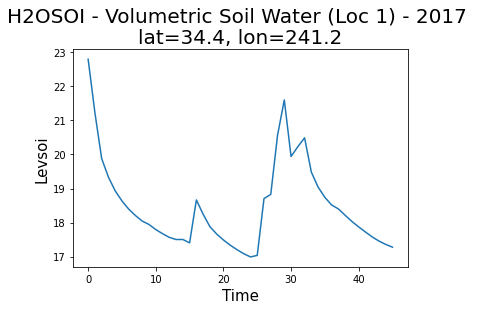

In [197]:
#Plotting the H2OSOI variable DataFrame (Loc 1) using line plot function
df_loc_1_H2OSOI_f2_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2017 \nlat=34.4, lon=241.2",size=20)

In [198]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 2)
data_2_f2 = xr.merge((loc_2_H2OSOI_f2,loc_2_DZSOI_f2,loc_2_ZSOI_f2), compat='override')
data_2_f2

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [199]:
data_2_mul_50_f2 = data_2_f2 * 50
data_2_mul_50_f2

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 10.46 10.7 11.23 ... 14.69 18.94 0.002193
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [200]:
#Creating a DataFrame for the variable H2OSOI (Loc 2)
df_loc_2_H2OSOI_f2 = pd.DataFrame(data_2_mul_50_f2.H2OSOI)
df_loc_2_H2OSOI_f2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,10.459617,10.696222,11.231091,12.464433,13.059955,13.234033,13.036167,12.932094,13.001919,12.449018,12.518990,12.589807,12.661083,12.742947,12.863501,13.091787,13.576385,14.689924,18.941746,0.002193
1,10.446519,10.691740,11.228317,12.461794,13.057438,13.231153,13.033075,12.929084,12.999117,12.446595,12.516910,12.588138,12.659945,12.742494,12.863706,13.092285,13.576722,14.689870,18.942127,0.002193
2,10.435640,10.682312,11.220982,12.455564,13.051894,13.225574,13.027143,12.923260,12.993671,12.441875,12.512846,12.584864,12.657690,12.741563,12.864057,13.093223,13.577366,14.689827,18.942076,0.002193
3,10.427824,10.674610,11.213878,12.448959,13.045824,13.219849,13.021313,12.917542,12.988287,12.437191,12.508796,12.581582,12.655404,12.740566,12.864333,13.094110,13.577988,14.689840,18.942217,0.002193
4,10.420732,10.667542,11.207144,12.442490,13.039669,13.214003,13.015507,12.911908,12.982969,12.432546,12.504763,12.578297,12.653086,12.739507,12.864536,13.094944,13.578588,14.689896,18.942282,0.002193
5,10.414001,10.660808,11.200657,12.436179,13.033567,13.208133,13.009713,12.906337,12.977711,12.427938,12.500747,12.575005,12.650739,12.738389,12.864669,13.095726,13.579167,14.689962,18.942162,0.002193
6,10.407500,10.654294,11.194352,12.430009,13.027551,13.202291,13.003943,12.900814,12.972508,12.423368,12.496747,12.571712,12.648365,12.737215,12.864733,13.096457,13.579726,14.690034,18.942175,0.002193
7,10.401173,10.647948,11.188193,12.423963,13.021626,13.196505,12.998210,12.895338,12.967357,12.418834,12.492767,12.568418,12.645965,12.735987,12.864730,13.097135,13.580266,14.690110,18.942188,0.002193
8,10.394985,10.641741,11.182160,12.418029,13.015793,13.190781,12.992520,12.889908,12.962254,12.414333,12.488805,12.565121,12.643539,12.734708,12.864661,13.097761,13.580781,14.690189,18.942122,0.002193
9,10.388921,10.635654,11.176240,12.412197,13.010049,13.185127,12.986883,12.884523,12.957191,12.409867,12.484862,12.561827,12.641093,12.733382,12.864529,13.098338,13.581276,14.690259,18.942148,0.002193


In [201]:
df_loc_2_H2OSOI_f2_5 = df_loc_2_H2OSOI_f2.iloc[:,:5]
df_loc_2_H2OSOI_f2_5

,0,1,2,3,4
0,10.459617,10.696222,11.231091,12.464433,13.059955
1,10.446519,10.691740,11.228317,12.461794,13.057438
2,10.435640,10.682312,11.220982,12.455564,13.051894
3,10.427824,10.674610,11.213878,12.448959,13.045824
4,10.420732,10.667542,11.207144,12.442490,13.039669
5,10.414001,10.660808,11.200657,12.436179,13.033567
6,10.407500,10.654294,11.194352,12.430009,13.027551
7,10.401173,10.647948,11.188193,12.423963,13.021626
8,10.394985,10.641741,11.182160,12.418029,13.015793
9,10.388921,10.635654,11.176240,12.412197,13.010049


In [202]:
df_loc_2_H2OSOI_f2_5_mean = df_loc_2_H2OSOI_f2_5.mean(axis = 1, skipna = True)
df_loc_2_H2OSOI_f2_5_mean

0     11.582263
1     11.577162
2     11.569279
3     11.562220
4     11.555515
5     11.549044
6     11.542741
7     11.536581
8     11.530542
9     11.524611
10    11.518784
11    11.513047
12    11.507400
13    11.501836
14    11.496348
15    11.490939
16    11.485604
17    11.480339
18    11.732379
19    11.929532
20    11.918996
21    11.813475
22    11.754159
23    11.751802
24    11.935600
25    12.286437
26    14.949435
27    15.515711
28    15.810637
29    16.325312
30    15.645842
31    15.472776
32    15.636928
33    15.300894
34    15.016602
35    14.942099
36    14.889775
37    15.323059
38    15.462626
39    15.400670
40    15.120511
41    14.921198
42    15.028114
43    15.007524
44    15.087527
45    15.582375
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2017 \nlat=40.99, lon=243.8')

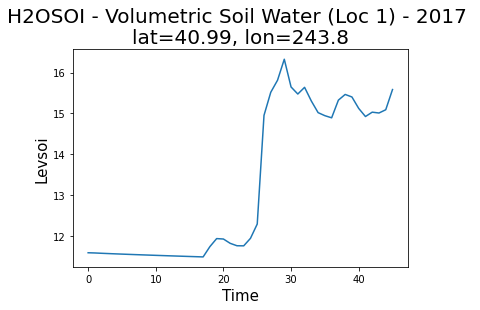

In [203]:
#Plotting the H2OSOI variable DataFrame (Loc 2) using line plot function
df_loc_2_H2OSOI_f2_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2017 \nlat=40.99, lon=243.8",size=20)

In [204]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 3)
data_3_f2 = xr.merge((loc_3_H2OSOI_f2,loc_3_DZSOI_f2,loc_3_ZSOI_f2), compat='override')
data_3_f2

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [205]:
data_3_mul_50_f2 = data_3_f2 * 50
data_3_mul_50_f2

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 13.58 13.71 13.93 14.98 ... 16.19 17.4 20.64
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [206]:
#Creating a DataFrame for the variable H2OSOI (Loc 3)
df_loc_3_H2OSOI_f2 = pd.DataFrame(data_3_mul_50_f2.H2OSOI)
df_loc_3_H2OSOI_f2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,13.578457,13.714722,13.930027,14.983378,15.221098,15.329144,16.477226,16.300964,16.337358,14.498581,14.368023,14.218137,14.872151,14.858027,14.912123,15.087957,15.457053,16.128376,17.388199,20.642492
1,13.546601,13.691666,13.911382,14.966763,15.205876,15.314884,16.463659,16.289825,16.329227,14.497645,14.371570,14.222926,14.876528,14.861486,14.914991,15.090081,15.458258,16.128876,17.388252,20.641579
2,13.508280,13.651031,13.876719,14.933827,15.175536,15.287685,16.437738,16.268215,16.312893,14.494549,14.377238,14.231782,14.885092,14.868362,14.920631,15.094251,15.460642,16.129868,17.388390,20.641573
3,13.476946,13.609889,13.846720,14.904415,15.147357,15.261705,16.412630,16.246883,16.296165,14.489852,14.381160,14.239790,14.893538,14.875357,14.926309,15.098434,15.463058,16.130886,17.388563,20.641527
4,13.450083,13.570229,13.819161,14.877378,15.121309,15.237247,16.388542,16.225933,16.279230,14.483866,14.383531,14.246902,14.901752,14.882426,14.932026,15.102636,15.465508,16.131931,17.388763,20.641453
5,13.424972,13.532763,13.793543,14.852229,15.096977,15.214160,16.365524,16.205494,16.262255,14.476843,14.384535,14.253108,14.909640,14.889524,14.937787,15.106861,15.467991,16.133003,17.388985,20.641407
6,13.398367,13.498227,13.769581,14.828643,15.074076,15.192272,16.343512,16.185635,16.245382,14.468998,14.384346,14.258427,14.917128,14.896603,14.943583,15.111108,15.470505,16.134100,17.389219,20.641344
7,13.358776,13.473484,13.746940,14.806303,15.052348,15.171427,16.322420,16.166370,16.228706,14.460510,14.383122,14.262886,14.924163,14.903611,14.949409,15.115380,15.473050,16.135221,17.389467,20.641190
8,13.351710,13.480856,13.742211,14.794235,15.034966,15.152150,16.302275,16.147703,16.212294,14.451530,14.381005,14.266534,14.930707,14.910504,14.955254,15.119678,15.475623,16.136366,17.389725,20.641243
9,13.467267,13.550706,13.757799,14.789577,15.022787,15.136192,16.283943,16.129826,16.196211,14.442179,14.378121,14.269421,14.936741,14.917241,14.961102,15.123999,15.478228,16.137535,17.389990,20.641037


In [207]:
df_loc_3_H2OSOI_f2_5 = df_loc_3_H2OSOI_f2.iloc[:,:5]
df_loc_3_H2OSOI_f2_5

,0,1,2,3,4
0,13.578457,13.714722,13.930027,14.983378,15.221098
1,13.546601,13.691666,13.911382,14.966763,15.205876
2,13.508280,13.651031,13.876719,14.933827,15.175536
3,13.476946,13.609889,13.846720,14.904415,15.147357
4,13.450083,13.570229,13.819161,14.877378,15.121309
5,13.424972,13.532763,13.793543,14.852229,15.096977
6,13.398367,13.498227,13.769581,14.828643,15.074076
7,13.358776,13.473484,13.746940,14.806303,15.052348
8,13.351710,13.480856,13.742211,14.794235,15.034966
9,13.467267,13.550706,13.757799,14.789577,15.022787


In [208]:
df_loc_3_H2OSOI_f2_5_mean = df_loc_3_H2OSOI_f2_5.mean(axis = 1, skipna = True)
df_loc_3_H2OSOI_f2_5_mean

0     14.285536
1     14.264458
2     14.229078
3     14.197065
4     14.167631
5     14.140097
6     14.113779
7     14.087570
8     14.080795
9     14.117627
10    14.334826
11    14.380885
12    14.274157
13    14.250059
14    14.144783
15    14.090245
16    14.053747
17    14.021573
18    13.996910
19    13.980309
20    14.090154
21    14.049120
22    14.105395
23    14.303044
24    14.281656
25    15.348068
26    17.412462
27    17.454882
28    17.757727
29    18.624706
30    17.688351
31    17.969769
32    17.981869
33    17.545048
34    17.165859
35    17.183783
36    18.354849
37    18.615614
38    17.984858
39    17.515224
40    17.199373
41    17.264366
42    17.472464
43    17.596455
44    17.905859
45    18.409817
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2017 \nlat=40.99, lon=242.5')

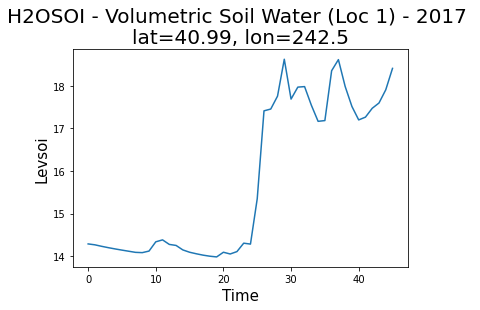

In [209]:
#Plotting the H2OSOI variable DataFrame (Loc 3) using line plot function
df_loc_3_H2OSOI_f2_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2017 \nlat=40.99, lon=242.5",size=20)

In [210]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 4)
data_4_f2 = xr.merge((loc_4_H2OSOI_f2,loc_4_DZSOI_f2,loc_4_ZSOI_f2), compat='override')
data_4_f2

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [211]:
data_4_mul_50_f2 = data_4_f2 * 50
data_4_mul_50_f2

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2017-01-23 00:00:00 ... 2017-03-09 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 15.8 16.18 16.57 17.12 ... 21.98 21.99 21.99
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [212]:
#Creating a DataFrame for the variable H2OSOI (Loc 4)
df_loc_4_H2OSOI_f2 = pd.DataFrame(data_4_mul_50_f2.H2OSOI)
df_loc_4_H2OSOI_f2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,15.803843,16.181345,16.568289,17.122475,17.803528,17.832916,17.450588,16.480042,16.365063,15.047118,15.227347,15.439833,16.026289,16.369099,16.915543,17.967182,21.539251,21.993000,21.993,21.993
1,15.374537,15.810941,16.268362,16.886921,17.626139,17.716022,17.408571,16.533716,16.428377,15.064700,15.226826,15.435020,16.020988,16.364038,16.910666,17.961212,21.519831,21.993000,21.993,21.993
2,14.986367,15.443034,15.928416,16.582338,17.366816,17.515812,17.298059,16.563931,16.514357,15.104567,15.232536,15.427929,16.011303,16.354410,16.901428,17.949877,21.480753,21.993000,21.993,21.993
3,14.757304,15.198781,15.684303,16.354879,17.167551,17.352041,17.185841,16.539404,16.549412,15.139292,15.244621,15.424702,16.003138,16.345364,16.892586,17.938541,21.440733,21.993000,21.993,21.993
4,14.837092,15.223089,15.643366,16.267174,17.058455,17.236006,17.089338,16.495981,16.551723,15.161848,15.257783,15.424641,15.996853,16.337112,16.884085,17.927067,21.400051,21.993000,21.993,21.993
5,14.799174,15.199002,15.616880,16.227736,17.006781,17.170046,17.022213,16.452362,16.537407,15.172665,15.268527,15.426310,15.992344,16.329790,16.875935,17.915640,21.358692,21.993000,21.993,21.993
6,14.968186,15.262912,15.607004,16.187164,16.958015,17.118662,16.972660,16.414759,16.517265,15.174897,15.275507,15.428344,15.989177,16.323418,16.868231,17.904972,21.316114,21.993000,21.993,21.993
7,15.378634,15.668785,15.935766,16.404692,17.075010,17.145159,16.952324,16.385136,16.496412,15.171803,15.278859,15.429873,15.986843,16.317921,16.861118,17.895205,21.272226,21.993000,21.993,21.993
8,14.710021,15.153842,15.614017,16.245983,17.023571,17.156828,16.965555,16.374773,16.480618,15.166123,15.279291,15.430466,15.984874,16.313141,16.854548,17.885517,21.227875,21.993000,21.993,21.993
9,14.579448,15.016730,15.465422,16.099825,16.899208,17.074642,16.928352,16.361059,16.469564,15.160142,15.277770,15.430016,15.982914,16.308872,16.848383,17.875784,21.183334,21.993000,21.993,21.993


In [213]:
df_loc_4_H2OSOI_f2_5 = df_loc_4_H2OSOI_f2.iloc[:,:5]
df_loc_4_H2OSOI_f2_5

,0,1,2,3,4
0,15.803843,16.181345,16.568289,17.122475,17.803528
1,15.374537,15.810941,16.268362,16.886921,17.626139
2,14.986367,15.443034,15.928416,16.582338,17.366816
3,14.757304,15.198781,15.684303,16.354879,17.167551
4,14.837092,15.223089,15.643366,16.267174,17.058455
5,14.799174,15.199002,15.616880,16.227736,17.006781
6,14.968186,15.262912,15.607004,16.187164,16.958015
7,15.378634,15.668785,15.935766,16.404692,17.075010
8,14.710021,15.153842,15.614017,16.245983,17.023571
9,14.579448,15.016730,15.465422,16.099825,16.899208


In [214]:
df_loc_4_H2OSOI_f2_5_mean = df_loc_4_H2OSOI_f2_5.mean(axis = 1, skipna = True)
df_loc_4_H2OSOI_f2_5_mean

0     16.695896
1     16.393379
2     16.061394
3     15.832563
4     15.805835
5     15.769916
6     15.796657
7     16.092579
8     15.749487
9     15.612126
10    15.553324
11    15.495303
12    15.408951
13    15.309729
14    15.229548
15    15.157245
16    15.089918
17    15.044901
18    14.993425
19    14.926325
20    14.862590
21    14.789444
22    14.763873
23    14.731306
24    14.677615
25    14.631937
26    14.610214
27    14.554716
28    14.496727
29    14.450714
30    14.409022
31    14.361456
32    14.393341
33    14.412120
34    14.354017
35    14.307554
36    14.646429
37    15.132347
38    14.821716
39    14.676018
40    14.582911
41    14.621274
42    14.805890
43    14.603662
44    14.522757
45    14.428902
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2017 \nlat=11.78, lon=80.0')

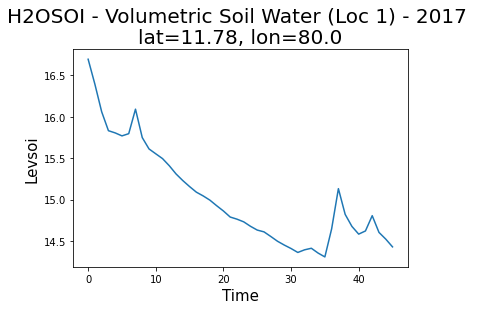

In [215]:
#Plotting the H2OSOI variable DataFrame (Loc 4) using line plot function
df_loc_4_H2OSOI_f2_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2017 \nlat=11.78, lon=80.0",size=20)

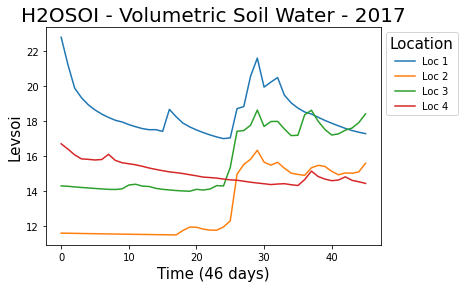

In [216]:
#Plotting the H2OSOI variable DataFrame for all locations using line plot function
df_loc_1_H2OSOI_f2_5_mean.plot(kind='line', label = 'Loc 1')
df_loc_2_H2OSOI_f2_5_mean.plot(kind='line', label = 'Loc 2')
df_loc_3_H2OSOI_f2_5_mean.plot(kind='line', label = 'Loc 3')
df_loc_4_H2OSOI_f2_5_mean.plot(kind='line', label = 'Loc 4')
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2017",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

In [217]:
ds_f3 = xr.open_dataset("cesm2cam6v2.2018-01-22.09.clm2.h0.2018-01-22-00000.nc", engine="netcdf4")

In [218]:
ds_f3

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, hist_interval: 2, lon: 288, lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi
Data variables: (12/56)
    mcdate          (time) int32 ...
    mcsec           (time) int32 ...
    mdcur           (time) int32 ...
    mscur           (time) int32 ...
    nstep           (time) int32 ...
    time_bounds     (time, hist_interval) object ...
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 ...
    SOILWATER_10CM  (time, lat, lon) float32 ...
    TLAI            (time, lat, lon) float32 ...
    TOTECOSYSC      (time, lat, lon) float32 ...
    TOTVEGC         (time, lat, lon) float32 ...
    TWS             (time, lat, lon) float32 ...
Attributes: (12/100)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 10/03/20 13:52:33
    source:                                    Community Land Model CLM4.0
    hostname:                                  cheyenne
    ...                                        ...
    cft_irrigated_switchgrass:                 60
    cft_tropical_corn:                         61
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          day_1

In [219]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

loc_1_H2OSOI_f3=ds_f3.H2OSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_DZSOI_f3=ds_f3.DZSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_ZSOI_f3 = ds_f3.ZSOI.sel(lat=34.0522, lon=241.75, method='nearest')

#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

loc_2_H2OSOI_f3=ds_f3.H2OSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_DZSOI_f3=ds_f3.DZSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_ZSOI_f3 = ds_f3.ZSOI.sel(lat=41.02, lon=244.05, method='nearest')

#Boston Location - Latitude & Longitude co-ordinates
# identified Location is Near to Boston

loc_3_H2OSOI_f3=ds_f3.H2OSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_DZSOI_f3=ds_f3.DZSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_ZSOI_f3 = ds_f3.ZSOI.sel(lat=41.08, lon=243.05, method='nearest')

#Villupuram - Latitude & Longitude co-ordinates
# identified Location is around VPM

loc_4_H2OSOI_f3=ds_f3.H2OSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_DZSOI_f3=ds_f3.DZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_ZSOI_f3 = ds_f3.ZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')

In [220]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 1)
data_1_f3 = xr.merge((loc_1_H2OSOI_f3,loc_1_DZSOI_f3,loc_1_ZSOI_f3), compat='override')
data_1_f3

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [221]:
dataa_1_mul_50_f3 = data_1_f3 * 50
dataa_1_mul_50_f3

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 15.5 15.13 15.67 16.36 ... 17.7 18.66 20.46
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [222]:
#Creating a DataFrame for the variable H2OSOI (Loc 1)
df_loc_1_H2OSOI_f3 = pd.DataFrame(dataa_1_mul_50_f3.H2OSOI)
df_loc_1_H2OSOI_f3

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,15.500954,15.125549,15.674903,16.356312,16.720345,16.805779,16.645100,16.409420,16.233183,14.004408,13.829602,13.990309,15.601985,15.878117,16.207317,16.599669,17.086897,17.736797,18.710587,20.559593
1,15.503770,15.104957,15.637012,16.316349,16.686508,16.778612,16.624142,16.396654,16.232861,14.030088,13.848244,13.995147,15.602849,15.877780,16.206760,16.599140,17.086428,17.736338,18.710003,20.558493
2,15.393442,15.006575,15.550560,16.241499,16.622902,16.725615,16.583399,16.371696,16.230124,14.074874,13.884449,14.005491,15.605012,15.877269,16.205709,16.598114,17.085506,17.735437,18.708866,20.556324
3,15.267113,14.903612,15.465077,16.168987,16.561075,16.673342,16.543003,16.346447,16.224800,14.112374,13.919645,14.016973,15.607884,15.877003,16.204716,16.597103,17.084589,17.734533,18.707735,20.554136
4,15.158294,14.804679,15.377480,16.093174,16.497057,16.620674,16.502777,16.320765,16.217325,14.143689,13.953275,14.029373,15.611471,15.877004,16.203798,16.596107,17.083675,17.733631,18.706608,20.551931
5,15.264803,14.845720,15.370655,16.059677,16.450106,16.572069,16.463066,16.294598,16.207991,14.169757,13.984958,14.042476,15.615757,15.877302,16.202967,16.595135,17.082764,17.732727,18.705481,20.549711
6,15.136427,14.769498,15.326635,16.029491,16.422243,16.538256,16.429064,16.269157,16.197189,14.191370,14.014467,14.056057,15.620704,15.877912,16.202232,16.594187,17.081861,17.731825,18.704350,20.547480
7,15.032661,14.681814,15.254836,15.971963,16.377382,16.502342,16.398670,16.245617,16.185669,14.209228,14.041692,14.069910,15.626266,15.878844,16.201607,16.593267,17.080963,17.730923,18.703218,20.545235
8,14.938410,14.604366,15.189092,15.915528,16.329678,16.463131,16.367813,16.222975,16.173849,14.223968,14.066617,14.083851,15.632382,15.880110,16.201101,16.592382,17.080072,17.730022,18.702084,20.542978
9,14.839760,14.518748,15.116894,15.855256,16.280054,16.422701,16.336315,16.200418,16.161697,14.236103,14.089303,14.097714,15.638987,15.881707,16.200727,16.591536,17.079193,17.729122,18.700947,20.540710


In [223]:
df_loc_1_H2OSOI_f3_5 = df_loc_1_H2OSOI_f3.iloc[:,:5]  
df_loc_1_H2OSOI_f3_5

,0,1,2,3,4
0,15.500954,15.125549,15.674903,16.356312,16.720345
1,15.503770,15.104957,15.637012,16.316349,16.686508
2,15.393442,15.006575,15.550560,16.241499,16.622902
3,15.267113,14.903612,15.465077,16.168987,16.561075
4,15.158294,14.804679,15.377480,16.093174,16.497057
5,15.264803,14.845720,15.370655,16.059677,16.450106
6,15.136427,14.769498,15.326635,16.029491,16.422243
7,15.032661,14.681814,15.254836,15.971963,16.377382
8,14.938410,14.604366,15.189092,15.915528,16.329678
9,14.839760,14.518748,15.116894,15.855256,16.280054


In [224]:
df_loc_1_H2OSOI_f3_5_mean = df_loc_1_H2OSOI_f3_5.mean(axis = 1, skipna = True)
df_loc_1_H2OSOI_f3_5_mean

0     15.875613
1     15.849719
2     15.762996
3     15.673174
4     15.586138
5     15.598192
6     15.536860
7     15.463732
8     15.395414
9     15.322142
10    15.271548
11    15.247366
12    15.226934
13    15.382790
14    15.770991
15    15.673657
16    15.512027
17    15.411845
18    15.375696
19    15.334537
20    15.264137
21    15.225934
22    15.209653
23    15.150290
24    15.113520
25    15.262781
26    16.096914
27    16.064899
28    16.584583
29    16.132130
30    17.089787
31    16.658236
32    16.849949
33    17.000843
34    17.947922
35    17.833073
36    17.352108
37    18.078352
38    17.911125
39    18.653652
40    18.373974
41    17.963541
42    17.681116
43    17.427973
44    17.193684
45    17.007864
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2018 \nlat=34.4, lon=241.2')

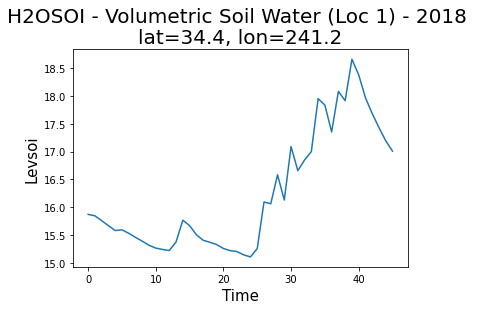

In [225]:
#Plotting the H2OSOI variable DataFrame (Loc 1) using line plot function
df_loc_1_H2OSOI_f3_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2018 \nlat=34.4, lon=241.2",size=20)

In [226]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 2)
data_2_f3 = xr.merge((loc_2_H2OSOI_f3,loc_2_DZSOI_f3,loc_2_ZSOI_f3), compat='override')
data_2_f3

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [227]:
data_2_mul_50_f3 = data_2_f3 * 50
data_2_mul_50_f3

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 12.62 12.79 12.68 ... 14.7 18.94 0.002193
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [228]:
#Creating a DataFrame for the variable H2OSOI (Loc 2)
df_loc_2_H2OSOI_f3 = pd.DataFrame(data_2_mul_50_f3.H2OSOI)
df_loc_2_H2OSOI_f3

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,12.622107,12.793205,12.676033,13.609207,14.182273,14.393425,14.200264,13.980908,13.861038,13.052601,12.925178,12.827939,12.777528,12.776720,12.848038,13.061386,13.557021,14.686988,18.941359,0.002193
1,13.962814,12.184499,12.485469,13.653975,14.211673,14.373130,14.173640,13.966899,13.859638,13.058691,12.934550,12.836475,12.782947,12.779657,12.849977,13.062675,13.557596,14.686964,18.942114,0.002193
2,13.427316,12.390483,12.605696,13.744945,14.258705,14.366720,14.139239,13.940461,13.853565,13.067810,12.951209,12.852940,12.793968,12.785716,12.853858,13.065216,13.558732,14.686981,18.942112,0.002193
3,13.780679,12.558466,12.654970,13.783838,14.293022,14.384735,14.130275,13.922403,13.845834,13.073408,12.965237,12.868741,12.805470,12.792233,12.857874,13.067785,13.559882,14.687066,18.942169,0.002193
4,15.131533,12.974165,13.175700,14.127389,14.479606,14.459729,14.144715,13.915226,13.840096,13.076927,12.976781,12.883589,12.817266,12.799189,12.862043,13.070388,13.561052,14.687191,18.942312,0.002193
5,14.862310,13.290884,13.539179,14.543089,14.851262,14.693666,14.236720,13.934001,13.840875,13.080150,12.986319,12.897308,12.829169,12.806556,12.866385,13.073033,13.562240,14.687337,18.942108,0.002193
6,17.347588,14.206463,13.134442,13.914800,14.609332,14.736187,14.353591,13.993790,13.858047,13.086171,12.994738,12.909887,12.841010,12.814286,12.870914,13.075728,13.563448,14.687488,18.942087,0.002193
7,16.982851,15.156716,14.412748,13.465685,14.222969,14.502272,14.304608,14.026053,13.885864,13.097927,13.003452,12.921535,12.852664,12.822330,12.875637,13.078483,13.564677,14.687653,18.942137,0.002193
8,16.605820,15.824599,15.465877,13.258335,14.010371,14.316400,14.196244,14.003757,13.900858,13.112290,13.013384,12.932652,12.864073,12.830627,12.880559,13.081302,13.565932,14.687829,18.942225,0.002193
9,18.066196,16.216410,16.181126,13.146710,13.876478,14.183469,14.094165,13.957026,13.896971,13.123460,13.023914,12.943542,12.875250,12.839128,12.885681,13.084192,13.567211,14.688013,18.942240,0.002193


In [229]:
df_loc_2_H2OSOI_f3_5 = df_loc_2_H2OSOI_f3.iloc[:,:5]
df_loc_2_H2OSOI_f3_5

,0,1,2,3,4
0,12.622107,12.793205,12.676033,13.609207,14.182273
1,13.962814,12.184499,12.485469,13.653975,14.211673
2,13.427316,12.390483,12.605696,13.744945,14.258705
3,13.780679,12.558466,12.654970,13.783838,14.293022
4,15.131533,12.974165,13.175700,14.127389,14.479606
5,14.862310,13.290884,13.539179,14.543089,14.851262
6,17.347588,14.206463,13.134442,13.914800,14.609332
7,16.982851,15.156716,14.412748,13.465685,14.222969
8,16.605820,15.824599,15.465877,13.258335,14.010371
9,18.066196,16.216410,16.181126,13.146710,13.876478


In [230]:
df_loc_2_H2OSOI_f3_5_mean = df_loc_2_H2OSOI_f3_5.mean(axis = 1, skipna = True)
df_loc_2_H2OSOI_f3_5_mean

0     13.176565
1     13.299685
2     13.285428
3     13.414195
4     13.977678
5     14.217346
6     14.642525
7     14.848193
8     15.033000
9     15.497385
10    15.704175
11    15.978943
12    15.975408
13    16.102884
14    16.252163
15    16.413200
16    16.523817
17    16.573084
18    16.628672
19    16.659706
20    16.657881
21    16.648792
22    16.630337
23    16.565372
24    16.489475
25    16.220293
26    16.181046
27    16.579855
28    18.867039
29    19.725908
30    20.697386
31    20.644760
32    20.399984
33    20.136547
34    20.474237
35    20.970673
36    20.650057
37    20.082975
38    19.713099
39    19.595493
40    20.398752
41    20.597265
42    20.483963
43    20.299839
44    20.070759
45    19.894928
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 2) - 2018 \nlat=40.99, lon=243.8')

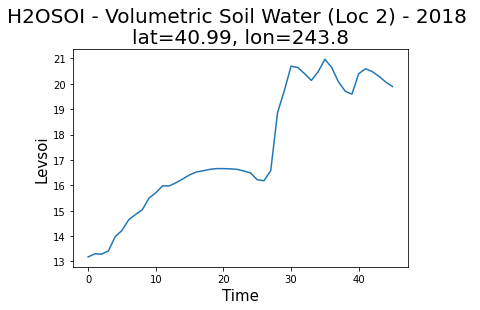

In [231]:
#Plotting the H2OSOI variable DataFrame (Loc 2) using line plot function
df_loc_2_H2OSOI_f3_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 2) - 2018 \nlat=40.99, lon=243.8",size=20)

In [232]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 3)
data_3_f3 = xr.merge((loc_3_H2OSOI_f3,loc_3_DZSOI_f3,loc_3_ZSOI_f3), compat='override')
data_3_f3

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [233]:
data_3_mul_50_f3 = data_3_f3 * 50
data_3_mul_50_f3

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 14.33 14.41 14.46 15.3 ... 16.12 17.39 20.64
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [234]:
#Creating a DataFrame for the variable H2OSOI (Loc 3)
df_loc_3_H2OSOI_f3 = pd.DataFrame(data_3_mul_50_f3.H2OSOI)
df_loc_3_H2OSOI_f3

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,14.326019,14.411452,14.460899,15.295294,15.393949,15.452993,16.535295,16.230276,16.148577,14.158511,13.962291,13.793942,14.447408,14.499084,14.655998,14.938474,15.385962,16.101269,17.382217,20.642317
1,14.501020,14.269776,14.398355,15.338630,15.454022,15.452242,16.523451,16.234003,16.160568,14.168265,13.971928,13.802261,14.453279,14.502247,14.657458,14.938951,15.385960,16.101166,17.382120,20.642982
2,15.554750,14.325540,14.270535,15.302211,15.480691,15.474126,16.530218,16.242290,16.178440,14.187627,13.990705,13.818416,14.465012,14.508675,14.660427,14.939937,15.385990,16.100975,17.381964,20.643093
3,14.943424,13.931695,14.183593,15.218798,15.410879,15.442671,16.524021,16.250490,16.193100,14.206487,14.009300,13.834407,14.477036,14.515440,14.663562,14.941007,15.386068,16.100807,17.381842,20.642948
4,13.876504,13.972682,14.176983,15.181648,15.362112,15.406278,16.502813,16.248283,16.202841,14.224167,14.027582,13.850267,14.489299,14.522531,14.666875,14.942162,15.386198,16.100666,17.381746,20.643074
5,15.827277,14.658616,14.656870,15.499955,15.523197,15.445635,16.501574,16.243397,16.206966,14.239738,14.045280,13.865987,14.501762,14.529930,14.670372,14.943409,15.386379,16.100550,17.381666,20.642878
6,16.725016,15.087748,14.282107,15.352450,15.555692,15.531187,16.563017,16.264481,16.214809,14.253536,14.062113,13.881501,14.514385,14.537622,14.674059,14.944750,15.386610,16.100458,17.381601,20.642963
7,16.428913,15.660192,14.160202,15.201614,15.421386,15.473683,16.561226,16.285292,16.231787,14.268070,14.078238,13.896749,14.527124,14.545589,14.677938,14.946190,15.386894,16.100395,17.381550,20.642946
8,16.182291,14.709839,14.190777,15.208165,15.389594,15.434144,16.534182,16.283619,16.243883,14.283320,14.094080,13.911736,14.539936,14.553812,14.682013,14.947733,15.387233,16.100359,17.381506,20.642836
9,16.154903,14.938077,14.055684,15.116935,15.343685,15.408646,16.515085,16.276009,16.248184,14.297211,14.109614,13.926498,14.552794,14.562270,14.686285,14.949385,15.387626,16.100349,17.381472,20.642931


In [235]:
df_loc_3_H2OSOI_f3_5 = df_loc_3_H2OSOI_f3.iloc[:,:5]
df_loc_3_H2OSOI_f3_5

,0,1,2,3,4
0,14.326019,14.411452,14.460899,15.295294,15.393949
1,14.501020,14.269776,14.398355,15.338630,15.454022
2,15.554750,14.325540,14.270535,15.302211,15.480691
3,14.943424,13.931695,14.183593,15.218798,15.410879
4,13.876504,13.972682,14.176983,15.181648,15.362112
5,15.827277,14.658616,14.656870,15.499955,15.523197
6,16.725016,15.087748,14.282107,15.352450,15.555692
7,16.428913,15.660192,14.160202,15.201614,15.421386
8,16.182291,14.709839,14.190777,15.208165,15.389594
9,16.154903,14.938077,14.055684,15.116935,15.343685


In [236]:
df_loc_3_H2OSOI_f3_5_mean = df_loc_3_H2OSOI_f3_5.mean(axis = 1, skipna = True)
df_loc_3_H2OSOI_f3_5_mean

0     14.777524
1     14.792361
2     14.986746
3     14.737679
4     14.513987
5     15.233182
6     15.400602
7     15.374461
8     15.136133
9     15.121857
10    14.936358
11    15.778666
12    16.039625
13    16.149462
14    16.384331
15    16.619936
16    16.782455
17    16.917768
18    17.102467
19    17.155005
20    17.106657
21    17.029169
22    16.791159
23    16.616314
24    17.116465
25    19.516781
26    19.305756
27    18.828842
28    18.937923
29    18.300999
30    17.627975
31    17.090014
32    17.338924
33    16.656210
34    16.261772
35    16.436935
36    16.376680
37    16.354841
38    16.077168
39    16.688765
40    17.347073
41    16.663443
42    16.471043
43    16.836636
44    16.873426
45    17.369503
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 3) - 2018 \nlat=40.99, lon=242.5')

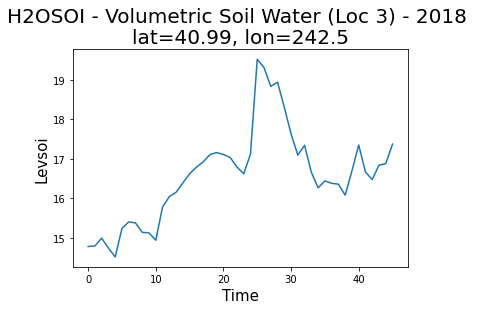

In [237]:
#Plotting the H2OSOI variable DataFrame (Loc 3) using line plot function
df_loc_3_H2OSOI_f3_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 3) - 2018 \nlat=40.99, lon=242.5",size=20)

In [238]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 4)
data_4_f3 = xr.merge((loc_4_H2OSOI_f3,loc_4_DZSOI_f3,loc_4_ZSOI_f3), compat='override')
data_4_f3

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [239]:
data_4_mul_50_f3 = data_4_f3 * 50
data_4_mul_50_f3

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2018-01-22 00:00:00 ... 2018-03-08 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 15.96 16.34 16.75 ... 21.99 21.99 21.99
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [240]:
#Creating a DataFrame for the variable H2OSOI (Loc 4)
df_loc_4_H2OSOI_f3 = pd.DataFrame(data_4_mul_50_f3.H2OSOI)
df_loc_4_H2OSOI_f3

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,15.955170,16.335037,16.754669,17.376726,18.156538,18.434132,18.478924,18.275265,18.810211,18.184362,19.522360,21.853733,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
1,15.734871,16.164135,16.639030,17.302980,18.110001,18.401262,18.447508,18.239027,18.766172,18.124163,19.395607,21.842747,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
2,15.636873,16.070213,16.551607,17.223196,18.038355,18.333855,18.380764,18.166983,18.681808,18.014135,19.197813,21.769909,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
3,15.526024,15.969223,16.461199,17.142172,17.966013,18.265963,18.314213,18.097502,18.603973,17.916992,19.024887,21.658894,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
4,15.400232,15.852171,16.356125,17.049660,17.885752,18.194145,18.246979,18.029959,18.529453,17.824421,18.869251,21.524050,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
5,15.280482,15.739600,16.253391,16.957640,17.804819,18.121256,18.179325,17.963808,18.458992,17.743206,18.752325,21.338882,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
6,15.172640,15.636719,16.157808,16.870705,17.727480,18.051079,18.114443,17.902174,18.396740,17.677658,18.664030,21.103413,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
7,15.122663,15.573595,16.084620,16.795855,17.657154,17.985600,18.053780,17.845041,18.338928,17.614223,18.575195,20.857351,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
8,15.148842,15.576330,16.059534,16.752558,17.606558,17.930954,17.999302,17.791838,18.284681,17.556433,18.501175,20.586973,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993
9,15.111446,15.538995,16.019524,16.710012,17.563480,17.885506,17.952330,17.743546,18.233212,17.495670,18.408768,20.331877,21.993000,21.993000,21.993,21.993,21.993,21.993,21.993,21.993


In [241]:
df_loc_4_H2OSOI_f3_5 = df_loc_4_H2OSOI_f3.iloc[:,:5]
df_loc_4_H2OSOI_f3_5

,0,1,2,3,4
0,15.955170,16.335037,16.754669,17.376726,18.156538
1,15.734871,16.164135,16.639030,17.302980,18.110001
2,15.636873,16.070213,16.551607,17.223196,18.038355
3,15.526024,15.969223,16.461199,17.142172,17.966013
4,15.400232,15.852171,16.356125,17.049660,17.885752
5,15.280482,15.739600,16.253391,16.957640,17.804819
6,15.172640,15.636719,16.157808,16.870705,17.727480
7,15.122663,15.573595,16.084620,16.795855,17.657154
8,15.148842,15.576330,16.059534,16.752558,17.606558
9,15.111446,15.538995,16.019524,16.710012,17.563480


In [242]:
df_loc_4_H2OSOI_f3_5_mean = df_loc_4_H2OSOI_f3_5.mean(axis = 1, skipna = True)
df_loc_4_H2OSOI_f3_5_mean

0     16.915628
1     16.790203
2     16.704048
3     16.612926
4     16.508787
5     16.407187
6     16.313070
7     16.246777
8     16.228764
9     16.188690
10    16.156612
11    16.154318
12    16.295073
13    16.279745
14    16.213068
15    16.223888
16    16.438450
17    17.702322
18    19.166945
19    19.596773
20    19.362680
21    19.107597
22    18.488224
23    17.959684
24    17.695797
25    17.376282
26    17.280153
27    17.346977
28    16.941231
29    16.692568
30    16.471672
31    16.353867
32    16.310488
33    16.273050
34    16.277390
35    16.239285
36    16.222324
37    16.145958
38    16.071774
39    16.009327
40    15.962868
41    15.909948
42    15.852010
43    15.795134
44    15.761696
45    15.757380
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 4) - 2018 \nlat=11.78, lon=80.0')

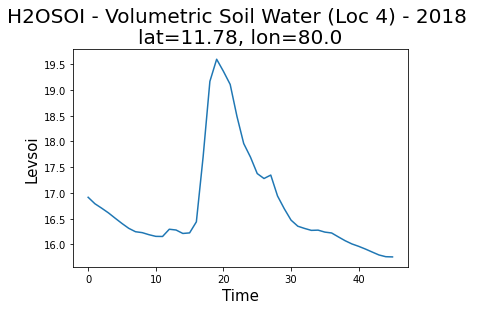

In [243]:
#Plotting the H2OSOI variable DataFrame (Loc 4) using line plot function
df_loc_4_H2OSOI_f3_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 4) - 2018 \nlat=11.78, lon=80.0",size=20)

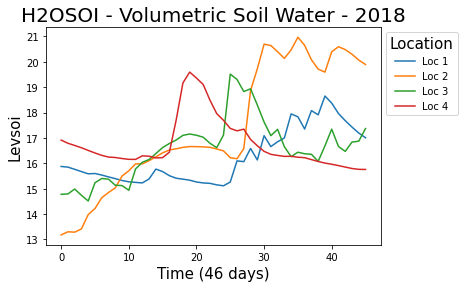

In [244]:
#Plotting the H2OSOI variable DataFrame for all locations using line plot function
df_loc_1_H2OSOI_f3_5_mean.plot(kind='line', label = 'Loc 1')
df_loc_2_H2OSOI_f3_5_mean.plot(kind='line', label = 'Loc 2')
df_loc_3_H2OSOI_f3_5_mean.plot(kind='line', label = 'Loc 3')
df_loc_4_H2OSOI_f3_5_mean.plot(kind='line', label = 'Loc 4')
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2018",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

In [245]:
ds_f4 = xr.open_dataset("cesm2cam6v2.2019-01-21.09.clm2.h0.2019-01-21-00000.nc", engine="netcdf4")

In [246]:
ds_f4

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, hist_interval: 2, lon: 288, lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi
Data variables: (12/56)
    mcdate          (time) int32 ...
    mcsec           (time) int32 ...
    mdcur           (time) int32 ...
    mscur           (time) int32 ...
    nstep           (time) int32 ...
    time_bounds     (time, hist_interval) object ...
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 ...
    SOILWATER_10CM  (time, lat, lon) float32 ...
    TLAI            (time, lat, lon) float32 ...
    TOTECOSYSC      (time, lat, lon) float32 ...
    TOTVEGC         (time, lat, lon) float32 ...
    TWS             (time, lat, lon) float32 ...
Attributes: (12/100)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 10/04/20 10:16:55
    source:                                    Community Land Model CLM4.0
    hostname:                                  cheyenne
    ...                                        ...
    cft_irrigated_switchgrass:                 60
    cft_tropical_corn:                         61
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          day_1

In [247]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

loc_1_H2OSOI_f4=ds_f4.H2OSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_DZSOI_f4=ds_f4.DZSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_ZSOI_f4 = ds_f4.ZSOI.sel(lat=34.0522, lon=241.75, method='nearest')

#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

loc_2_H2OSOI_f4=ds_f4.H2OSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_DZSOI_f4=ds_f4.DZSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_ZSOI_f4 = ds_f4.ZSOI.sel(lat=41.02, lon=244.05, method='nearest')

#Boston Location - Latitude & Longitude co-ordinates
# identified Location is Near to Boston

loc_3_H2OSOI_f4=ds_f4.H2OSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_DZSOI_f4=ds_f4.DZSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_ZSOI_f4 = ds_f4.ZSOI.sel(lat=41.08, lon=243.05, method='nearest')

#Villupuram - Latitude & Longitude co-ordinates
# identified Location is around VPM

loc_4_H2OSOI_f4=ds_f4.H2OSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_DZSOI_f4=ds_f4.DZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_ZSOI_f4 = ds_f4.ZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')

In [248]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 1)
data_1_f4 = xr.merge((loc_1_H2OSOI_f4,loc_1_DZSOI_f4,loc_1_ZSOI_f4), compat='override')
data_1_f4

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [249]:
dataa_1_mul_50_f4 = data_1_f4 * 50
dataa_1_mul_50_f4

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 17.42 16.85 17.25 ... 16.11 16.57 17.17
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [250]:
#Creating a DataFrame for the variable H2OSOI (Loc 1)
df_loc_1_H2OSOI_f4 = pd.DataFrame(dataa_1_mul_50_f4.H2OSOI)
df_loc_1_H2OSOI_f4

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,17.419043,16.847794,17.249830,17.815691,18.087799,18.094591,17.720470,16.990482,15.362179,12.603572,12.831802,13.141333,14.611499,14.859730,15.133598,15.432112,15.762608,16.142345,16.604250,17.217793
1,17.273201,16.714802,17.120275,17.685215,17.955299,17.962790,17.612236,16.950268,15.606603,12.648815,12.837646,13.142440,14.611512,14.859417,15.133199,15.431705,15.762210,16.141951,16.603821,17.217266
2,16.897879,16.372456,16.808416,17.403131,17.700581,17.732510,17.428585,16.877415,15.963433,12.757977,12.850677,13.145086,14.611734,14.858855,15.132432,15.430909,15.761432,16.141174,16.602980,17.216232
3,16.533443,16.041821,16.510603,17.138275,17.467501,17.529873,17.273306,16.816833,16.173037,12.889271,12.866880,13.148332,14.612251,14.858391,15.131685,15.430120,15.760657,16.140398,16.602139,17.215197
4,16.249371,15.775016,16.260389,16.908182,17.259975,17.348381,17.135826,16.759016,16.282352,13.029472,12.887438,13.152048,14.613056,14.858033,15.130970,15.429338,15.759882,16.139624,16.601297,17.214159
5,15.964608,15.521031,16.033360,16.705927,17.080778,17.191498,17.014526,16.699047,16.328560,13.167074,12.913147,13.156207,14.614124,14.857791,15.130292,15.428565,15.759110,16.138849,16.600456,17.213120
6,15.725316,15.300040,15.830043,16.521965,16.917145,17.049311,16.904037,16.636272,16.337000,13.294304,12.944177,13.160892,14.615419,14.857666,15.129656,15.427804,15.758343,16.138073,16.599611,17.212076
7,15.498745,15.092568,15.640526,16.351336,16.765919,16.917934,16.800497,16.570932,16.323305,13.406925,12.980120,13.166261,14.616903,14.857653,15.129064,15.427056,15.757577,16.137299,16.598768,17.211033
8,15.293879,14.903064,15.465364,16.192213,16.624136,16.794491,16.702003,16.504072,16.296749,13.503325,13.020132,13.172491,14.618561,14.857747,15.128519,15.426324,15.756816,16.136526,16.597925,17.209988
9,15.103473,14.727015,15.302923,16.044525,16.492037,16.678522,16.607958,16.436802,16.262783,13.583617,13.063116,13.179733,14.620386,14.857939,15.128022,15.425612,15.756061,16.135752,16.597080,17.208941


In [251]:
df_loc_1_H2OSOI_f4_5 = df_loc_1_H2OSOI_f4.iloc[:,:5]  
df_loc_1_H2OSOI_f4_5

,0,1,2,3,4
0,17.419043,16.847794,17.249830,17.815691,18.087799
1,17.273201,16.714802,17.120275,17.685215,17.955299
2,16.897879,16.372456,16.808416,17.403131,17.700581
3,16.533443,16.041821,16.510603,17.138275,17.467501
4,16.249371,15.775016,16.260389,16.908182,17.259975
5,15.964608,15.521031,16.033360,16.705927,17.080778
6,15.725316,15.300040,15.830043,16.521965,16.917145
7,15.498745,15.092568,15.640526,16.351336,16.765919
8,15.293879,14.903064,15.465364,16.192213,16.624136
9,15.103473,14.727015,15.302923,16.044525,16.492037


In [252]:
df_loc_1_H2OSOI_f4_5_mean = df_loc_1_H2OSOI_f4_5.mean(axis = 1, skipna = True)
df_loc_1_H2OSOI_f4_5_mean

0     17.484032
1     17.349758
2     17.036493
3     16.738329
4     16.490585
5     16.261141
6     16.058903
7     15.869818
8     15.695730
9     15.533995
10    15.478518
11    15.364812
12    15.191633
13    15.037506
14    14.882059
15    14.777435
16    14.756976
17    15.204306
18    15.359317
19    15.233126
20    15.216352
21    15.486300
22    16.789204
23    16.736446
24    16.223701
25    15.878286
26    15.592371
27    15.388807
28    15.792944
29    18.669476
30    18.787716
31    18.049541
32    17.455471
33    17.074842
34    16.800760
35    16.548239
36    16.295244
37    16.081272
38    15.907608
39    15.743219
40    15.597361
41    15.390882
42    15.189944
43    15.009130
44    14.871122
45    14.690208
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2019 \nlat=34.4, lon=241.2')

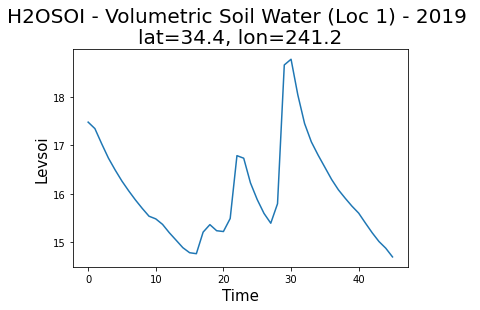

In [253]:
#Plotting the H2OSOI variable DataFrame (Loc 1) using line plot function
df_loc_1_H2OSOI_f4_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2019 \nlat=34.4, lon=241.2",size=20)

In [254]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 2)
data_2_f4 = xr.merge((loc_2_H2OSOI_f4,loc_2_DZSOI_f4,loc_2_ZSOI_f4), compat='override')
data_2_f4

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [255]:
data_2_mul_50_f4 = data_2_f4 * 50
data_2_mul_50_f4

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 10.23 10.47 11.0 ... 14.68 18.94 0.001754
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [256]:
#Creating a DataFrame for the variable H2OSOI (Loc 2)
df_loc_2_H2OSOI_f4 = pd.DataFrame(data_2_mul_50_f4.H2OSOI)
df_loc_2_H2OSOI_f4

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,10.230453,10.465121,11.003016,12.235135,12.826414,12.987929,12.758094,12.626417,12.677796,12.124940,12.186774,12.249615,12.325424,12.439490,12.630812,12.950562,13.515398,14.681389,18.942991,0.001754
1,10.217319,10.460501,10.999888,12.232129,12.823616,12.985025,12.755470,12.624367,12.676208,12.123849,12.186280,12.249691,12.325799,12.439809,12.630810,12.950333,13.515203,14.681255,18.942162,0.001754
2,10.205471,10.450377,10.991980,12.225364,12.817674,12.979449,12.750441,12.620391,12.673097,12.121691,12.185257,12.249776,12.326484,12.440417,12.630822,12.949903,13.514829,14.681058,18.942106,0.001754
3,10.196834,10.441912,10.984266,12.218272,12.811305,12.973804,12.745516,12.616475,12.669997,12.119503,12.184159,12.249767,12.327099,12.441001,12.630853,12.949504,13.514469,14.680922,18.942179,0.001754
4,10.189018,10.434155,10.976958,12.211342,12.804892,12.968085,12.740628,12.612608,12.666911,12.117290,12.182994,12.249672,12.327643,12.441559,12.630898,12.949131,13.514129,14.680822,18.942148,0.001754
5,10.181640,10.426805,10.969952,12.204614,12.798566,12.962373,12.735759,12.608771,12.663839,12.115055,12.181765,12.249491,12.328119,12.442090,12.630959,12.948784,13.513803,14.680745,18.942116,0.001754
6,10.174578,10.419754,10.963190,12.198078,12.792365,12.956717,12.730913,12.604955,12.660781,12.112801,12.180476,12.249229,12.328528,12.442592,12.631030,12.948462,13.513498,14.680682,18.942215,0.001754
7,10.167749,10.412927,10.956621,12.191706,12.786288,12.951133,12.726097,12.601155,12.657732,12.110530,12.179134,12.248893,12.328871,12.443064,12.631112,12.948164,13.513209,14.680634,18.942188,0.001754
8,10.161122,10.406301,10.950234,12.185495,12.780341,12.945636,12.721324,12.597372,12.654689,12.108244,12.177742,12.248482,12.329147,12.443506,12.631202,12.947890,13.512937,14.680582,18.942081,0.001754
9,10.154682,10.399856,10.944014,12.179436,12.774521,12.940231,12.716599,12.593605,12.651653,12.105944,12.176302,12.248003,12.329362,12.443918,12.631299,12.947637,13.512680,14.680539,18.942223,0.001754


In [257]:
df_loc_2_H2OSOI_f4_5 = df_loc_2_H2OSOI_f4.iloc[:,:5]
df_loc_2_H2OSOI_f4_5

,0,1,2,3,4
0,10.230453,10.465121,11.003016,12.235135,12.826414
1,10.217319,10.460501,10.999888,12.232129,12.823616
2,10.205471,10.450377,10.991980,12.225364,12.817674
3,10.196834,10.441912,10.984266,12.218272,12.811305
4,10.189018,10.434155,10.976958,12.211342,12.804892
5,10.181640,10.426805,10.969952,12.204614,12.798566
6,10.174578,10.419754,10.963190,12.198078,12.792365
7,10.167749,10.412927,10.956621,12.191706,12.786288
8,10.161122,10.406301,10.950234,12.185495,12.780341
9,10.154682,10.399856,10.944014,12.179436,12.774521


In [258]:
df_loc_2_H2OSOI_f4_5_mean = df_loc_2_H2OSOI_f4_5.mean(axis = 1, skipna = True)
df_loc_2_H2OSOI_f4_5_mean

0     11.352028
1     11.346690
2     11.338173
3     11.330518
4     11.323273
5     11.316315
6     11.309593
7     11.303059
8     11.296700
9     11.290502
10    11.589148
11    12.681188
12    12.641576
13    12.709657
14    14.263268
15    14.485548
16    14.695819
17    15.499418
18    15.080078
19    14.773979
20    15.226616
21    15.792768
22    15.577379
23    15.373907
24    15.263939
25    15.323202
26    15.450711
27    15.324511
28    15.635737
29    16.027830
30    16.170687
31    16.304148
32    15.508490
33    15.039477
34    15.071938
35    15.029089
36    15.142633
37    14.827597
38    14.784747
39    14.716040
40    14.656023
41    14.372900
42    14.237978
43    14.790754
44    15.488501
45    14.778743
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 2) - 2019 \nlat=40.99, lon=243.8')

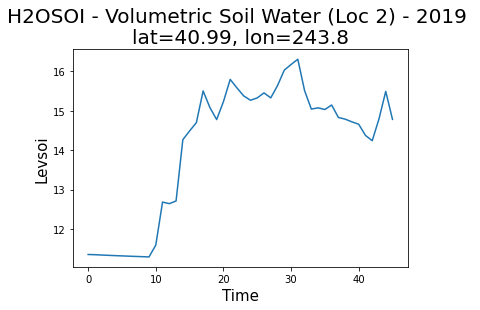

In [259]:
#Plotting the H2OSOI variable DataFrame (Loc 2) using line plot function
df_loc_2_H2OSOI_f4_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 2) - 2019 \nlat=40.99, lon=243.8",size=20)

In [260]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 3)
data_3_f4 = xr.merge((loc_3_H2OSOI_f4,loc_3_DZSOI_f4,loc_3_ZSOI_f4), compat='override')
data_3_f4

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [261]:
data_3_mul_50_f4 = data_3_f4 * 50
data_3_mul_50_f4

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 17.25 16.63 15.4 15.19 ... 16.07 17.37 20.63
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [262]:
#Creating a DataFrame for the variable H2OSOI (Loc 3)
df_loc_3_H2OSOI_f4 = pd.DataFrame(data_3_mul_50_f4.H2OSOI)
df_loc_3_H2OSOI_f4

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,17.248737,16.626637,15.404448,15.191939,14.718286,14.464426,15.382963,15.080406,15.044579,13.233903,13.210386,13.231139,14.003817,14.193188,14.470153,14.837872,15.336488,16.080341,17.376448,20.641434
1,15.402347,15.366340,15.296738,15.921278,15.481779,14.803365,15.495472,15.105154,15.052824,13.237757,13.213912,13.234241,14.005942,14.193857,14.469796,14.837165,15.335868,16.079981,17.376278,20.640285
2,16.635204,14.180873,14.393011,15.408889,15.478657,15.132067,15.805208,15.226248,15.086749,13.246849,13.220894,13.240234,14.010103,14.195235,14.469165,14.835821,15.334673,16.079281,17.375984,20.640234
3,16.402632,13.957024,14.101939,15.105896,15.235266,15.086405,15.917337,15.365770,15.154852,13.261311,13.228379,13.246147,14.014252,14.196706,14.468628,14.834534,15.333507,16.078590,17.375715,20.640196
4,13.895702,13.929179,14.115969,15.070328,15.159060,15.040816,15.934939,15.450120,15.234459,13.283411,13.237150,13.252083,14.018395,14.198261,14.468185,14.833305,15.332368,16.077913,17.375469,20.640223
5,14.220217,13.560126,13.840954,14.888528,15.069898,15.013273,15.944736,15.500916,15.305246,13.311823,13.247893,13.258211,14.022554,14.199898,14.467834,14.832134,15.331261,16.077250,17.375237,20.639887
6,14.034453,13.474710,13.739145,14.773944,14.963627,14.954493,15.931482,15.531797,15.362101,13.343845,13.260900,13.264722,14.026764,14.201612,14.467570,14.831024,15.330182,16.076597,17.375017,20.639879
7,13.870914,13.377464,13.650235,14.691819,14.892186,14.905585,15.908895,15.546354,15.403912,13.376811,13.276064,13.271779,14.031075,14.203403,14.467393,14.829971,15.329134,16.075962,17.374804,20.639912
8,13.544938,13.330489,13.593714,14.630786,14.833662,14.862904,15.885017,15.551485,15.432602,13.408542,13.292986,13.279501,14.035541,14.205278,14.467299,14.828977,15.328118,16.075338,17.374596,20.639545
9,13.274078,13.350797,13.564064,14.589052,14.790170,14.827803,15.862149,15.551048,15.451331,13.437664,13.311102,13.287931,14.040218,14.207246,14.467287,14.828040,15.327133,16.074730,17.374397,20.639606


In [263]:
df_loc_3_H2OSOI_f4_5 = df_loc_3_H2OSOI_f4.iloc[:,:5]
df_loc_3_H2OSOI_f4_5

,0,1,2,3,4
0,17.248737,16.626637,15.404448,15.191939,14.718286
1,15.402347,15.366340,15.296738,15.921278,15.481779
2,16.635204,14.180873,14.393011,15.408889,15.478657
3,16.402632,13.957024,14.101939,15.105896,15.235266
4,13.895702,13.929179,14.115969,15.070328,15.159060
5,14.220217,13.560126,13.840954,14.888528,15.069898
6,14.034453,13.474710,13.739145,14.773944,14.963627
7,13.870914,13.377464,13.650235,14.691819,14.892186
8,13.544938,13.330489,13.593714,14.630786,14.833662
9,13.274078,13.350797,13.564064,14.589052,14.790170


In [264]:
df_loc_3_H2OSOI_f4_5_mean = df_loc_3_H2OSOI_f4_5.mean(axis = 1, skipna = True)
df_loc_3_H2OSOI_f4_5_mean

0     15.838010
1     15.493696
2     15.219327
3     14.960551
4     14.434047
5     14.315944
6     14.197176
7     14.096524
8     13.986717
9     13.913632
10    15.429190
11    15.969495
12    16.101299
13    16.284435
14    17.229706
15    17.312187
16    17.827131
17    17.191944
18    16.645618
19    16.290688
20    16.564911
21    16.835703
22    16.252316
23    16.065804
24    15.884189
25    15.678248
26    15.504684
27    15.321665
28    15.431967
29    15.432550
30    15.343707
31    15.990797
32    16.012148
33    15.782160
34    16.035055
35    15.995962
36    15.976260
37    15.952971
38    16.061182
39    15.907248
40    15.777478
41    15.554838
42    15.438667
43    15.791934
44    16.456381
45    15.931738
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 3) - 2019 \nlat=40.99, lon=242.5')

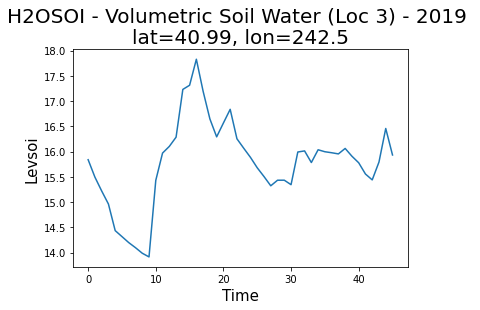

In [265]:
#Plotting the H2OSOI variable DataFrame (Loc 3) using line plot function
df_loc_3_H2OSOI_f4_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 3) - 2019 \nlat=40.99, lon=242.5",size=20)

In [266]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 4)
data_4_f4 = xr.merge((loc_4_H2OSOI_f4,loc_4_DZSOI_f4,loc_4_ZSOI_f4), compat='override')
data_4_f4

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [267]:
data_4_mul_50_f4 = data_4_f4 * 50
data_4_mul_50_f4

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2019-01-21 00:00:00 ... 2019-03-07 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 14.04 14.53 15.04 ... 20.42 21.99 21.99
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [268]:
#Creating a DataFrame for the variable H2OSOI (Loc 4)
df_loc_4_H2OSOI_f4 = pd.DataFrame(data_4_mul_50_f4.H2OSOI)
df_loc_4_H2OSOI_f4

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,14.044597,14.532496,15.044397,15.751502,16.637346,16.956219,17.016298,16.772860,17.192183,16.324707,16.944448,18.051933,19.388975,19.495804,19.587177,19.696514,19.908844,20.595554,21.993,21.993
1,13.842225,14.356990,14.913339,15.662691,16.579275,16.914354,16.980175,16.739275,17.159540,16.292313,16.906496,17.977468,19.371532,19.488081,19.581099,19.692850,19.909157,20.602314,21.993,21.993
2,13.773641,14.284070,14.838963,15.589979,16.510664,16.847593,16.915440,16.676744,17.097406,16.229652,16.831259,17.837145,19.334663,19.473215,19.569353,19.685728,19.909609,20.614710,21.993,21.993
3,13.725224,14.223927,14.772849,15.523490,16.446955,16.784534,16.853174,16.615423,17.035769,16.166882,16.755476,17.699074,19.297432,19.458529,19.557734,19.678646,19.909798,20.625849,21.993,21.993
4,14.312698,14.609502,14.981601,15.614759,16.467861,16.757010,16.804462,16.558800,16.976048,16.104391,16.679058,17.563929,19.260845,19.444141,19.546320,19.671648,19.909754,20.635782,21.993,21.993
5,14.227836,14.642821,15.078874,15.719803,16.550400,16.792789,16.796284,16.519678,16.923973,16.044361,16.603430,17.432095,19.225512,19.430225,19.535213,19.664795,19.909513,20.644573,21.993,21.993
6,13.929770,14.403389,14.916251,15.623892,16.500975,16.772369,16.778139,16.487152,16.878857,15.987237,16.528940,17.305588,19.190115,19.416580,19.524311,19.658037,19.909056,20.652243,21.993,21.993
7,13.876944,14.343418,14.846208,15.552828,16.438311,16.723660,16.738319,16.446358,16.832443,15.932457,16.462664,17.213751,19.121227,19.403114,19.513563,19.651348,19.908375,20.658825,21.993,21.993
8,13.807395,14.277453,14.781014,15.489978,16.381029,16.672779,16.692629,16.401054,16.784754,15.882447,16.408169,17.143110,19.022530,19.389816,19.502968,19.644733,19.907482,20.664360,21.993,21.993
9,13.735846,14.210617,14.715166,15.426208,16.322329,16.619244,16.643759,16.353994,16.737280,15.835413,16.358036,17.080364,18.910698,19.376665,19.492514,19.638186,19.906378,20.668888,21.993,21.993


In [269]:
df_loc_4_H2OSOI_f4_5 = df_loc_4_H2OSOI_f4.iloc[:,:5]
df_loc_4_H2OSOI_f4_5

,0,1,2,3,4
0,14.044597,14.532496,15.044397,15.751502,16.637346
1,13.842225,14.356990,14.913339,15.662691,16.579275
2,13.773641,14.284070,14.838963,15.589979,16.510664
3,13.725224,14.223927,14.772849,15.523490,16.446955
4,14.312698,14.609502,14.981601,15.614759,16.467861
5,14.227836,14.642821,15.078874,15.719803,16.550400
6,13.929770,14.403389,14.916251,15.623892,16.500975
7,13.876944,14.343418,14.846208,15.552828,16.438311
8,13.807395,14.277453,14.781014,15.489978,16.381029
9,13.735846,14.210617,14.715166,15.426208,16.322329


In [270]:
df_loc_4_H2OSOI_f4_5_mean = df_loc_4_H2OSOI_f4_5.mean(axis = 1, skipna = True)
df_loc_4_H2OSOI_f4_5_mean

0     15.202067
1     15.070905
2     14.999464
3     14.938489
4     15.197284
5     15.243947
6     15.074855
7     15.011541
8     14.947374
9     14.882032
10    14.847803
11    14.802805
12    14.758097
13    14.701657
14    14.663300
15    14.607313
16    14.555407
17    14.510229
18    14.474846
19    14.422897
20    14.378838
21    14.351221
22    14.292305
23    14.273216
24    14.238199
25    14.183846
26    14.132761
27    14.096558
28    14.102847
29    14.076924
30    14.033834
31    14.017598
32    13.987494
33    13.958751
34    13.946075
35    14.076828
36    13.972104
37    13.909589
38    13.851786
39    13.866094
40    13.864522
41    13.809481
42    13.772751
43    13.723557
44    13.726057
45    13.697253
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 4) - 2019 \nlat=11.78, lon=80.0')

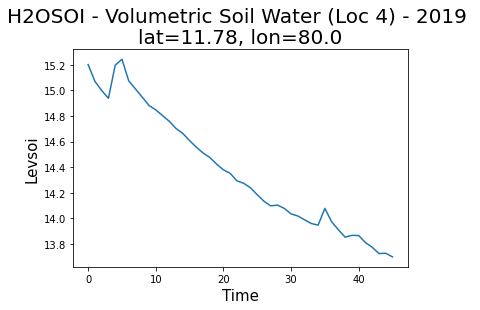

In [271]:
#Plotting the H2OSOI variable DataFrame (Loc 4) using line plot function
df_loc_4_H2OSOI_f4_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 4) - 2019 \nlat=11.78, lon=80.0",size=20)

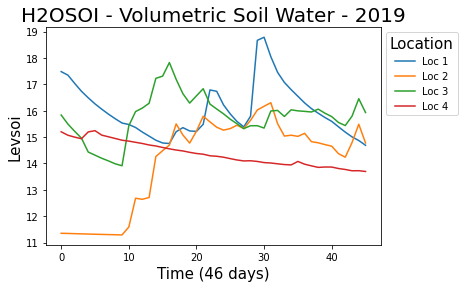

In [272]:
#Plotting the H2OSOI variable DataFrame for all locations using line plot function
df_loc_1_H2OSOI_f4_5_mean.plot(kind='line', label = 'Loc 1')
df_loc_2_H2OSOI_f4_5_mean.plot(kind='line', label = 'Loc 2')
df_loc_3_H2OSOI_f4_5_mean.plot(kind='line', label = 'Loc 3')
df_loc_4_H2OSOI_f4_5_mean.plot(kind='line', label = 'Loc 4')
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2019",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

In [273]:
ds_f5 = xr.open_dataset("cesm2cam6v2.2020-01-27.09.clm2.h0.2020-01-27-00000.nc", engine="netcdf4")

In [274]:
ds_f5

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, hist_interval: 2, lon: 288, lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi
Data variables: (12/56)
    mcdate          (time) int32 ...
    mcsec           (time) int32 ...
    mdcur           (time) int32 ...
    mscur           (time) int32 ...
    nstep           (time) int32 ...
    time_bounds     (time, hist_interval) object ...
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 ...
    SOILWATER_10CM  (time, lat, lon) float32 ...
    TLAI            (time, lat, lon) float32 ...
    TOTECOSYSC      (time, lat, lon) float32 ...
    TOTVEGC         (time, lat, lon) float32 ...
    TWS             (time, lat, lon) float32 ...
Attributes: (12/100)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 03/04/21 02:31:15
    source:                                    Community Land Model CLM4.0
    hostname:                                  cheyenne
    ...                                        ...
    cft_irrigated_switchgrass:                 60
    cft_tropical_corn:                         61
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          day_1

In [275]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

loc_1_H2OSOI_f5=ds_f5.H2OSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_DZSOI_f5=ds_f5.DZSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_ZSOI_f5 = ds_f5.ZSOI.sel(lat=34.0522, lon=241.75, method='nearest')

#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

loc_2_H2OSOI_f5=ds_f5.H2OSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_DZSOI_f5=ds_f5.DZSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_ZSOI_f5 = ds_f5.ZSOI.sel(lat=41.02, lon=244.05, method='nearest')

#Boston Location - Latitude & Longitude co-ordinates
# identified Location is Near to Boston

loc_3_H2OSOI_f5=ds_f5.H2OSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_DZSOI_f5=ds_f5.DZSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_ZSOI_f5 = ds_f5.ZSOI.sel(lat=41.08, lon=243.05, method='nearest')

#Villupuram - Latitude & Longitude co-ordinates
# identified Location is around VPM

loc_4_H2OSOI_f5=ds_f5.H2OSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_DZSOI_f5=ds_f5.DZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_ZSOI_f5 = ds_f5.ZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')

In [276]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 1)
data_1_f5 = xr.merge((loc_1_H2OSOI_f5,loc_1_DZSOI_f5,loc_1_ZSOI_f5), compat='override')
data_1_f5

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [277]:
dataa_1_mul_50_f5 = data_1_f5 * 50
dataa_1_mul_50_f5

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 17.04 16.5 16.94 17.56 ... 16.47 16.96 17.67
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [278]:
#Creating a DataFrame for the variable H2OSOI (Loc 1)
df_loc_1_H2OSOI_f5 = pd.DataFrame(dataa_1_mul_50_f5.H2OSOI)
df_loc_1_H2OSOI_f5

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,17.038355,16.497536,16.941143,17.561275,17.909107,18.057888,17.956425,17.858881,17.858175,15.808333,15.250784,14.324438,15.237972,15.263024,15.472655,15.750478,16.076948,16.470201,16.976931,17.697744
1,17.045574,16.500383,16.929960,17.534389,17.868338,18.008055,17.908024,17.815174,17.820551,15.791780,15.268202,14.372499,15.265812,15.269847,15.473725,15.750301,16.076569,16.469864,16.976652,17.697460
2,16.833742,16.312016,16.763578,17.388763,17.741621,17.896215,17.811213,17.730314,17.747957,15.757532,15.291812,14.457871,15.323116,15.284928,15.476230,15.750052,16.075853,16.469208,16.976107,17.696894
3,16.673256,16.162115,16.622974,17.258299,17.621454,17.785530,17.714359,17.646208,17.676447,15.720841,15.303263,14.530071,15.383129,15.302615,15.479396,15.749966,16.075182,16.468563,16.975559,17.696316
4,16.508848,16.015026,16.491995,17.141710,17.516373,17.686991,17.624481,17.565212,17.606171,15.682055,15.305794,14.589747,15.444024,15.322891,15.483290,15.750058,16.074558,16.467930,16.975012,17.695736
5,16.320131,15.841159,16.333794,17.000952,17.393475,17.580122,17.533636,17.486158,17.537565,15.641809,15.301600,14.638141,15.504154,15.345619,15.487981,15.750349,16.073988,16.467310,16.974466,17.695150
6,16.173555,15.700669,16.199175,16.874786,17.277306,17.474323,17.442169,17.407270,17.469748,15.600533,15.292271,14.676722,15.562160,15.370554,15.493523,15.750855,16.073475,16.466707,16.973921,17.694557
7,16.034639,15.577170,16.085531,16.768545,17.177191,17.378782,17.355709,17.330370,17.402775,15.558449,15.278928,14.706964,15.617015,15.397355,15.499960,15.751595,16.073025,16.466120,16.973377,17.693958
8,15.961923,15.514614,16.027092,16.709522,17.113609,17.306747,17.281855,17.259186,17.338211,15.516065,15.262447,14.730213,15.668027,15.425627,15.507322,15.752593,16.072641,16.465551,16.972836,17.693359
9,15.864730,15.427281,15.947771,16.636600,17.045340,17.239357,17.215811,17.194233,17.277328,15.474050,15.243588,14.747646,15.714794,15.454938,15.515616,15.753863,16.072330,16.465002,16.972296,17.692753


In [279]:
df_loc_1_H2OSOI_f5_5 = df_loc_1_H2OSOI_f5.iloc[:,:5]  
df_loc_1_H2OSOI_f5_5

,0,1,2,3,4
0,17.038355,16.497536,16.941143,17.561275,17.909107
1,17.045574,16.500383,16.929960,17.534389,17.868338
2,16.833742,16.312016,16.763578,17.388763,17.741621
3,16.673256,16.162115,16.622974,17.258299,17.621454
4,16.508848,16.015026,16.491995,17.141710,17.516373
5,16.320131,15.841159,16.333794,17.000952,17.393475
6,16.173555,15.700669,16.199175,16.874786,17.277306
7,16.034639,15.577170,16.085531,16.768545,17.177191
8,15.961923,15.514614,16.027092,16.709522,17.113609
9,15.864730,15.427281,15.947771,16.636600,17.045340


In [280]:
df_loc_1_H2OSOI_f5_5_mean = df_loc_1_H2OSOI_f5_5.mean(axis = 1, skipna = True)
df_loc_1_H2OSOI_f5_5_mean

0     17.189484
1     17.175732
2     17.007946
3     16.867619
4     16.734791
5     16.577902
6     16.445099
7     16.328617
8     16.265352
9     16.184345
10    16.123108
11    16.022566
12    15.916101
13    15.794940
14    15.715198
15    15.658048
16    15.596118
17    15.526260
18    15.419138
19    15.314898
20    15.241824
21    15.227725
22    15.300890
23    15.202063
24    15.142126
25    15.043982
26    14.976987
27    14.835393
28    14.707590
29    14.595866
30    14.489302
31    14.365087
32    14.240275
33    14.096148
34    13.948675
35    13.782019
36    13.634395
37    13.473989
38    13.299260
39    13.151762
40    13.046704
41    12.983269
42    12.968470
43    12.968742
44    13.103270
45    13.035009
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2020 \nlat=34.4, lon=241.2')

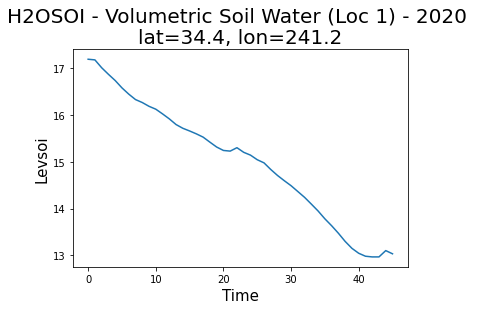

In [281]:
#Plotting the H2OSOI variable DataFrame (Loc 1) using line plot function
df_loc_1_H2OSOI_f5_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2020 \nlat=34.4, lon=241.2",size=20)

In [282]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 2)
data_2_f5 = xr.merge((loc_2_H2OSOI_f5,loc_2_DZSOI_f5,loc_2_ZSOI_f5), compat='override')
data_2_f5

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [283]:
data_2_mul_50_f5 = data_2_f5 * 50
data_2_mul_50_f5

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
    lon      float32 243.8
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 10.13 10.35 10.89 ... 14.68 18.94 0.001754
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [284]:
#Creating a DataFrame for the variable H2OSOI (Loc 2)
df_loc_2_H2OSOI_f5 = pd.DataFrame(data_2_mul_50_f5.H2OSOI)
df_loc_2_H2OSOI_f5

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,10.132122,10.352077,10.894299,12.124282,12.705688,12.841929,12.575979,12.427347,12.464802,11.913208,11.997000,12.104465,12.233036,12.396641,12.621933,12.955385,13.520193,14.682135,18.941984,0.001754
1,10.121838,10.357015,10.892517,12.119349,12.700240,12.837854,12.574066,12.427526,12.466383,11.914559,11.997496,12.104299,12.232526,12.395952,12.621183,12.954752,13.519840,14.681978,18.942131,0.001754
2,10.094910,10.339749,10.880218,12.108544,12.690573,12.830514,12.570297,12.427495,12.469062,11.917089,11.998512,12.104023,12.231552,12.394622,12.619734,12.953526,13.519153,14.681736,18.942177,0.001754
3,10.080683,10.325086,10.867039,12.096784,12.680800,12.823593,12.566575,12.427005,12.471169,11.919419,11.999570,12.103821,12.230622,12.393315,12.618305,12.952316,13.518472,14.681554,18.942183,0.001754
4,10.065086,10.311620,10.855106,12.085795,12.671290,12.816773,12.562858,12.426159,12.472774,11.921535,12.000647,12.103685,12.229735,12.392034,12.616899,12.951125,13.517801,14.681411,18.942104,0.001754
5,10.051845,10.298341,10.843080,12.074919,12.662038,12.810059,12.559112,12.425026,12.473936,11.923427,12.001717,12.103609,12.228892,12.390779,12.615516,12.949952,13.517143,14.681289,18.942135,0.001754
6,10.033842,10.283915,10.831257,12.064428,12.653049,12.803422,12.555322,12.423650,12.474710,11.925094,12.002763,12.103583,12.228094,12.389550,12.614153,12.948797,13.516495,14.681181,18.942232,0.001754
7,10.028864,10.273974,10.820303,12.054050,12.644132,12.796826,12.551477,12.422066,12.475145,11.926539,12.003769,12.103601,12.227338,12.388350,12.612814,12.947659,13.515857,14.681082,18.942217,0.001754
8,10.021401,10.266285,10.811969,12.045468,12.635979,12.790376,12.547578,12.420299,12.475279,11.927770,12.004721,12.103652,12.226624,12.387178,12.611496,12.946539,13.515231,14.680984,18.942110,0.001754
9,10.008380,10.255829,10.803068,12.037218,12.628460,12.784256,12.543676,12.418373,12.475145,11.928792,12.005607,12.103729,12.225948,12.386037,12.610202,12.945436,13.514617,14.680889,18.942150,0.001754


In [285]:
df_loc_2_H2OSOI_f5_5 = df_loc_2_H2OSOI_f5.iloc[:,:5]
df_loc_2_H2OSOI_f5_5

,0,1,2,3,4
0,10.132122,10.352077,10.894299,12.124282,12.705688
1,10.121838,10.357015,10.892517,12.119349,12.700240
2,10.094910,10.339749,10.880218,12.108544,12.690573
3,10.080683,10.325086,10.867039,12.096784,12.680800
4,10.065086,10.311620,10.855106,12.085795,12.671290
5,10.051845,10.298341,10.843080,12.074919,12.662038
6,10.033842,10.283915,10.831257,12.064428,12.653049
7,10.028864,10.273974,10.820303,12.054050,12.644132
8,10.021401,10.266285,10.811969,12.045468,12.635979
9,10.008380,10.255829,10.803068,12.037218,12.628460


In [286]:
df_loc_2_H2OSOI_f5_5_mean = df_loc_2_H2OSOI_f5_5.mean(axis = 1, skipna = True)
df_loc_2_H2OSOI_f5_5_mean

0     11.241693
1     11.238192
2     11.222798
3     11.210078
4     11.197780
5     11.186044
6     11.173298
7     11.164265
8     11.156220
9     11.146591
10    11.138247
11    11.131036
12    11.124402
13    11.117745
14    11.110636
15    11.104038
16    11.098032
17    11.092179
18    11.086330
19    11.080439
20    11.074992
21    11.069911
22    11.065245
23    11.060445
24    11.055767
25    11.264125
26    11.527174
27    11.406420
28    11.329298
29    11.283415
30    11.253477
31    11.230403
32    11.211305
33    11.194700
34    11.723760
35    13.959493
36    14.680979
37    14.649053
38    14.232864
39    14.463267
40    15.173938
41    14.663058
42    14.207811
43    13.786898
44    13.525391
45    13.360102
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 2) - 2020 \nlat=40.99, lon=243.8')

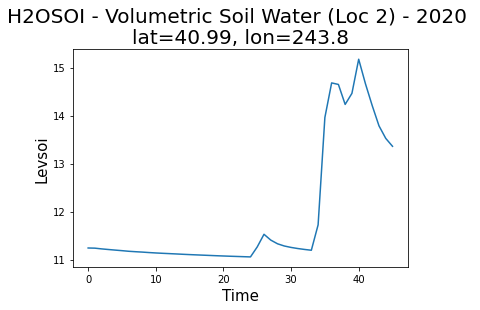

In [287]:
#Plotting the H2OSOI variable DataFrame (Loc 2) using line plot function
df_loc_2_H2OSOI_f5_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 2) - 2020 \nlat=40.99, lon=243.8",size=20)

In [288]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 3)
data_3_f5 = xr.merge((loc_3_H2OSOI_f5,loc_3_DZSOI_f5,loc_3_ZSOI_f5), compat='override')
data_3_f5

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [289]:
data_3_mul_50_f5 = data_3_f5 * 50
data_3_mul_50_f5

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
    lon      float32 242.5
    lat      float32 40.99
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 19.8 20.36 13.19 14.26 ... 16.09 17.38 20.64
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [290]:
#Creating a DataFrame for the variable H2OSOI (Loc 3)
df_loc_3_H2OSOI_f5 = pd.DataFrame(data_3_mul_50_f5.H2OSOI)
df_loc_3_H2OSOI_f5

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,19.803242,20.359377,13.185462,14.259863,14.512966,14.580970,15.629205,15.386680,15.376971,13.571757,13.547256,13.535267,14.262761,14.369477,14.572265,14.893408,15.365932,16.093924,17.380442,20.641626
1,19.936619,20.271338,13.196008,14.237611,14.483144,14.564621,15.623261,15.387626,15.380770,13.575314,13.549344,13.536933,14.264761,14.371279,14.573094,14.893353,15.365561,16.093639,17.380293,20.642525
2,19.507362,18.376284,13.621833,14.473671,14.555828,14.562592,15.613248,15.386668,15.386279,13.581928,13.553648,13.540304,14.268620,14.374744,14.574744,14.893296,15.364874,16.093102,17.380043,20.642523
3,15.913211,15.778160,14.231155,14.985086,14.881952,14.684179,15.648490,15.392208,15.390329,13.587883,13.558146,13.543818,14.272414,14.378127,14.576427,14.893314,15.364239,16.092583,17.379827,20.642544
4,13.934930,14.195230,14.137979,15.059122,15.068150,14.856585,15.755306,15.427193,15.400237,13.593672,13.562730,13.547458,14.276166,14.381435,14.578135,14.893404,15.363654,16.092089,17.379635,20.642509
5,13.569153,13.708918,13.911517,14.903502,15.015531,14.902914,15.838376,15.483421,15.423651,13.600975,13.567490,13.551199,14.279892,14.384681,14.579866,14.893560,15.363123,16.091621,17.379457,20.642469
6,13.678539,13.749859,13.904726,14.870100,14.984661,14.905519,15.870317,15.529181,15.455833,13.611280,13.572766,13.555060,14.283607,14.387870,14.581617,14.893779,15.362639,16.091179,17.379295,20.642300
7,14.006986,13.880796,14.000379,14.932434,15.018185,14.928262,15.895130,15.561971,15.488009,13.624480,13.578921,13.559103,14.287326,14.391015,14.583386,14.894058,15.362207,16.090761,17.379143,20.642263
8,15.240933,13.491763,13.762858,14.827079,15.005838,14.955380,15.928546,15.592859,15.517905,13.639662,13.586138,13.563408,14.291074,14.394125,14.585170,14.894395,15.361823,16.090370,17.379002,20.642231
9,17.502934,14.162259,13.276513,14.486976,14.812515,14.895723,15.929884,15.617986,15.545942,13.656148,13.594435,13.568054,14.294881,14.397210,14.586967,14.894783,15.361485,16.090002,17.378868,20.642166


In [291]:
df_loc_3_H2OSOI_f5_5 = df_loc_3_H2OSOI_f5.iloc[:,:5]
df_loc_3_H2OSOI_f5_5

,0,1,2,3,4
0,19.803242,20.359377,13.185462,14.259863,14.512966
1,19.936619,20.271338,13.196008,14.237611,14.483144
2,19.507362,18.376284,13.621833,14.473671,14.555828
3,15.913211,15.778160,14.231155,14.985086,14.881952
4,13.934930,14.195230,14.137979,15.059122,15.068150
5,13.569153,13.708918,13.911517,14.903502,15.015531
6,13.678539,13.749859,13.904726,14.870100,14.984661
7,14.006986,13.880796,14.000379,14.932434,15.018185
8,15.240933,13.491763,13.762858,14.827079,15.005838
9,17.502934,14.162259,13.276513,14.486976,14.812515


In [292]:
df_loc_3_H2OSOI_f5_5_mean = df_loc_3_H2OSOI_f5_5.mean(axis = 1, skipna = True)
df_loc_3_H2OSOI_f5_5_mean

0     16.424183
1     16.424944
2     16.106995
3     15.157913
4     14.479083
5     14.221724
6     14.237576
7     14.367755
8     14.465695
9     14.848239
10    15.111441
11    15.135175
12    14.966146
13    14.554062
14    14.519984
15    14.231049
16    14.051005
17    13.943997
18    13.875697
19    13.821630
20    13.889676
21    15.514740
22    16.513458
23    16.000015
24    15.617399
25    15.278317
26    15.320868
27    15.270697
28    15.265821
29    15.167624
30    14.752562
31    14.870740
32    15.315745
33    15.527080
34    17.096958
35    17.752787
36    18.026546
37    18.063269
38    18.012379
39    17.290051
40    17.297029
41    17.303198
42    17.726212
43    17.833927
44    17.921085
45    17.217541
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 3) - 2020 \nlat=40.99, lon=242.5')

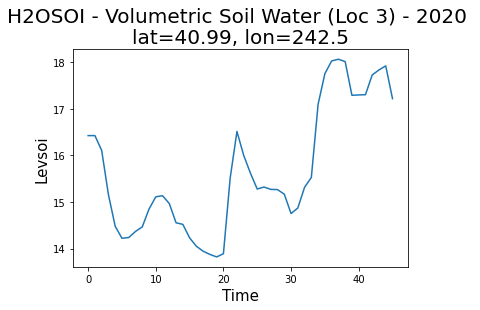

In [293]:
#Plotting the H2OSOI variable DataFrame (Loc 3) using line plot function
df_loc_3_H2OSOI_f5_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 3) - 2020 \nlat=40.99, lon=242.5",size=20)

In [294]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 4)
data_4_f5 = xr.merge((loc_4_H2OSOI_f5,loc_4_DZSOI_f5,loc_4_ZSOI_f5), compat='override')
data_4_f5

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [295]:
data_4_mul_50_f5 = data_4_f5 * 50
data_4_mul_50_f5

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2020-01-27 00:00:00 ... 2020-03-13 00:00:00
    lon      float32 80.0
    lat      float32 11.78
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 13.98 14.47 14.98 ... 21.81 21.99 21.99
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [296]:
#Creating a DataFrame for the variable H2OSOI (Loc 4)
df_loc_4_H2OSOI_f5 = pd.DataFrame(data_4_mul_50_f5.H2OSOI)
df_loc_4_H2OSOI_f5

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,13.979416,14.473086,14.983315,15.687741,16.574612,16.896837,16.966434,16.743736,17.195951,16.399595,17.157969,18.688927,19.352957,19.499897,19.703625,20.060143,20.991419,21.993000,21.993,21.993
1,13.749830,14.271445,14.831297,15.584972,16.508387,16.850462,16.927307,16.707745,17.161755,16.366783,17.111891,18.610601,19.345671,19.494310,19.699738,20.057203,20.984489,21.993000,21.993,21.993
2,13.660418,14.186974,14.750022,15.507075,16.435144,16.779114,16.858263,16.641497,17.096136,16.298613,17.017473,18.464022,19.331738,19.483562,19.692177,20.051275,20.970406,21.993000,21.993,21.993
3,13.557452,14.091693,14.662856,15.427950,16.363834,16.711571,16.792542,16.576702,17.030378,16.230005,16.930349,18.310621,19.317936,19.472883,19.684570,20.045059,20.955536,21.993000,21.993,21.993
4,13.578357,14.082689,14.623941,15.372501,16.303301,16.648369,16.729242,16.513630,16.966667,16.165304,16.851242,18.145355,19.304253,19.462271,19.676914,20.038567,20.939919,21.993000,21.993,21.993
5,13.584950,14.076662,14.601575,15.337162,16.260477,16.597155,16.672710,16.453699,16.904575,16.100601,16.770687,17.981123,19.290693,19.451727,19.669205,20.031815,20.923594,21.993000,21.993,21.993
6,13.692683,14.163396,14.655722,15.358475,16.255682,16.567520,16.627680,16.399103,16.845169,16.037426,16.693756,17.814566,19.277346,19.441301,19.661478,20.024820,20.906620,21.993000,21.993,21.993
7,13.573596,14.071138,14.592255,15.317249,16.227064,16.539154,16.590548,16.350445,16.789282,15.974803,16.613272,17.654423,19.264189,19.430984,19.653721,20.017591,20.889040,21.993000,21.993,21.993
8,13.562778,14.053859,14.561918,15.278253,16.186161,16.498213,16.547939,16.301575,16.733963,15.911448,16.532043,17.505165,19.247194,19.420712,19.645903,20.010113,20.870880,21.993000,21.993,21.993
9,13.530944,14.021789,14.527840,15.242336,16.149769,16.459135,16.505033,16.252121,16.678455,15.848769,16.453680,17.368183,19.220892,19.410486,19.638023,20.002396,20.852175,21.993000,21.993,21.993


In [297]:
df_loc_4_H2OSOI_f5_5 = df_loc_4_H2OSOI_f5.iloc[:,:5]
df_loc_4_H2OSOI_f5_5

,0,1,2,3,4
0,13.979416,14.473086,14.983315,15.687741,16.574612
1,13.749830,14.271445,14.831297,15.584972,16.508387
2,13.660418,14.186974,14.750022,15.507075,16.435144
3,13.557452,14.091693,14.662856,15.427950,16.363834
4,13.578357,14.082689,14.623941,15.372501,16.303301
5,13.584950,14.076662,14.601575,15.337162,16.260477
6,13.692683,14.163396,14.655722,15.358475,16.255682
7,13.573596,14.071138,14.592255,15.317249,16.227064
8,13.562778,14.053859,14.561918,15.278253,16.186161
9,13.530944,14.021789,14.527840,15.242336,16.149769


In [298]:
df_loc_4_H2OSOI_f5_5_mean = df_loc_4_H2OSOI_f5_5.mean(axis = 1, skipna = True)
df_loc_4_H2OSOI_f5_5_mean

0     15.139633
1     14.989186
2     14.907927
3     14.820758
4     14.792158
5     14.772165
6     14.825192
7     14.756261
8     14.728594
9     14.694536
10    14.810236
11    14.951284
12    14.907827
13    14.793472
14    14.672153
15    14.609256
16    14.564796
17    14.583392
18    14.798836
19    14.577463
20    14.481125
21    14.441449
22    14.365291
23    14.330861
24    14.293796
25    14.246080
26    14.198217
27    14.160261
28    14.166059
29    14.132347
30    14.080606
31    14.026106
32    13.975088
33    13.950827
34    13.905592
35    13.885190
36    13.858417
37    13.837914
38    13.833331
39    13.810847
40    13.778709
41    13.729271
42    13.680232
43    13.646187
44    13.635585
45    13.608974
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 4) - 2020 \nlat=11.78, lon=80.0')

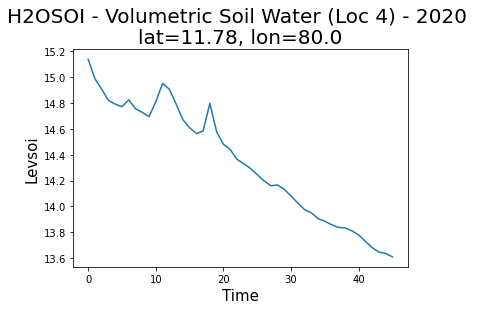

In [299]:
#Plotting the H2OSOI variable DataFrame (Loc 4) using line plot function
df_loc_4_H2OSOI_f5_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 4) - 2020 \nlat=11.78, lon=80.0",size=20)

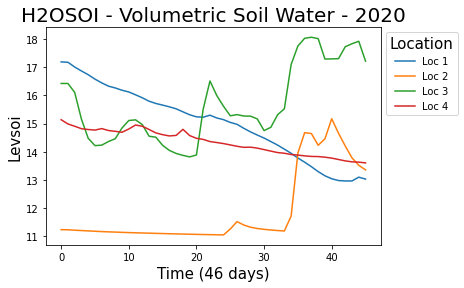

In [300]:
#Plotting the H2OSOI variable DataFrame for all locations using line plot function
df_loc_1_H2OSOI_f5_5_mean.plot(kind='line', label = 'Loc 1')
df_loc_2_H2OSOI_f5_5_mean.plot(kind='line', label = 'Loc 2')
df_loc_3_H2OSOI_f5_5_mean.plot(kind='line', label = 'Loc 3')
df_loc_4_H2OSOI_f5_5_mean.plot(kind='line', label = 'Loc 4')
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2020",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

In [302]:
ds_f6 = xr.open_dataset("cesm2cam6v2.2021-01-25.09.clm2.h0.2021-01-25-00000.nc", engine="netcdf4")

In [303]:
ds_f6

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, hist_interval: 2, lon: 288, lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2021-01-25 00:00:00 ... 2021-03-11 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi
Data variables: (12/56)
    mcdate          (time) int32 ...
    mcsec           (time) int32 ...
    mdcur           (time) int32 ...
    mscur           (time) int32 ...
    nstep           (time) int32 ...
    time_bounds     (time, hist_interval) object ...
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 ...
    SOILWATER_10CM  (time, lat, lon) float32 ...
    TLAI            (time, lat, lon) float32 ...
    TOTECOSYSC      (time, lat, lon) float32 ...
    TOTVEGC         (time, lat, lon) float32 ...
    TWS             (time, lat, lon) float32 ...
Attributes: (12/100)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 01/19/22 05:04:53
    source:                                    Community Land Model CLM4.0
    hostname:                                  cheyenne
    ...                                        ...
    cft_irrigated_switchgrass:                 60
    cft_tropical_corn:                         61
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          day_1

In [304]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

loc_1_H2OSOI_f6=ds_f6.H2OSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_DZSOI_f6=ds_f6.DZSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_ZSOI_f6 = ds_f6.ZSOI.sel(lat=34.0522, lon=241.75, method='nearest')

#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

loc_2_H2OSOI_f6=ds_f6.H2OSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_DZSOI_f6=ds_f6.DZSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_ZSOI_f6 = ds_f6.ZSOI.sel(lat=41.02, lon=244.05, method='nearest')

#Boston Location - Latitude & Longitude co-ordinates
# identified Location is Near to Boston

loc_3_H2OSOI_f6=ds_f6.H2OSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_DZSOI_f6=ds_f6.DZSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_ZSOI_f6 = ds_f6.ZSOI.sel(lat=41.08, lon=243.05, method='nearest')

#Villupuram - Latitude & Longitude co-ordinates
# identified Location is around VPM

loc_4_H2OSOI_f6=ds_f6.H2OSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_DZSOI_f6=ds_f6.DZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_ZSOI_f6 = ds_f6.ZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')

In [305]:
#Merging the variables (H2OSOI, DZSOI and ZSOI) into a single Dataset (Loc 1)
data_1_f6 = xr.merge((loc_1_H2OSOI_f6,loc_1_DZSOI_f6,loc_1_ZSOI_f6), compat='override')
data_1_f6

<xarray.Dataset>
Dimensions:  (time: 46, levsoi: 20, levgrnd: 25)
Coordinates:
  * time     (time) object 2021-01-25 00:00:00 ... 2021-03-11 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 ...
    DZSOI    (levgrnd) float32 ...
    ZSOI     (levgrnd) float32 ...
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [306]:
dataa_1_mul_50_f6 = data_1_f6 * 50
dataa_1_mul_50_f6

<xarray.Dataset>
Dimensions:  (time: 46, levgrnd: 25, levsoi: 20)
Coordinates:
  * time     (time) object 2021-01-25 00:00:00 ... 2021-03-11 00:00:00
    lon      float32 241.2
    lat      float32 34.4
  * levgrnd  (levgrnd) float32 0.01 0.04 0.09 0.16 ... 13.33 19.48 28.87 42.0
Dimensions without coordinates: levsoi
Data variables:
    H2OSOI   (time, levsoi) float32 5.308 9.048 10.3 11.37 ... 16.94 17.6 18.61
    DZSOI    (levgrnd) float32 1.0 2.0 3.0 4.0 6.0 ... 233.8 381.8 557.0 755.8
    ZSOI     (levgrnd) float32 0.5 2.0 4.5 8.0 ... 666.4 974.2 1.444e+03 2.1e+03
Attributes:
    long_name:     volumetric soil water (vegetated landunits only)
    units:         mm3/mm3
    cell_methods:  time: mean

In [307]:
#Creating a DataFrame for the variable H2OSOI (Loc 1)
df_loc_1_H2OSOI_f6 = pd.DataFrame(dataa_1_mul_50_f6.H2OSOI)
df_loc_1_H2OSOI_f6

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,5.308029,9.047762,10.302210,11.374021,12.042562,12.342309,12.621713,13.007985,13.552092,12.760024,13.195189,13.569795,15.151328,15.427545,15.734787,16.079947,16.482161,16.979652,17.649515,18.681984
1,7.899548,9.095559,10.303700,11.374020,12.042510,12.342193,12.621548,13.007717,13.551676,12.759459,13.194570,13.569149,15.150584,15.426822,15.734112,16.079342,16.481634,16.979176,17.649012,18.681286
2,10.139770,9.446206,10.337214,11.378466,12.043773,12.342752,12.621593,13.007318,13.550899,12.758366,13.193366,13.567895,15.149130,15.425411,15.732794,16.078163,16.480604,16.978243,17.648026,18.679913
3,9.771405,9.598016,10.395845,11.391994,12.047676,12.344769,12.622386,13.007204,13.550210,12.757299,13.192172,13.566650,15.147683,15.424007,15.731481,16.076986,16.479574,16.977308,17.647036,18.678526
4,9.993705,9.723665,10.452695,11.411558,12.053951,12.347888,12.623790,13.007352,13.549612,12.756263,13.190990,13.565418,15.146244,15.422609,15.730175,16.075817,16.478548,16.976374,17.646044,18.677134
5,16.802427,14.962930,13.865891,12.870728,12.201402,12.368981,12.634346,13.011724,13.550483,12.755672,13.189930,13.564219,15.144817,15.421222,15.728877,16.074650,16.477524,16.975439,17.645050,18.675732
6,15.611065,14.786683,14.800498,14.817090,13.408918,12.494312,12.669609,13.026876,13.555209,12.756216,13.189183,13.563100,15.143415,15.419844,15.727587,16.073490,16.476501,16.974501,17.644053,18.674320
7,16.589460,15.701439,15.564895,15.411392,14.468752,12.792694,12.715753,13.043398,13.560544,12.756867,13.188502,13.562004,15.142028,15.418474,15.726301,16.072332,16.475481,16.973566,17.643053,18.672901
8,15.149248,14.706485,15.086648,15.473337,15.185944,13.338357,12.788519,13.061552,13.566393,12.757590,13.187872,13.560933,15.140655,15.417114,15.725024,16.071180,16.474463,16.972628,17.642048,18.671474
9,15.206209,14.536169,14.776521,15.181870,15.137756,13.842271,12.904268,13.081923,13.572541,12.758308,13.187270,13.559877,15.139292,15.415762,15.723753,16.070034,16.473446,16.971689,17.641041,18.670042


In [308]:
df_loc_1_H2OSOI_f6_5 = df_loc_1_H2OSOI_f6.iloc[:,:5]  
df_loc_1_H2OSOI_f6_5

,0,1,2,3,4
0,5.308029,9.047762,10.302210,11.374021,12.042562
1,7.899548,9.095559,10.303700,11.374020,12.042510
2,10.139770,9.446206,10.337214,11.378466,12.043773
3,9.771405,9.598016,10.395845,11.391994,12.047676
4,9.993705,9.723665,10.452695,11.411558,12.053951
5,16.802427,14.962930,13.865891,12.870728,12.201402
6,15.611065,14.786683,14.800498,14.817090,13.408918
7,16.589460,15.701439,15.564895,15.411392,14.468752
8,15.149248,14.706485,15.086648,15.473337,15.185944
9,15.206209,14.536169,14.776521,15.181870,15.137756


In [309]:
df_loc_1_H2OSOI_f6_5_mean = df_loc_1_H2OSOI_f6_5.mean(axis = 1, skipna = True)
df_loc_1_H2OSOI_f6_5_mean

0      9.614916
1     10.143068
2     10.669086
3     10.640987
4     10.727114
5     14.140676
6     14.684851
7     15.547188
8     15.120333
9     14.967705
10    14.706657
11    14.335798
12    14.061327
13    13.837698
14    13.643684
15    13.464971
16    13.298149
17    13.160807
18    13.346178
19    13.312080
20    13.308451
21    13.269757
22    13.969058
23    16.336943
24    17.453085
25    16.470785
26    15.945651
27    15.514723
28    15.159137
29    14.869052
30    14.594084
31    14.343704
32    14.135149
33    13.917868
34    13.712502
35    13.555983
36    14.183408
37    13.923078
38    14.215582
39    13.869909
40    13.624369
41    13.404602
42    13.159647
43    12.917458
44    12.695859
45    12.491464
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2021 \nlat=34.4, lon=241.2')

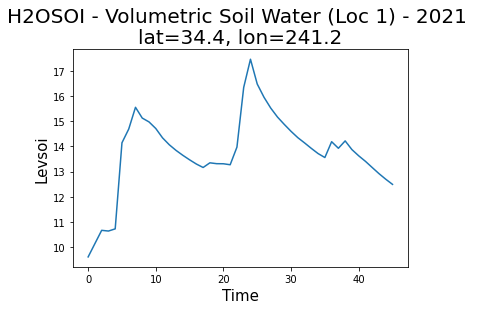

In [310]:
#Plotting the H2OSOI variable DataFrame (Loc 1) using line plot function
df_loc_1_H2OSOI_f6_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2021 \nlat=34.4, lon=241.2",size=20)

In [311]:
data_2_f6 = xr.merge((loc_2_H2OSOI_f6,loc_2_DZSOI_f6,loc_2_ZSOI_f6), compat='override')
data_2_mul_50_f6 = data_2_f6 * 50
df_loc_2_H2OSOI_f6 = pd.DataFrame(data_2_mul_50_f6.H2OSOI)
df_loc_2_H2OSOI_f6_5 = df_loc_2_H2OSOI_f6.iloc[:,:5]
df_loc_2_H2OSOI_f6_5_mean = df_loc_2_H2OSOI_f6_5.mean(axis = 1, skipna = True)
df_loc_2_H2OSOI_f6_5_mean

0     10.153958
1     10.151833
2     10.153265
3     10.154430
4     10.156668
5     10.158687
6     10.317354
7     10.937311
8     10.821506
9     10.679364
10    10.610277
11    10.591578
12    10.543083
13    10.509206
14    10.491942
15    10.479855
16    10.459768
17    10.436491
18    10.426938
19    11.622056
20    13.715128
21    14.914627
22    15.070717
23    15.699820
24    15.737814
25    15.814593
26    15.224439
27    14.733200
28    14.407331
29    14.106058
30    14.062998
31    14.501709
32    16.122641
33    15.218030
34    15.105533
35    14.716855
36    15.561930
37    15.488373
38    15.369657
39    15.130211
40    14.993876
41    15.235843
42    14.808660
43    14.258570
44    13.907333
45    13.697728
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 2) - 2021 \nlat=40.99, lon=243.8')

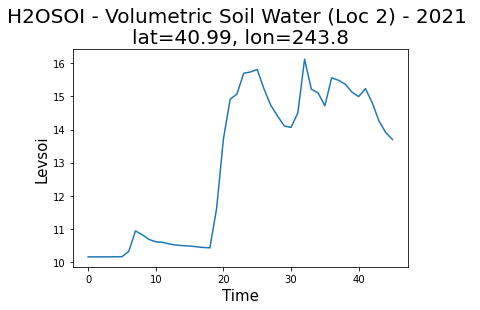

In [312]:
#Plotting the H2OSOI variable DataFrame (Loc 2) using line plot function
df_loc_2_H2OSOI_f6_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 2) - 2021 \nlat=40.99, lon=243.8",size=20)

In [313]:
data_3_f6 = xr.merge((loc_3_H2OSOI_f6,loc_3_DZSOI_f6,loc_3_ZSOI_f6), compat='override')
data_3_mul_50_f6 = data_3_f6 * 50
df_loc_3_H2OSOI_f6 = pd.DataFrame(data_3_mul_50_f6.H2OSOI)
df_loc_3_H2OSOI_f6_5 = df_loc_3_H2OSOI_f6.iloc[:,:5]
df_loc_3_H2OSOI_f6_5_mean = df_loc_3_H2OSOI_f6_5.mean(axis = 1, skipna = True)
df_loc_3_H2OSOI_f6_5_mean

0     12.776123
1     12.865364
2     12.836270
3     12.972803
4     13.659714
5     14.917536
6     14.821405
7     15.023163
8     14.968134
9     15.097885
10    15.316223
11    14.968443
12    14.579445
13    14.216171
14    14.047117
15    13.901854
16    13.730280
17    13.570770
18    13.476865
19    13.629593
20    13.722926
21    13.834620
22    14.110257
23    14.638234
24    14.447658
25    14.603668
26    14.623197
27    14.398636
28    14.251535
29    14.133222
30    14.107411
31    14.654562
32    16.914171
33    16.013752
34    15.717374
35    15.414925
36    16.078018
37    16.329380
38    16.240311
39    15.917590
40    15.944641
41    15.802124
42    15.537302
43    15.112314
44    14.922397
45    14.774437
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 3) - 2021 \nlat=40.99, lon=242.5')

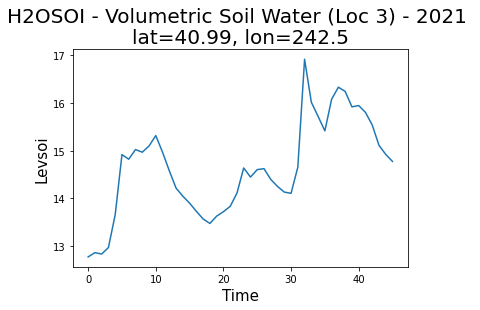

In [314]:
#Plotting the H2OSOI variable DataFrame (Loc 3) using line plot function
df_loc_3_H2OSOI_f6_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 3) - 2021 \nlat=40.99, lon=242.5",size=20)

In [315]:
data_4_f6 = xr.merge((loc_4_H2OSOI_f6,loc_4_DZSOI_f6,loc_4_ZSOI_f6), compat='override')
data_4_mul_50_f6 = data_4_f6 * 50
df_loc_4_H2OSOI_f6 = pd.DataFrame(data_4_mul_50_f6.H2OSOI)
df_loc_4_H2OSOI_f6_5 = df_loc_4_H2OSOI_f6.iloc[:,:5]
df_loc_4_H2OSOI_f6_5_mean = df_loc_4_H2OSOI_f6_5.mean(axis = 1, skipna = True)
df_loc_4_H2OSOI_f6_5_mean

0     15.535393
1     15.341763
2     15.219780
3     15.140437
4     15.447741
5     17.076864
6     17.368860
7     17.196127
8     16.913464
9     16.556229
10    17.169128
11    16.783833
12    16.396988
13    16.118229
14    15.921824
15    16.048355
16    16.091076
17    15.873178
18    15.615191
19    15.408319
20    15.219152
21    15.108844
22    15.025505
23    14.955966
24    14.871023
25    14.808789
26    14.735756
27    14.685678
28    14.644363
29    14.610173
30    14.587286
31    14.557709
32    14.484350
33    14.431920
34    14.392815
35    14.342909
36    14.295603
37    14.272829
38    14.726257
39    14.702339
40    14.419179
41    14.347090
42    14.489980
43    14.334898
44    14.239288
45    14.187757
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 4) - 2021 \nlat=11.78, lon=80.0')

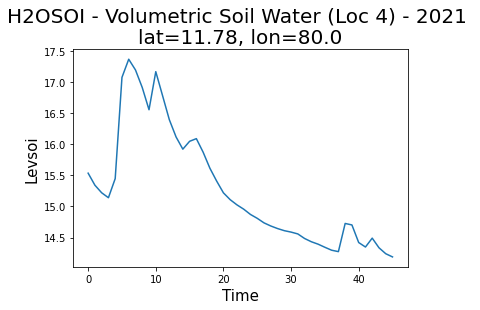

In [316]:
#Plotting the H2OSOI variable DataFrame (Loc 4) using line plot function
df_loc_4_H2OSOI_f6_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 4) - 2021 \nlat=11.78, lon=80.0",size=20)

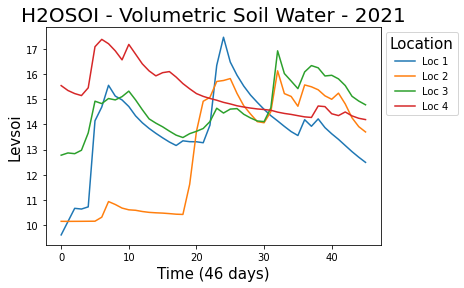

In [317]:
#Plotting the H2OSOI variable DataFrame for all locations using line plot function
df_loc_1_H2OSOI_f6_5_mean.plot(kind='line', label = 'Loc 1')
df_loc_2_H2OSOI_f6_5_mean.plot(kind='line', label = 'Loc 2')
df_loc_3_H2OSOI_f6_5_mean.plot(kind='line', label = 'Loc 3')
df_loc_4_H2OSOI_f6_5_mean.plot(kind='line', label = 'Loc 4')
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2021",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

In [318]:
ds_f7 = xr.open_dataset("cesm2cam6v2.2022-01-24.09.clm2.h0.2022-01-24-00000.nc", engine="netcdf4")

In [319]:
ds_f7

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, hist_interval: 2, lon: 288, lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2022-01-24 00:00:00 ... 2022-03-10 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi
Data variables: (12/56)
    mcdate          (time) int32 ...
    mcsec           (time) int32 ...
    mdcur           (time) int32 ...
    mscur           (time) int32 ...
    nstep           (time) int32 ...
    time_bounds     (time, hist_interval) object ...
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 ...
    SOILWATER_10CM  (time, lat, lon) float32 ...
    TLAI            (time, lat, lon) float32 ...
    TOTECOSYSC      (time, lat, lon) float32 ...
    TOTVEGC         (time, lat, lon) float32 ...
    TWS             (time, lat, lon) float32 ...
Attributes: (12/100)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 01/25/22 23:44:38
    source:                                    Community Land Model CLM4.0
    hostname:                                  cheyenne
    ...                                        ...
    cft_irrigated_switchgrass:                 60
    cft_tropical_corn:                         61
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          day_1

In [320]:
#Los Angels Location - Latitude & Longitude co-ordinates
# identified Location is Howe Road, Ventura County, California, 93015

loc_1_H2OSOI_f7=ds_f7.H2OSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_DZSOI_f7=ds_f7.DZSOI.sel(lat=34.0522, lon=241.75, method='nearest')
loc_1_ZSOI_f7 = ds_f7.ZSOI.sel(lat=34.0522, lon=241.75, method='nearest')

#Cheyenne Location - Latitude & Longitude co-ordinates
# identified Location is near Cheyenne

loc_2_H2OSOI_f7=ds_f7.H2OSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_DZSOI_f7=ds_f7.DZSOI.sel(lat=41.02, lon=244.05, method='nearest')
loc_2_ZSOI_f7 = ds_f7.ZSOI.sel(lat=41.02, lon=244.05, method='nearest')

#Boston Location - Latitude & Longitude co-ordinates
# identified Location is Near to Boston

loc_3_H2OSOI_f7=ds_f7.H2OSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_DZSOI_f7=ds_f7.DZSOI.sel(lat=41.08, lon=243.05, method='nearest')
loc_3_ZSOI_f7 = ds_f7.ZSOI.sel(lat=41.08, lon=243.05, method='nearest')

#Villupuram - Latitude & Longitude co-ordinates
# identified Location is around VPM

loc_4_H2OSOI_f7=ds_f7.H2OSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_DZSOI_f7=ds_f7.DZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')
loc_4_ZSOI_f7 = ds_f7.ZSOI.sel(lat=11.938066, lon=79.488102, method='nearest')

In [321]:
data_1_f7 = xr.merge((loc_1_H2OSOI_f7,loc_1_DZSOI_f7,loc_1_ZSOI_f7), compat='override')
dataa_1_mul_50_f7 = data_1_f7 * 50
df_loc_1_H2OSOI_f7 = pd.DataFrame(dataa_1_mul_50_f7.H2OSOI)
df_loc_1_H2OSOI_f7_5 = df_loc_1_H2OSOI_f7.iloc[:,:5]
df_loc_1_H2OSOI_f7_5_mean = df_loc_1_H2OSOI_f7_5.mean(axis = 1, skipna = True)
df_loc_1_H2OSOI_f7_5_mean

0     13.374588
1     13.401944
2     13.310885
3     13.249552
4     13.157095
5     13.063293
6     12.963376
7     12.859723
8     12.770340
9     12.727624
10    12.774416
11    12.670987
12    12.521537
13    12.393346
14    12.291031
15    12.332726
16    13.846049
17    13.755963
18    13.344737
19    13.136823
20    12.904755
21    12.685935
22    13.047892
23    13.353128
24    13.956390
25    13.685226
26    13.361536
27    13.136007
28    13.950969
29    16.715382
30    16.776285
31    19.364880
32    19.809599
33    18.488480
34    17.840862
35    17.312782
36    16.889359
37    16.515034
38    16.171566
39    15.840509
40    15.541437
41    15.277036
42    15.112143
43    14.981714
44    14.910014
45    14.805632
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 1) - 2022 \nlat=34.4, lon=241.2')

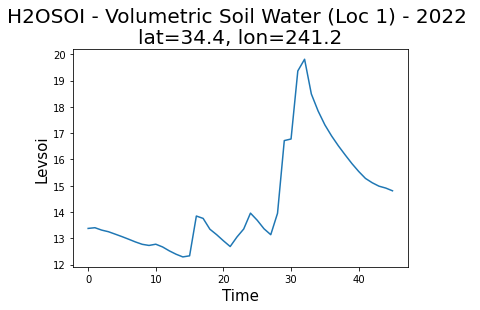

In [322]:
#Plotting the H2OSOI variable DataFrame (Loc 1) using line plot function
df_loc_1_H2OSOI_f7_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 1) - 2022 \nlat=34.4, lon=241.2",size=20)

In [323]:
data_2_f7 = xr.merge((loc_2_H2OSOI_f7,loc_2_DZSOI_f7,loc_2_ZSOI_f7), compat='override')
data_2_mul_50_f7 = data_2_f7 * 50
df_loc_2_H2OSOI_f7 = pd.DataFrame(data_2_mul_50_f7.H2OSOI)
df_loc_2_H2OSOI_f7_5 = df_loc_2_H2OSOI_f7.iloc[:,:5]
df_loc_2_H2OSOI_f7_5_mean = df_loc_2_H2OSOI_f7_5.mean(axis = 1, skipna = True)
df_loc_2_H2OSOI_f7_5_mean

0     11.667344
1     11.689825
2     11.745731
3     11.930266
4     12.120344
5     12.240297
6     12.310768
7     12.722669
8     13.768977
9     13.452791
10    13.626409
11    13.336706
12    13.196230
13    14.923782
14    16.797916
15    17.165112
16    16.989639
17    16.103218
18    15.631203
19    15.583082
20    14.806847
21    14.409447
22    15.097547
23    15.317370
24    15.048221
25    15.199341
26    14.893103
27    14.375305
28    14.037331
29    14.645578
30    14.951823
31    15.371367
32    15.388888
33    14.752680
34    14.706001
35    14.607153
36    15.359616
37    14.608803
38    14.295221
39    13.967758
40    13.758705
41    13.847635
42    13.953321
43    14.304922
44    14.544540
45    14.070074
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 2) - 2022 \nlat=40.99, lon=243.8')

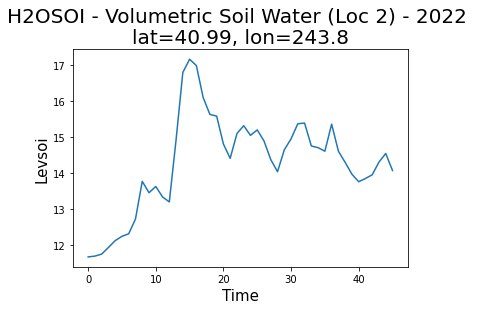

In [324]:
#Plotting the H2OSOI variable DataFrame (Loc 2) using line plot function
df_loc_2_H2OSOI_f7_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 2) - 2022 \nlat=40.99, lon=243.8",size=20)

In [325]:
data_3_f7 = xr.merge((loc_3_H2OSOI_f7,loc_3_DZSOI_f7,loc_3_ZSOI_f7), compat='override')
data_3_mul_50_f7 = data_3_f7 * 50
df_loc_3_H2OSOI_f7 = pd.DataFrame(data_3_mul_50_f7.H2OSOI)
df_loc_3_H2OSOI_f7_5 = df_loc_3_H2OSOI_f7.iloc[:,:5]
df_loc_3_H2OSOI_f7_5_mean = df_loc_3_H2OSOI_f7_5.mean(axis = 1, skipna = True)
df_loc_3_H2OSOI_f7_5_mean

0     13.034024
1     13.028066
2     13.023476
3     13.098627
4     13.092015
5     13.036077
6     13.543599
7     15.408689
8     16.811087
9     16.810585
10    16.834620
11    16.879587
12    16.888012
13    16.513165
14    16.788448
15    16.755833
16    17.672405
17    17.195890
18    16.859737
19    16.663446
20    16.124912
21    15.828537
22    16.674501
23    16.977610
24    17.004026
25    16.974237
26    16.829880
27    16.054783
28    15.832108
29    16.227926
30    16.586761
31    17.210554
32    17.326000
33    16.576799
34    16.905025
35    16.535370
36    16.336378
37    15.945989
38    15.726404
39    15.524221
40    15.365982
41    15.530423
42    15.543591
43    15.928991
44    16.160137
45    15.819013
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 3) - 2022 \nlat=40.99, lon=242.5')

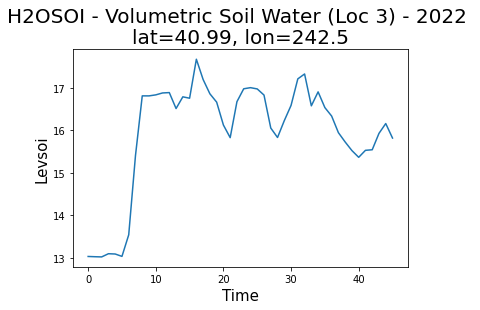

In [326]:
#Plotting the H2OSOI variable DataFrame (Loc 3) using line plot function
df_loc_3_H2OSOI_f7_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 3) - 2022 \nlat=40.99, lon=242.5",size=20)

In [327]:
data_4_f7 = xr.merge((loc_4_H2OSOI_f7,loc_4_DZSOI_f7,loc_4_ZSOI_f7), compat='override')
data_4_mul_50_f7 = data_4_f7 * 50
df_loc_4_H2OSOI_f7 = pd.DataFrame(data_4_mul_50_f7.H2OSOI)
df_loc_4_H2OSOI_f7_5 = df_loc_4_H2OSOI_f7.iloc[:,:5]
df_loc_4_H2OSOI_f7_5_mean = df_loc_4_H2OSOI_f7_5.mean(axis = 1, skipna = True)
df_loc_4_H2OSOI_f7_5_mean

0     18.136625
1     17.939030
2     18.118753
3     17.850903
4     17.768789
5     17.517912
6     17.519650
7     17.360058
8     17.222507
9     17.041449
10    16.939005
11    17.003092
12    17.016506
13    16.841146
14    16.671034
15    16.628765
16    16.667353
17    16.417019
18    16.242365
19    16.100887
20    15.982094
21    15.896612
22    15.800125
23    16.520748
24    19.152378
25    18.578743
26    18.832598
27    18.398392
28    18.018583
29    17.798542
30    17.365992
31    17.088039
32    16.889791
33    16.703594
34    16.526737
35    16.384914
36    16.249411
37    16.113350
38    15.966469
39    15.867468
40    15.755124
41    15.807691
42    15.735334
43    15.611173
44    15.546580
45    15.565344
dtype: float32

Text(0.5, 1.0, 'H2OSOI - Volumetric Soil Water (Loc 4) - 2022 \nlat=11.78, lon=80.0')

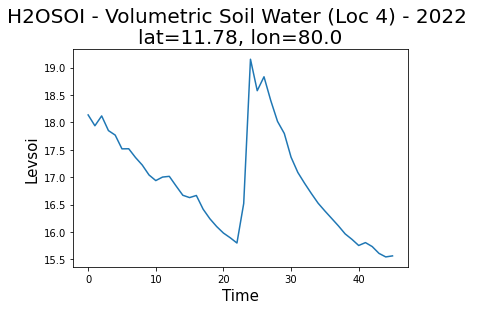

In [328]:
#Plotting the H2OSOI variable DataFrame (Loc 4) using line plot function
df_loc_4_H2OSOI_f7_5_mean.plot(kind='line')
plt.xlabel("Time",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water (Loc 4) - 2022 \nlat=11.78, lon=80.0",size=20)

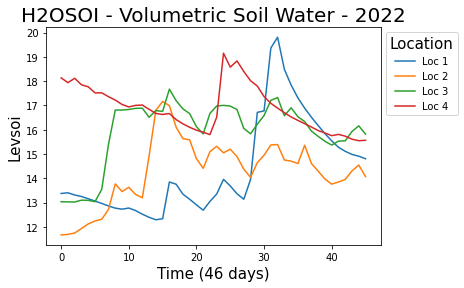

In [329]:
#Plotting the H2OSOI variable DataFrame for all locations using line plot function
df_loc_1_H2OSOI_f7_5_mean.plot(kind='line', label = 'Loc 1')
df_loc_2_H2OSOI_f7_5_mean.plot(kind='line', label = 'Loc 2')
df_loc_3_H2OSOI_f7_5_mean.plot(kind='line', label = 'Loc 3')
df_loc_4_H2OSOI_f7_5_mean.plot(kind='line', label = 'Loc 4')
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2022",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Year 2016 (All Locations)</font></u></b>

In [330]:
df_merged_year_1 = pd.concat([df_loc_1_H2OSOI_f1_5_mean, df_loc_2_H2OSOI_f1_5_mean, df_loc_3_H2OSOI_f1_5_mean, df_loc_4_H2OSOI_f1_5_mean], axis=1, join="inner")
df_merged_year_1.columns = ['Levsoi_H2OSOI (Loc 1)', 'Levsoi_H2OSOI (Loc 2)', 'Levsoi_H2OSOI (Loc 3)','Levsoi_H2OSOI (Loc 4)']
df_merged_year_1

,Levsoi_H2OSOI (Loc 1),Levsoi_H2OSOI (Loc 2),Levsoi_H2OSOI (Loc 3),Levsoi_H2OSOI (Loc 4)
0,14.321718,12.203051,13.953276,18.591328
1,14.287066,12.193378,13.942017,18.273129
2,14.163290,12.177407,14.020358,18.024784
3,14.070190,12.220677,14.256821,17.872812
4,13.968442,12.435870,14.234830,17.752537
5,13.855377,12.523401,14.472099,17.633812
6,13.753140,12.732605,15.428810,17.513565
7,14.077191,12.751141,15.549853,17.407541
8,14.646944,12.613014,15.397591,17.330847
9,14.376219,12.749444,15.329042,17.271755


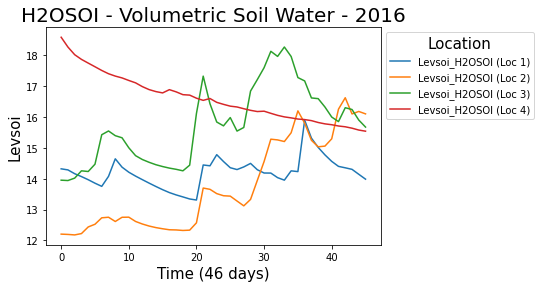

In [331]:
df_merged_year_1.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2016",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Year 2017 (All Locations)</font></u></b>

In [332]:
df_merged_year_2 = pd.concat([df_loc_1_H2OSOI_f2_5_mean, df_loc_2_H2OSOI_f2_5_mean, df_loc_3_H2OSOI_f2_5_mean, df_loc_4_H2OSOI_f2_5_mean], axis=1, join="inner")
df_merged_year_2.columns = ['Levsoi_H2OSOI (Loc 1)', 'Levsoi_H2OSOI (Loc 2)', 'Levsoi_H2OSOI (Loc 3)','Levsoi_H2OSOI (Loc 4)']
df_merged_year_2

,Levsoi_H2OSOI (Loc 1),Levsoi_H2OSOI (Loc 2),Levsoi_H2OSOI (Loc 3),Levsoi_H2OSOI (Loc 4)
0,22.795145,11.582263,14.285536,16.695896
1,21.226263,11.577162,14.264458,16.393379
2,19.880110,11.569279,14.229078,16.061394
3,19.334320,11.562220,14.197065,15.832563
4,18.932049,11.555515,14.167631,15.805835
5,18.634800,11.549044,14.140097,15.769916
6,18.395191,11.542741,14.113779,15.796657
7,18.205736,11.536581,14.087570,16.092579
8,18.043409,11.530542,14.080795,15.749487
9,17.944670,11.524611,14.117627,15.612126


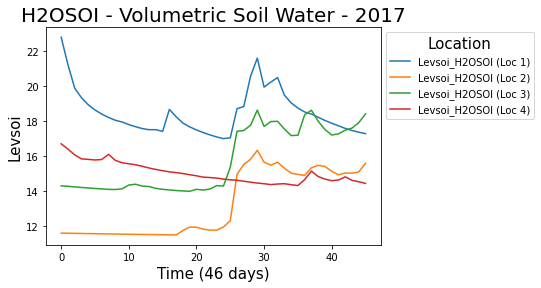

In [333]:
df_merged_year_2.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2017",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Year 2018 (All Locations)</font></u></b>

In [334]:
df_merged_year_3 = pd.concat([df_loc_1_H2OSOI_f3_5_mean, df_loc_2_H2OSOI_f3_5_mean, df_loc_3_H2OSOI_f3_5_mean, df_loc_4_H2OSOI_f3_5_mean], axis=1, join="inner")
df_merged_year_3.columns = ['Levsoi_H2OSOI (Loc 1)', 'Levsoi_H2OSOI (Loc 2)', 'Levsoi_H2OSOI (Loc 3)','Levsoi_H2OSOI (Loc 4)']
df_merged_year_3

,Levsoi_H2OSOI (Loc 1),Levsoi_H2OSOI (Loc 2),Levsoi_H2OSOI (Loc 3),Levsoi_H2OSOI (Loc 4)
0,15.875613,13.176565,14.777524,16.915628
1,15.849719,13.299685,14.792361,16.790203
2,15.762996,13.285428,14.986746,16.704048
3,15.673174,13.414195,14.737679,16.612926
4,15.586138,13.977678,14.513987,16.508787
5,15.598192,14.217346,15.233182,16.407187
6,15.536860,14.642525,15.400602,16.313070
7,15.463732,14.848193,15.374461,16.246777
8,15.395414,15.033000,15.136133,16.228764
9,15.322142,15.497385,15.121857,16.188690


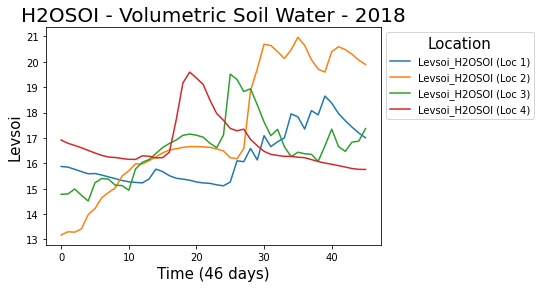

In [335]:
df_merged_year_3.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2018",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Year 2019 (All Locations)</font></u></b>

In [336]:
df_merged_year_4 = pd.concat([df_loc_1_H2OSOI_f4_5_mean, df_loc_2_H2OSOI_f4_5_mean, df_loc_3_H2OSOI_f4_5_mean, df_loc_4_H2OSOI_f4_5_mean], axis=1, join="inner")
df_merged_year_4.columns = ['Levsoi_H2OSOI (Loc 1)', 'Levsoi_H2OSOI (Loc 2)', 'Levsoi_H2OSOI (Loc 3)','Levsoi_H2OSOI (Loc 4)']
df_merged_year_4

,Levsoi_H2OSOI (Loc 1),Levsoi_H2OSOI (Loc 2),Levsoi_H2OSOI (Loc 3),Levsoi_H2OSOI (Loc 4)
0,17.484032,11.352028,15.838010,15.202067
1,17.349758,11.346690,15.493696,15.070905
2,17.036493,11.338173,15.219327,14.999464
3,16.738329,11.330518,14.960551,14.938489
4,16.490585,11.323273,14.434047,15.197284
5,16.261141,11.316315,14.315944,15.243947
6,16.058903,11.309593,14.197176,15.074855
7,15.869818,11.303059,14.096524,15.011541
8,15.695730,11.296700,13.986717,14.947374
9,15.533995,11.290502,13.913632,14.882032


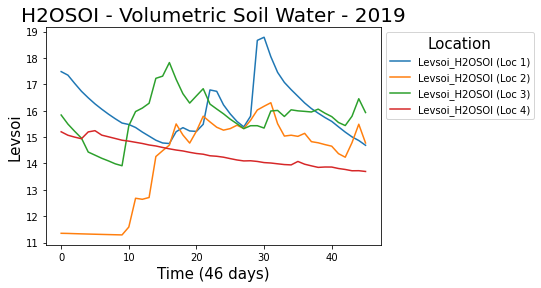

In [337]:
df_merged_year_4.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2019",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Year 2020 (All Locations)</font></u></b>

In [338]:
df_merged_year_5 = pd.concat([df_loc_1_H2OSOI_f5_5_mean, df_loc_2_H2OSOI_f5_5_mean, df_loc_3_H2OSOI_f5_5_mean, df_loc_4_H2OSOI_f5_5_mean], axis=1, join="inner")
df_merged_year_5.columns = ['Levsoi_H2OSOI (Loc 1)', 'Levsoi_H2OSOI (Loc 2)', 'Levsoi_H2OSOI (Loc 3)','Levsoi_H2OSOI (Loc 4)']
df_merged_year_5

,Levsoi_H2OSOI (Loc 1),Levsoi_H2OSOI (Loc 2),Levsoi_H2OSOI (Loc 3),Levsoi_H2OSOI (Loc 4)
0,17.189484,11.241693,16.424183,15.139633
1,17.175732,11.238192,16.424944,14.989186
2,17.007946,11.222798,16.106995,14.907927
3,16.867619,11.210078,15.157913,14.820758
4,16.734791,11.197780,14.479083,14.792158
5,16.577902,11.186044,14.221724,14.772165
6,16.445099,11.173298,14.237576,14.825192
7,16.328617,11.164265,14.367755,14.756261
8,16.265352,11.156220,14.465695,14.728594
9,16.184345,11.146591,14.848239,14.694536


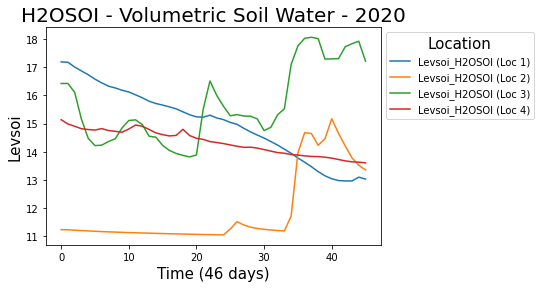

In [339]:
df_merged_year_5.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2020",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Year 2021 (All Locations)</font></u><b>

In [340]:
df_merged_year_6 = pd.concat([df_loc_1_H2OSOI_f6_5_mean, df_loc_2_H2OSOI_f6_5_mean, df_loc_3_H2OSOI_f6_5_mean, df_loc_4_H2OSOI_f6_5_mean], axis=1, join="inner")
df_merged_year_6.columns = ['Levsoi_H2OSOI (Loc 1)', 'Levsoi_H2OSOI (Loc 2)', 'Levsoi_H2OSOI (Loc 3)','Levsoi_H2OSOI (Loc 4)']
df_merged_year_6

,Levsoi_H2OSOI (Loc 1),Levsoi_H2OSOI (Loc 2),Levsoi_H2OSOI (Loc 3),Levsoi_H2OSOI (Loc 4)
0,9.614916,10.153958,12.776123,15.535393
1,10.143068,10.151833,12.865364,15.341763
2,10.669086,10.153265,12.836270,15.219780
3,10.640987,10.154430,12.972803,15.140437
4,10.727114,10.156668,13.659714,15.447741
5,14.140676,10.158687,14.917536,17.076864
6,14.684851,10.317354,14.821405,17.368860
7,15.547188,10.937311,15.023163,17.196127
8,15.120333,10.821506,14.968134,16.913464
9,14.967705,10.679364,15.097885,16.556229


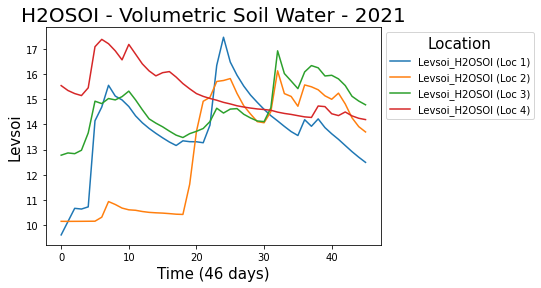

In [341]:
df_merged_year_6.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2021",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Year 2022 (All Locations)</font></u></b>

In [342]:
df_merged_year_7 = pd.concat([df_loc_1_H2OSOI_f7_5_mean, df_loc_2_H2OSOI_f7_5_mean, df_loc_3_H2OSOI_f7_5_mean, df_loc_4_H2OSOI_f7_5_mean], axis=1, join="inner")
df_merged_year_7.columns = ['Levsoi_H2OSOI (Loc 1)', 'Levsoi_H2OSOI (Loc 2)', 'Levsoi_H2OSOI (Loc 3)','Levsoi_H2OSOI (Loc 4)']
df_merged_year_7

,Levsoi_H2OSOI (Loc 1),Levsoi_H2OSOI (Loc 2),Levsoi_H2OSOI (Loc 3),Levsoi_H2OSOI (Loc 4)
0,13.374588,11.667344,13.034024,18.136625
1,13.401944,11.689825,13.028066,17.939030
2,13.310885,11.745731,13.023476,18.118753
3,13.249552,11.930266,13.098627,17.850903
4,13.157095,12.120344,13.092015,17.768789
5,13.063293,12.240297,13.036077,17.517912
6,12.963376,12.310768,13.543599,17.519650
7,12.859723,12.722669,15.408689,17.360058
8,12.770340,13.768977,16.811087,17.222507
9,12.727624,13.452791,16.810585,17.041449


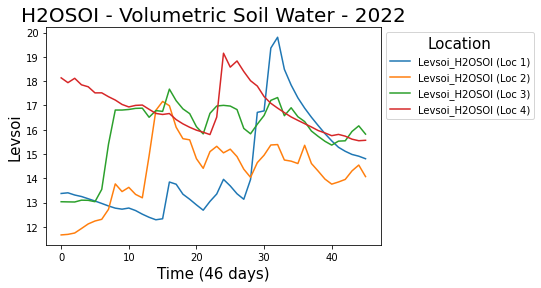

In [343]:
df_merged_year_7.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - 2022",size=20)
plt.legend(title= 'Location', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Location 1 (All years)</font></u></b>

In [344]:
df_location_1 = pd.concat([df_loc_1_H2OSOI_f1_5_mean, df_loc_1_H2OSOI_f2_5_mean,df_loc_1_H2OSOI_f3_5_mean, df_loc_1_H2OSOI_f4_5_mean, df_loc_1_H2OSOI_f5_5_mean, df_loc_1_H2OSOI_f6_5_mean, df_loc_1_H2OSOI_f7_5_mean], axis = 1, join = "inner")
df_location_1.columns = ['2016','2017','2018','2019','2020','2021','2022']
df_location_1

,2016,2017,2018,2019,2020,2021,2022
0,14.321718,22.795145,15.875613,17.484032,17.189484,9.614916,13.374588
1,14.287066,21.226263,15.849719,17.349758,17.175732,10.143068,13.401944
2,14.163290,19.880110,15.762996,17.036493,17.007946,10.669086,13.310885
3,14.070190,19.334320,15.673174,16.738329,16.867619,10.640987,13.249552
4,13.968442,18.932049,15.586138,16.490585,16.734791,10.727114,13.157095
5,13.855377,18.634800,15.598192,16.261141,16.577902,14.140676,13.063293
6,13.753140,18.395191,15.536860,16.058903,16.445099,14.684851,12.963376
7,14.077191,18.205736,15.463732,15.869818,16.328617,15.547188,12.859723
8,14.646944,18.043409,15.395414,15.695730,16.265352,15.120333,12.770340
9,14.376219,17.944670,15.322142,15.533995,16.184345,14.967705,12.727624


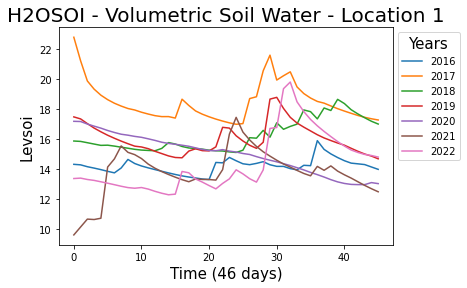

In [345]:
#Plotting the H2OSOI variable DataFrame for Location 1 using line plot function

df_location_1.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - Location 1",size=20)
plt.legend(title= 'Years', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Location 2 (All years)</font></u></b>

In [346]:
df_location_2 = pd.concat([df_loc_2_H2OSOI_f1_5_mean, df_loc_2_H2OSOI_f2_5_mean,df_loc_2_H2OSOI_f3_5_mean, df_loc_2_H2OSOI_f4_5_mean, df_loc_2_H2OSOI_f5_5_mean, df_loc_2_H2OSOI_f6_5_mean, df_loc_2_H2OSOI_f7_5_mean], axis = 1, join = "inner")
df_location_2.columns = ['2016','2017','2018','2019','2020','2021','2022']
df_location_2

,2016,2017,2018,2019,2020,2021,2022
0,12.203051,11.582263,13.176565,11.352028,11.241693,10.153958,11.667344
1,12.193378,11.577162,13.299685,11.346690,11.238192,10.151833,11.689825
2,12.177407,11.569279,13.285428,11.338173,11.222798,10.153265,11.745731
3,12.220677,11.562220,13.414195,11.330518,11.210078,10.154430,11.930266
4,12.435870,11.555515,13.977678,11.323273,11.197780,10.156668,12.120344
5,12.523401,11.549044,14.217346,11.316315,11.186044,10.158687,12.240297
6,12.732605,11.542741,14.642525,11.309593,11.173298,10.317354,12.310768
7,12.751141,11.536581,14.848193,11.303059,11.164265,10.937311,12.722669
8,12.613014,11.530542,15.033000,11.296700,11.156220,10.821506,13.768977
9,12.749444,11.524611,15.497385,11.290502,11.146591,10.679364,13.452791


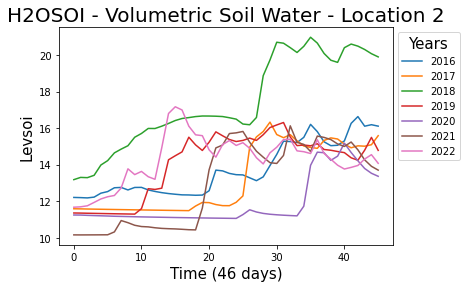

In [347]:
#Plotting the H2OSOI variable DataFrame for Location 2 using line plot function
df_location_2.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - Location 2",size=20)
plt.legend(title= 'Years', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Location 3 (All years)</font></u></b>

In [348]:
df_location_3 = pd.concat([df_loc_3_H2OSOI_f1_5_mean, df_loc_3_H2OSOI_f2_5_mean,df_loc_3_H2OSOI_f3_5_mean, df_loc_3_H2OSOI_f4_5_mean, df_loc_3_H2OSOI_f5_5_mean, df_loc_3_H2OSOI_f6_5_mean, df_loc_3_H2OSOI_f7_5_mean], axis = 1, join = "inner")
df_location_3.columns = ['2016','2017','2018','2019','2020','2021','2022']
df_location_3

,2016,2017,2018,2019,2020,2021,2022
0,13.953276,14.285536,14.777524,15.838010,16.424183,12.776123,13.034024
1,13.942017,14.264458,14.792361,15.493696,16.424944,12.865364,13.028066
2,14.020358,14.229078,14.986746,15.219327,16.106995,12.836270,13.023476
3,14.256821,14.197065,14.737679,14.960551,15.157913,12.972803,13.098627
4,14.234830,14.167631,14.513987,14.434047,14.479083,13.659714,13.092015
5,14.472099,14.140097,15.233182,14.315944,14.221724,14.917536,13.036077
6,15.428810,14.113779,15.400602,14.197176,14.237576,14.821405,13.543599
7,15.549853,14.087570,15.374461,14.096524,14.367755,15.023163,15.408689
8,15.397591,14.080795,15.136133,13.986717,14.465695,14.968134,16.811087
9,15.329042,14.117627,15.121857,13.913632,14.848239,15.097885,16.810585


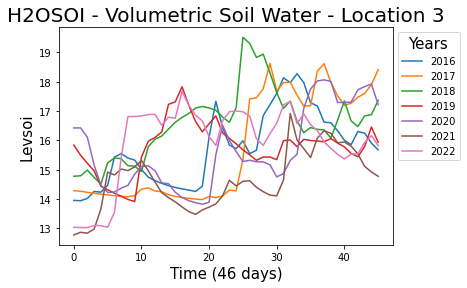

In [349]:
#Plotting the H2OSOI variable DataFrame for Location 3 using line plot function
df_location_3.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - Location 3",size=20)
plt.legend(title= 'Years', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));

<b><u><font size="5"><font color = "blue">Mean Levsoi of H2OSOI - Location 4 (All years)</font></u></b>

In [350]:
df_location_4 = pd.concat([df_loc_4_H2OSOI_f1_5_mean, df_loc_4_H2OSOI_f2_5_mean,df_loc_4_H2OSOI_f3_5_mean, df_loc_4_H2OSOI_f4_5_mean, df_loc_4_H2OSOI_f5_5_mean, df_loc_4_H2OSOI_f6_5_mean, df_loc_4_H2OSOI_f7_5_mean], axis = 1, join = "inner")
df_location_4.columns = ['2016','2017','2018','2019','2020','2021','2022']
df_location_4

,2016,2017,2018,2019,2020,2021,2022
0,18.591328,16.695896,16.915628,15.202067,15.139633,15.535393,18.136625
1,18.273129,16.393379,16.790203,15.070905,14.989186,15.341763,17.939030
2,18.024784,16.061394,16.704048,14.999464,14.907927,15.219780,18.118753
3,17.872812,15.832563,16.612926,14.938489,14.820758,15.140437,17.850903
4,17.752537,15.805835,16.508787,15.197284,14.792158,15.447741,17.768789
5,17.633812,15.769916,16.407187,15.243947,14.772165,17.076864,17.517912
6,17.513565,15.796657,16.313070,15.074855,14.825192,17.368860,17.519650
7,17.407541,16.092579,16.246777,15.011541,14.756261,17.196127,17.360058
8,17.330847,15.749487,16.228764,14.947374,14.728594,16.913464,17.222507
9,17.271755,15.612126,16.188690,14.882032,14.694536,16.556229,17.041449


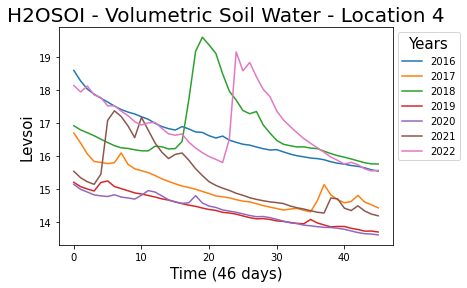

In [351]:
#Plotting the H2OSOI variable DataFrame for Location 4 using line plot function
df_location_4.plot()
plt.xlabel("Time (46 days)",size=15)
plt.ylabel("Levsoi",size=15)
plt.title("H2OSOI - Volumetric Soil Water - Location 4",size=20)
plt.legend(title= 'Years', title_fontsize = 15, prop = {'size' : 10},  bbox_to_anchor= (1, 1));